In [8]:
#!/usr/bin/env python
# coding: utf-8
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import openpyxl
import os, re
from datetime import date
import time, sys
import math
import pickle
import random
#import matplotlib.cm as cm
import matplotlib.patches as patches
import matplotlib.colors as mcolors
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from numpy import linalg as LA
import shapely
import shapely.geometry
from shapely import box, LineString, normalize, Polygon
from shapely.geometry import LineString, Polygon
from shapely.geometry.polygon import orient
from shapely.ops import unary_union
from sklearn.decomposition import PCA
from scipy.ndimage import gaussian_filter1d
%matplotlib inline  

In [2]:
def make_spots(FG_density,a, b, top_status,cell, spindle_poles, frame):
    """
    Generate spots based on the provided parameters.
    """
    # uniform_status=1 # Manual switch for adding a set of uniformly distributed FGs in addition to the existing ones
    n_points=int(FG_density*calculate_perimeter(cell))

    
    if(cell_type=='celegans'):
        
        spots=cell[1::int(len(cell)/n_points)]
        
        # angles=get_sequence_celegans(int(0.3*n_points))
        # spots=np.zeros((len(angles),2)) # Right side or posterior has n/2 points
        # spots[:,0] = a*natural_cell_radius*np.cos(angles)
        # spots[:,1] = b*natural_cell_radius*np.sin(angles)
        # angles2=get_sequence_celegans(int(0.2*n_points))
        # spots2=np.zeros((len(angles2),2)) # Left side or anterior has n/3 points
        # spots2[:,0] = -a*natural_cell_radius*np.cos(angles2)
        # spots2[:,1] = b*natural_cell_radius*np.sin(angles2)
        # spots=np.concatenate((spots,spots2))
        
        # if (uniform_status==1):
        #     n_top=n_points//2 # Add an arbitrary number of uniformly distributed FGs in addition to the existing ones
        #     spots_on_top=np.zeros((int(0.5*n_points),2))
        #     angles_top = np.linspace(0, 2*np.pi, int(0.5*n_points)+1)[:-1].copy()
        #     spots_on_top[:,0] = a*natural_cell_radius*np.cos(angles_top)
        #     spots_on_top[:,1] = b*natural_cell_radius*np.sin(angles_top)
        #     spots=np.concatenate((spots,spots_on_top))# uncomment to add spots_on_top lol
       
    elif(cell_type=='endo'):
        juncs=transform_junctions()
        
        dist1=distance_matrix(np.array([juncs[frame-1,1]]),cell) #find new closest spot
        end_spot_index=np.argmin(dist1[0])

        dist2=distance_matrix(np.array([juncs[frame-1,0]]),cell) #find new closest spot
        start_spot_index=np.argmin(dist2[0])

        # Slice FGs from cell array based on junction start and end position and motor density
        partial_perimeter=calculate_partial_perimeter(cell, start_spot_index, end_spot_index)

        # print(f'partial P={partial_perimeter}')
        n_points_junc=4*FG_density*partial_perimeter
        # print(f'n_points_junc={n_points_junc}')
        spots = slice_array(cell, start_spot_index, end_spot_index, int(n_points_junc))
    elif(cell_type=='FE'):
        
        spots=np.zeros((n_points//2,2)) #make right half of the points first, then reflect and concatenate both sides into one array
        angles=get_sequence(n_points//2)

        # For squeezed cells to readjust FGs positions because they are based on angles need to readjust angles
        if (a!=b):
            for i in range (len(angles)):
                dumb=delta_theta(a,b,angles[i])
                angles[i]=dumb
                
        # Calculate positions of the spots on the right half of the cell and mirror them to create the left half and concatenate two halves    
        spots[:,0] = a*natural_cell_radius*np.cos(angles-0*np.pi)
        spots[:,1] = b*natural_cell_radius*np.sin(angles-0*np.pi)
        
        other_half=np.zeros((n_points//2,2)) #spots on left side
        other_half[:,0]=-spots[:,0]
        other_half[:,1]=spots[:,1]
        other_half=other_half[1:]
        spots=np.concatenate((spots[1:],other_half))

        # Add extra FGs at the top/apical surface of the cell
        if (top_status==1):
            
            n_top=n_points
            angles=np.linspace(np.pi/6, 5*np.pi/6, n_top)
            # angles=get_sequence_top(n_top) The option to make top/apical FGs non-uniformly distributed
            spots_apical=np.zeros((len(angles),2))
            spots_apical[:,0] = a*natural_cell_radius*np.cos(angles)
            spots_apical[:,1] = b*natural_cell_radius*np.sin(angles)            

            # spots=np.concatenate((spots,spots_apical)) 
            
    return spots#_apical

def slice_array(array, start, end, num_points):
    if num_points < 2:
        raise ValueError("num_points must be at least 2 to form a slice with distinct start and end points")
    
    # Calculate the step size
    step = (end - start) / (num_points - 1)
    
    # Generate the indices for the slice
    indices = np.linspace(start, end, num_points).astype(int)
    
    # Use the indices to slice the array
    return array[indices]

def calculate_perimeter(coordinates):
    # Ensure the input is a NumPy array
    coordinates = np.asarray(coordinates)
    
    # Check that the array is not empty and has the correct shape
    if coordinates.size == 0 or coordinates.shape[1] != 2:
        raise ValueError("Input must be a non-empty array with shape (N, 2)")
    
    # Calculate the distance between consecutive points
    distances = np.sqrt(np.sum(np.diff(coordinates, axis=0)**2, axis=1))
    
    # Add the distance between the last and the first point to close the loop
    closing_distance = np.sqrt(np.sum((coordinates[0] - coordinates[-1])**2))
    
    # Sum all distances to get the perimeter
    perimeter = np.sum(distances) + closing_distance
    
    return perimeter

def calculate_partial_perimeter(coordinates, i, j):
    # Ensure the input is a NumPy array
    coordinates = np.asarray(coordinates)
    
    # Check that the array is not empty and has the correct shape
    if coordinates.size == 0 or coordinates.shape[1] != 2:
        raise ValueError("Input must be a non-empty array with shape (N, 2)")
    
    # Normalize indices to ensure i < j
    if i > j:
        i, j = j, i
    
    # Extract the subarray of coordinates between indices i and j (inclusive)
    subarray = coordinates[i:j+1]
    
    # Calculate the distance between consecutive points
    distances = np.sqrt(np.sum(np.diff(subarray, axis=0)**2, axis=1))
    
    # Add the distance between the last and the first point to close the loop
    closing_distance = np.sqrt(np.sum((subarray[0] - subarray[-1])**2))
    
    # Sum all distances to get the perimeter
    perimeter = np.sum(distances) + closing_distance
    
    return perimeter
    
def enhance_cell(cell):
    """
    The spacings between raw cell contour vertices are unequal. This function fixes it. 
    """
    new_cell=[]
    max_interj_dist=0.005
    #max_interj_dist=natural_spacing
    for i in range (len(cell)):
        if(i==len(cell)-1):
            next=0
        else:
            next=i+1
        dist=LA.norm([cell[i,0]-cell[next,0],cell[i,1]-cell[next,1]])
        if (dist>max_interj_dist):
            new_cell.append(cell[i])
            spread=np.linspace(0,dist,int(dist/max_interj_dist))[1:-1]
            vec=np.array([cell[next,0]-cell[i,0],cell[next,1]-cell[i,1]])/dist#+cell[i]
            for j in range (len(spread)):
                new_add=spread[j]*vec+cell[i]
                new_cell.append(new_add)    
        else:
            new_cell.append(cell[i])
    new_cell_ar=np.zeros((len(new_cell),2))
    for i in range (len(new_cell)):
        new_cell_ar[i]=new_cell[i]
    return new_cell_ar

# Log function to non-linearly distribute FGs 
def log_func(x): 
    return 0.5*(np.log(x+1/np.exp(np.pi)))

def log_func_top(x):
    return 0.3*np.log(x+1/np.exp(1))+np.pi/4+0.3

def log_func_top2(x):
    return -0.3*np.log(x+1/np.exp(1))+3*np.pi/4-0.3

def log_func_celegans(x):
    return -np.log(x+1)+np.pi/3

def get_sequence(n_points): #gives you the sequence of angles (theta) that acts as coordinates (x=r cos theta, y=r sin theta) where to put spots or protein machines
    
    sequence=np.zeros((n_points))
    step=((np.exp(np.pi/2))-1/(np.exp(np.pi)))/n_points
    for i in range (n_points):
        sequence[i]=log_func(i*step)
        
    return sequence

def get_sequence_top(n_points): #same but for the apical surface
    
    sequence=np.zeros((n_points)//2+1)
    sequence2=np.zeros((n_points)//2)
    step=(4.67)/(n_points//2)
    for i in range (n_points//2):
        sequence[i]=log_func_top(i*step)
    for i in range (n_points//2):
        sequence2[i]=log_func_top2(i*step)
    dum=sequence2[::-1]
    sequence[(n_points)//2]=0.5*(sequence[-2]+dum[0])
    sequence=np.concatenate((sequence,dum))

    return sequence

def get_sequence_celegans(n_points):
    
    sequence=np.zeros((n_points)//2+1)
    step=(np.exp(np.pi/3)-1)/(n_points//2)
    for i in range (n_points//2+1):
        sequence[i]=log_func_celegans(i*step)
    dum=-sequence[::-1]
    sequence=np.concatenate((sequence,dum[1:]))
    
    return sequence


def point_in_polygon(point, polygon):
    """
    For checking if spindle poles leave the cell boundary.
    """
    x, y = point
    n = len(polygon)
    inside = False

    p1x, p1y = polygon[0]
    for i in range(n + 1):
        p2x, p2y = polygon[i % n]
        if y > min(p1y, p2y) and y <= max(p1y, p2y) and x <= max(p1x, p2x):
            if p1y != p2y:
                x_inters = (y - p1y) * (p2x - p1x) / (p2y - p1y) + p1x
                if p1x == p2x or x <= x_inters:
                    inside = not inside
        p1x, p1y = p2x, p2y

    return inside

def intersect_cell(a,b, angle,start_point, cell):
    """
    Deploys shapely module to find an intersection between astral MTs and cell cortex
    """
    # NumPy array
    end_point=start_point+4*np.array([np.cos(angle),np.sin(angle)])

    
    numpy_line_coords = np.array([start_point,end_point])
    # Convert to Shapely LineString
    shapely_line = shapely.geometry.LineString(numpy_line_coords)
    shapely_string = LineString(cell)
    inter=shapely.intersection(shapely_string, shapely_line)

    
    if(inter.geom_type=='Point'):
        return np.array([inter.x,inter.y])  , inter.geom_type
    elif(inter.geom_type=='MultiPoint'):
        points = [p for p in inter.geoms]
        dist=[]
        for i in range (len(points)):
            dist.append(LA.norm([start_point[0]-points[i].x,start_point[1]-points[i].y]))
        return np.array([points[np.argsort(dist)[0]].x,points[np.argsort(dist)[0]].y]),  inter.geom_type
    else:
        #print(f'intersection type:{inter.geom_type}, start={start_point}, end={end_point}')
        #print(np.asanyarray(inter))
        intersect=intersect_cell_old(a,b, angle,start_point, cell)
        return intersect, inter.geom_type #start_point+0.8*MT_max_length*np.array([np.cos(angle),np.sin(angle)])

def intersect_cell_old(a,b,angle,C,cell):
    """
    When astral MT's is shrinking but spindle moves towards the cortex there are 3 cases:
    1. End is outside
    2. End is inside
    This function basically tells if the end is inside keep it there, if its outside, find the cortex intersect and take the end there.
    """
    L_cell=2*np.pi/number_of_sides
    D=C
    L_min=min(a,b)#natural_cell_radius
    j=0
    dist=distance_matrix(np.array([C]),cell)[0]
    while (L_min>L_cell):# and (C[0]/a)**2+(C[1]/b)**2<1.05):
        if (j>10):
            break
        dist=distance_matrix(np.array([C]),cell)[0]
        L_min=np.min(dist)
        C=C+L_min*np.array([np.cos(angle),np.sin(angle)])
        j=j+1
    
    D=C+2*np.array([np.cos(angle),np.sin(angle)])
    k = 2
    result = np.argpartition(dist, k)
    cell_small1,cell_small2=result[:k]
    small_dist1,small_dist2=dist[result[:k]]
    A=cell[cell_small1]
    B=cell[cell_small2]
    # Line AB represented as a1x + b1y = c1
    a1 = B[1] - A[1]
    b1 = A[0] - B[0]
    c1 = a1*(A[0]) + b1*(A[1])
    # Line CD represented as a2x + b2y = c2
    a2 = D[1] - C[1]
    b2 = C[0] - D[0]
    c2 = a2*(C[0]) + b2*(C[1])
    determinant = a1*b2 - a2*b1
    if (determinant == 0):
        return D
    else:
        x = (b2*c1 - b1*c2)/determinant
        y = (a1*c2 - a2*c1)/determinant
        intersect=np.array([x, y])
        return intersect

        
def distance_matrix(xz1, xz2):
    mutx1 = np.outer(np.ones(len(xz2[:,0])), xz1[:,0])
    mutz1 = np.outer(np.ones(len(xz2[:,0])), xz1[:,1])
    mutx2 = np.outer(xz2[:,0], np.ones(len(xz1[:,0])))
    mutz2 = np.outer(xz2[:,1], np.ones(len(xz1[:,0])))
    return np.sqrt((mutx1-mutx2)**2+(mutz1-mutz2)**2).transpose()

def delta_theta(a,b,theta):

    if a*b ==3:# or theta <0 or theta>2*np.pi:
        #return 'What the fuck....'
        c=1+3
    else:
        if (theta<0):
            theta=theta+2*np.pi
        if (theta>2*np.pi):
            theta=theta-2*np.pi
        if a>=b:
            if theta<=np.pi/2:
                return -np.arccos((a*np.cos(theta)**2+b*np.sin(theta)**2) / np.sqrt((a*np.cos(theta))**2+(b*np.sin(theta))**2))+theta
            elif theta<=np.pi:
                return np.arccos((a*np.cos(theta)**2+b*np.sin(theta)**2) / np.sqrt((a*np.cos(theta))**2+(b*np.sin(theta))**2))+theta
            elif theta<=3*np.pi/2:
                return -np.arccos((a*np.cos(theta)**2+b*np.sin(theta)**2) / np.sqrt((a*np.cos(theta))**2+(b*np.sin(theta))**2))+theta
            else:
                return np.arccos((a*np.cos(theta)**2+b*np.sin(theta)**2) / np.sqrt((a*np.cos(theta))**2+(b*np.sin(theta))**2))+theta
        else:
            if theta<=np.pi/2:
                return np.arccos((a*np.cos(theta)**2+b*np.sin(theta)**2) / np.sqrt((a*np.cos(theta))**2+(b*np.sin(theta))**2))+theta
            elif theta<=np.pi:
                return -np.arccos((a*np.cos(theta)**2+b*np.sin(theta)**2) / np.sqrt((a*np.cos(theta))**2+(b*np.sin(theta))**2))+theta
            elif theta<=3*np.pi/2:
                return np.arccos((a*np.cos(theta)**2+b*np.sin(theta)**2) / np.sqrt((a*np.cos(theta))**2+(b*np.sin(theta))**2))+theta
            else:
                return -np.arccos((a*np.cos(theta)**2+b*np.sin(theta)**2) / np.sqrt((a*np.cos(theta))**2+(b*np.sin(theta))**2))+theta


def get_contours(image_path):

    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian Blur to reduce noise and detail
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Apply edge detection using Canny
    edges = cv2.Canny(blurred, 50, 150)
    
    # Find contours in the edge-detected image
    contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    smoothed_contours = []


    # Smoothen each contour
    for contour in contours:
        # Approximate the contour with a smoother curve
        epsilon = 0.0001 * cv2.arcLength(contour, True)
        smoothed_contour = cv2.approxPolyDP(contour, epsilon, True)
        smoothed_contours.append(smoothed_contour)

    # Concatenate all contour points into a single array
    all_points = np.concatenate([contour.squeeze() for contour in smoothed_contours])
    all_points[:, 1] = -all_points[:, 1]

    return all_points



def find_long_axis_and_width(polygon_points):
    # Convert the polygon points into a NumPy array
    points = np.array(polygon_points)
    
    # Apply PCA to find the major axis (long axis)
    pca = PCA(n_components=2)
    pca.fit(points)
    
    # The long axis is along the first principal component
    long_axis_vector = pca.components_[0]
    long_axis_length = np.ptp(np.dot(points, long_axis_vector))
    
    # The second principal component is orthogonal to the long axis (this is the width)
    width_vector = pca.components_[1]
    width_length = np.ptp(np.dot(points, width_vector))
    
    return long_axis_vector, long_axis_length, width_vector, width_length

def smoothen_cell(cell):
    # Example: Replace this with your actual contour coordinates (N, 2)
    contours = cell  # Replace with actual contour coordinates
    
    # Separate x and y coordinates
    x = contours[:, 0]
    y = contours[:, 1]
    
    # Apply Gaussian smoothing to both x and y coordinates
    sigma = 10  # Adjust sigma for more or less smoothing
    x_smooth = gaussian_filter1d(x, sigma=sigma)
    y_smooth = gaussian_filter1d(y, sigma=sigma)
    
    # Combine the smoothed x and y coordinates back into an array
    smoothed_contours = np.column_stack((x_smooth, y_smooth))
    
    # Plot the original and smoothed contours for comparison
    # plt.figure(figsize=(6, 6))
    # plt.plot(x, y, label='Original Contours', color='red', linewidth=2)
    # plt.plot(x_smooth, y_smooth, label='Smoothed Contours', color='blue', linewidth=2)
    # plt.legend()
    # plt.gca().set_aspect('equal')
    # plt.title('Original vs Smoothed Contours')
    # plt.show()
    return smoothed_contours




def close_contours(contours):
    """
    Turn a contour array into a closed loop by adding points between the start and end
    such that the distance between points is less than or equal to `min_spacing`.

    Parameters:
    -----------
    contours : np.ndarray
        The array of contour coordinates with shape (N, 2).
    min_spacing : float
        The minimal spacing between the points to be added.

    Returns:
    --------
    closed_contours : np.ndarray
        The array of contour coordinates with the newly added points to close the loop.
    """
    # Extract the start and end points
    end_point = contours[0]
    start_point = contours[-1]

 

    # Calculate the Euclidean distance between the start and end points
    distance = np.linalg.norm(end_point - start_point)
    
    min_spacing=0.005
    # Calculate how many points to add based on the minimal spacing
    num_points_to_add = int(np.ceil(distance / min_spacing))
 

    # Create the interpolation for the required number of points
    x_new = np.linspace(start_point[0], end_point[0], num_points_to_add + 2)  # +2 includes start and end points
    y_new = np.linspace(start_point[1], end_point[1], num_points_to_add + 2)

    # Remove the first and last points from the new points to avoid duplication with original points
    x_new = x_new[1:-1]
    y_new = y_new[1:-1]

    # Combine the new points into a new array
    new_points = np.column_stack((x_new, y_new))

    # Combine original contours with new points to form a closed contour
    closed_contours = np.vstack([contours, new_points])

    # Close the loop by adding the first point at the end
    # closed_contours = np.vstack([closed_contours, closed_contours[0]])

   
    
    return closed_contours

    # # Example usage:
    # contours = np.array([[0, 0], [1, 2], [2, 3], [3, 2], [4, 0]])  # Replace with actual contour coordinates
    # min_spacing = 0.5  # Minimal spacing between points
    
    # # Call the function
    # closed_contours = close_contour_with_spacing(contours, min_spacing)
    
    # # Plot the original and closed contours for comparison
    # plt.figure(figsize=(6, 6))
    # plt.plot(contours[:, 0], contours[:, 1], label='Original Contour', color='blue', marker='o')
    # plt.plot(closed_contours[:, 0], closed_contours[:, 1], label='Closed Contour', color='red', linestyle='--', marker='o')
    # plt.legend()
    # plt.title(f'Closed Contour with Minimal Spacing = {min_spacing}')
    # plt.show()
    
    # print("Closed contour shape:", closed_contours.shape)


def make_cell(params):
    """
    Returns an array (N,2) of x,y coordinates of vertices of a polygon representing the cell
    """
    a=params[0][0]
    r=params[0][2] #spindle length=2*r
    FG_density=int(params[1])
    n_astro=int(params[2])
    b=params[0][1]
    spindle_angle=params[3]#np.random.uniform(0,np.pi)
    theta = np.linspace(0, 2*np.pi, number_of_sides+1)[:-1].copy()
   
    
    if (cell_type=='endo'):

        # Read the image
        image_path='./cells/cell_'+str(c)+'/Mask_'+str(starts[c-1])+'.jpg'
        # Get the raw contours and rescale them
        all_points=get_contours(image_path)
        # x = all_points[:, 0]
        # y = all_points[:, 1]
        
        # # Apply Gaussian smoothing to both x and y coordinates
        # sigma = 10  # Adjust sigma for more or less smoothing
        # x_smooth = gaussian_filter1d(x, sigma=sigma)
        # y_smooth = gaussian_filter1d(y, sigma=sigma)

        # # Combine the smoothed x and y coordinates back into an array
        # all_points = np.column_stack((x_smooth, y_smooth))
        cell_input=np.zeros((len(all_points),2))
        for i in range (len(cell_input)):
            cell_input[i,0]=all_points[i,0]/rescale[c-1]
            cell_input[i,1]=all_points[i,1]/rescale[c-1]
        # Yassify raw cell contours
        cell=enhance_cell(cell_input)


        if (c>12):
            spindle_contour=get_contours('./spindles/spindle_'+str(c)+'/Mask_'+str(starts[c-1])+'.jpg')
        else:
            spindle_contour=get_contours('./spindles/spindle_'+str(c)+'/Spindle_'+str(starts[c-1])+'.jpg')
        spindle_input=np.zeros((len(spindle_contour),2))
        for i in range (len(spindle_input)):
            spindle_input[i,0]=spindle_contour[i,0]/rescale[c-1]
            spindle_input[i,1]=spindle_contour[i,1]/rescale[c-1]
        
        shapely_string = LineString(spindle_input)
        spindle_center=np.array([shapely_string.centroid.x,shapely_string.centroid.y])
        # print(f'spindle center -{20.61,31.83} -> {spindle_center}')
        # FGs
        # file_path = "/Users/ayn6k/Downloads/code/junctions/C1_Mask_Movie_Junctions.txt"
        # data = np.loadtxt(file_path)
        # juncs = data.reshape(-1, 2, 2)/rescale[c-1]
    else:
        
        cell=np.zeros((number_of_sides,2))
        cell[:,0] = a*natural_cell_radius*np.cos(theta)
        cell[:,1] = b*natural_cell_radius*np.sin(theta)
        # juncs=np.zeros(2,2)
    # Making the spindle
    spindle_poles=np.zeros((2,2))

    # Choosing displacement depending on the cell type for debugging purposes
    if (cell_type=='celegans'):
        displacement=np.array([1.1,0])
    elif(cell_type=='endo'):
        displacement=0*spindle_center
    elif(cell_type=='FE'):
        displacement=0*np.array([-0.5,-0])

    spindle_poles[0]=[r*np.cos(spindle_angle)+displacement[0],r*np.sin(spindle_angle)+displacement[1]]#-0*(np.min(centered_cell[:,1]))]
    spindle_poles[1]=[r*np.cos(spindle_angle+np.pi)+displacement[0],r*np.sin(spindle_angle+np.pi)+displacement[1]]#-0*(np.min(centered_cell[:,1]))]

    if (cell_type=='endo'):
        cell=cell-spindle_center
        # juncs=juncs-spindle_center
        # print(juncs)
        cell=smoothen_cell(cell)
        cell=close_contours(cell)
    #Sometimes the requested spindle angle doesnt fit so adjustment to the angle is made
    i=0
    while (point_in_polygon(spindle_poles[0], cell)==False or point_in_polygon(spindle_poles[1], cell)==False):
        spindle_angle=spindle_angle+np.pi/12
        spindle_poles[0]=[r*np.cos(spindle_angle)+displacement[0],r*np.sin(spindle_angle)+displacement[1]]
        spindle_poles[1]=[r*np.cos(spindle_angle+np.pi)+displacement[0],r*np.sin(spindle_angle+np.pi)+displacement[1]]
        i=i+1
        if(i>12):
            break
            
    # Making motors
    spots=make_spots(FG_density,a, b,params[3],cell, spindle_poles, 1)
    
    # Making astral microtubules
    astral_MTs, astral_angles, state,which_push,which_bind,free_spots,astral_which_spot, orig_length, df_list2=make_astral_MTs(params,cell,spindle_poles, spindle_angle,spots)
    
    return cell,astral_MTs,astral_angles,state,spindle_poles,spindle_angle,spots,which_push,which_bind,free_spots,astral_which_spot,orig_length,df_list2

def transform_junctions():
    # Get spindle size from its contours
    if (c>12):
        spindle_contour=get_contours('./spindles/spindle_'+str(c)+'/Mask_'+str(starts[c-1])+'.jpg')
    else:
        spindle_contour=get_contours('./spindles/spindle_'+str(c)+'/Spindle_'+str(starts[c-1])+'.jpg')
    spindle_input=np.zeros((len(spindle_contour),2))
    for i in range (len(spindle_input)):
        spindle_input[i,0]=spindle_contour[i,0]/rescale[c-1]
        spindle_input[i,1]=spindle_contour[i,1]/rescale[c-1]
    shapely_string = LineString(spindle_input)
    spindle_center=np.array([shapely_string.centroid.x,shapely_string.centroid.y])
    
    # print(f'spindle center -{20.61,31.83} -> {spindle_center}')
    measured_spindle_center=np.array([[20.61,-31.83],
                                       [23.6,-47.2],
                                       [16.15,-52.10],
                                       [0,0],
                                       [14.59,-38.55],
                                       [0,0],
                                       [17.87,-25.61],
                                       [26.79, -28.4],
                                       [14.77, -33.83],
                                       [11.2, -24.55],
                                       [22.29, -55.57],
                                       [16.42, -79.26],
                                       [21.76, -42.18],
                                       [21.33, -49.93],
                                       [27.72, -73.78]])
    # FGs
    file_path = "/Users/ayn6k/Downloads/code/junctions/C"+str(c)+"_Mask_Movie_Junctions.txt"
    data = np.loadtxt(file_path)
    data[:, 1] = -data[:, 1]
    juncs = data.reshape(-1, 2, 2)
   
    transf_coef=spindle_center/measured_spindle_center[c-1]

    juncs=juncs*transf_coef-spindle_center

    return juncs
    
def update_cell(params, t_time):
    """
    Updating cell shape according to live movies
    """
    FG_density=int(params[1])
    # Read the image
    image_path='./cells/cell_'+str(c)+'/Mask_'+str(int(starts[c-1]+t_time/frame_rates[c-1]))+'.jpg'
    # Get the raw contours and rescale them
    all_points=get_contours(image_path)

    cell_input=np.zeros((len(all_points),2))
    for i in range (len(cell_input)):
        cell_input[i,0]=all_points[i,0]/rescale[c-1]
        cell_input[i,1]=all_points[i,1]/rescale[c-1]
    cell=enhance_cell(cell_input)


    # Get spindle size from its contours
    # spindle_contour=get_contours('./spindles/spindle_'+str(c)+'/Spindle_'+str(starts[c-1])+'.jpg')
    if (c>12):
        spindle_contour=get_contours('./spindles/spindle_'+str(c)+'/Mask_'+str(starts[c-1])+'.jpg')
    else:
        spindle_contour=get_contours('./spindles/spindle_'+str(c)+'/Spindle_'+str(starts[c-1])+'.jpg')
    spindle_input=np.zeros((len(spindle_contour),2))
    for i in range (len(spindle_input)):
        spindle_input[i,0]=spindle_contour[i,0]/rescale[c-1]
        spindle_input[i,1]=spindle_contour[i,1]/rescale[c-1]

    shapely_string = LineString(spindle_input)
    spindle_center=np.array([shapely_string.centroid.x,shapely_string.centroid.y])

    cell=cell-spindle_center
    cell=smoothen_cell(cell)
    cell=close_contours(cell)
    return cell
    
def transfer_free_spots(new_length, b1):
    # Create array a1 of specified shape filled with zeroes
    
    a1 = np.zeros(new_length)

    # Determine the length of the smaller array
    min_length = min(new_length, len(b1))
    
    # Transfer elements from b1 to a1
    a1[:min_length] = b1[:min_length]
    
    return a1
def transfer_astro_which(new_length, b1):
    # Create array a1 of specified shape filled with zeroes
    
    a1 = np.zeros((new_length, 2))

    # Determine the length of the smaller array
    min_length = min(new_length, len(b1))
    
    # Transfer elements from b1 to a1
    a1[:min_length] = b1[:min_length]

    return a1

def bounded_normal_random(mean, stdev):
    while True:
        num = random.gauss(mean, stdev)  # Generate from normal distribution
        if 0 <= num <= 1:  # Check if within bounds
            return num
            
def make_astral_MTs(params,cell, spindle_poles, spindle_angle,spots):
    
    a=params[0][0]
    r=params[0][2] #spindle length=2*r
    FG_density=int(params[1])
    n_astro=int(params[2])
    b=params[0][1]
    
    # Initializing all arrays to keep MTs data
    
    state=np.ones((2,(n_astro))) #two states: growing=1, shrinking=-1
    free_spots=np.zeros((len(spots)))#array 0 if spot is free, 1 is taken
    astral_which_spot=np.zeros((len(spots),2))-1 #which astro occupies given spot by index (astral_which_spot[5]=[1,20] means the fifth spot is occupied by (1,20)), i dont remember where -1 is coming from, its coming from not confusing value 0,0 (-1,-1) with actual MT [0,0]
    which_bind=np.zeros((2,int(n_astro))) #astral MTs have binded
    which_push=np.zeros((2,int(n_astro))) #astral MT that push
    astral_MTs=np.zeros((2,int(n_astro),discr,2))
    
    # Astral MTs angles
    astral_angles=np.zeros((2,n_astro))
    astral_angles[0]=np.linspace(spindle_angle-spread/2,spindle_angle+spread/2, n_astro) #predefined angles
    astral_angles[1]=np.linspace(spindle_angle+np.pi-spread/2,spindle_angle+np.pi+spread/2, n_astro)
    
    orig_length=astral_initial_length*np.ones((2,n_astro)) #to keep track of astral MTs lengthes in case of elongation
    
    # orig_length=np.zeros((2,n_astro)) 
    # # Generate the random array
    # N = n_astro  
    
    # orig_length = abs(np.random.normal(loc=mean, scale=stdev, size=(2, N)))
    # # Generate the random array
    # N = n_astro  
    # orig_length = abs(np.random.normal(loc=mean, scale=stdev, size=(2, n_astro)))

    # orig_length=np.zeros((2,n_astro)) 

    

    df_list2=[]  
      
    for i in range (2):
        for j in range (n_astro):
            # length_tc, _ =intersect_cell(a,b,astral_angles[i,j],spindle_poles[i],cell) 
            # orig_length[i,j]=LA.norm(length_tc-spindle_poles[i])*random.uniform(0, 1)#bounded_normal_random(mean, stdev)
            # print(f'orig_length[{i,j}]={orig_length[i,j]}')
            # print(f'astral=[{i,j}]')
            end,state[i,j]=grow_astralMT(a,b,astral_angles[i,j],spindle_poles[i],cell,orig_length[i,j])
            # state[i,j]=1 if (np.random.rand()>0.5) else -1
            astral_MTs[i,j,:,0]=np.linspace(spindle_poles[i,0],end[0],discr)
            astral_MTs[i,j,:,1]=np.linspace(spindle_poles[i,1],end[1],discr)

            which_bind[i,j],free_spots,astral_which_spot=check_bind_init(i, j,astral_MTs[i,j,-1],spindle_poles,spots,free_spots,astral_which_spot) #used to be check_bind_init
            
            if (which_bind[i,j]==1):
                which_push[i,j]=0
                state[i,j]=-1
            # state[i,j]=1 if which_bind[i,j]==0 else -1
            which_push[i,j]=check_push(a,b,astral_MTs[i,j,-1],which_bind[i,j],state[i,j],astral_angles[i,j],spindle_poles[i],cell)
            # which_push[i,j]=check_push_junc(a,b,astral_MTs[i,j,-1],which_bind[i,j],state[i,j],astral_angles[i,j],spindle_poles[i],cell, spots)
            orig_length[i,j]=LA.norm(astral_MTs[i,j,-1]-spindle_poles[i]) 

            # List to keep MTs data
            df_list=[]
            df_list.append(-1)
            df_list.append([i,j])
            df_list.append('Not dead')
            df_list.append('Neither R or C')
            df_list.append('NOT TOO SHORT')
            df_list.append(which_bind[i,j])
            df_list.append(which_push[i,j])
            df_list.append(state[i,j])
            df_list.append(0)
            df_list.append(LA.norm(astral_MTs[i,j,-1]-spindle_poles[i]))
            df_list.append(orig_length[i,j])
            df_list.append(math.sqrt(astral_MTs[i,j,-1,0]*astral_MTs[i,j,-1,0]+astral_MTs[i,j,-1,1]*astral_MTs[i,j,-1,1]))
            df_list.append(math.degrees((astral_angles[i,j])))
            df_list2.append(df_list)
            
    return astral_MTs, astral_angles, state,which_push,which_bind,free_spots,astral_which_spot, orig_length, df_list2

def find_force(astral_MTs, spindle_poles,which_bind,which_push, v_c):
    
    push_vecs=np.zeros((2,len(astral_MTs[0]),2))
    pull_vecs=np.zeros((2,len(astral_MTs[0]),2))

    # Nested loop to go through each MT
    for i in range(2):
        for j in range(len(astral_MTs[0])):

            # Eaach force vector is collinear with astral MT body alignment
            vec=np.multiply(astral_MTs[i,j,-1]-spindle_poles[i],1/LA.norm(astral_MTs[i,j,-1]-spindle_poles[i]))

            # Case 1: MT is being pulled on
            if(which_bind[i,j]==1 and which_push[i,j]==0):
                
                if (force_velocity==1):
                    a_vec=(astral_MTs[i,j,-1]-astral_MTs[i,j,0])/LA.norm(astral_MTs[i,j,-1]-astral_MTs[i,j,0])
                    force=pull*(1-np.dot(v_c, a_vec)/v_0)
                    # print(f'factor={(1-np.dot(v_c, a_vec)/v_0)}')
                    # print(pull)
                else:
                    force=pull
                pull_vecs[i,j]=np.multiply(vec,force)

            # Case 2: MT is pushing against the cortex
            elif(which_bind[i,j]==0 and which_push[i,j]==1):
                
                astral_len=LA.norm(astral_MTs[i,j,-1]-spindle_poles[i])
                force=-min(push, EI*np.pi*np.pi/astral_len/astral_len)
                push_vecs[i,j]=np.multiply(vec,force)
            # Case 3: any other MT exerts 0 force
    
    return push_vecs, pull_vecs



def check_bind_init(i,j,astral,spindle_poles,spots,free_spots,astral_which_spot): #initially all MTs bind to motors if they are close with 100% probability
    """
    Find the distance between the astral MT tip and the closest FG. If they are close enough, they bind together.
    """
    dist=distance_matrix(np.array([astral]),spots)
    if (np.min(dist[0])<=max_interact_dist and free_spots[np.argmin(dist[0])]==0):
        free_spots[np.argmin(dist[0])]=1
        bind=1
        astral_which_spot[np.argmin(dist[0]),0]=i
        astral_which_spot[np.argmin(dist[0]),1]=j
    else:
        bind=0
    return bind,free_spots,astral_which_spot


def check_bind(i, j,astral,spindle_poles,spots,free_spots,astral_which_spot):
    """
    Find the distance between the astral MT tip and the closest FG. If they are close enough, they bind together.
    """
    dist=distance_matrix(np.array([astral]),spots)
    if (np.min(dist[0])<=max_interact_dist and free_spots[np.argmin(dist[0])]==0 and random.uniform(0, 1)<=prob_dyn_bind):
        free_spots[np.argmin(dist[0])]=1
        bind=1
        astral_which_spot[np.argmin(dist[0]),0]=i
        astral_which_spot[np.argmin(dist[0]),1]=j
    else:
        bind=0
    return bind,free_spots,astral_which_spot
    
def check_push(a,b,astral,bind,state,astral_angles,spindle_poles,cell):
    """
    Determines if a given MT is pushing or not.
    """
    end, _ =intersect_cell(a,b,astral_angles,spindle_poles,cell)

    if (bind==0 and math.isclose(abs(LA.norm(end)-LA.norm(astral)), 0, abs_tol=1e-15) and state==1):
        push=1
    else:
        push=0

    return push

def check_push_junc(a,b,astral,bind,state,astral_angles,spindle_poles,cell, spots):
    """
    For endo cells, no pushing in the region of cell-cell junctions.
    """
    end, _ =intersect_cell(a,b,astral_angles,spindle_poles,cell)
    astral_angles=normalize_angles(astral_angles)
    
    opening_spot=spots[0]-spindle_poles
    closing_spot=spots[-1]-spindle_poles
    
    opening_angle=normalize_angles(np.arctan2(opening_spot[1], opening_spot[0]))
    
    closing_angle=normalize_angles(np.arctan2(closing_spot[1], closing_spot[0]))


    if (bind==0 and abs(LA.norm(end)-LA.norm(astral))<=time_step*growth_rate/2 and state==1 and (not opening_angle<astral_angles<closing_angle)):#somnitel'no
        push=1
    else:
        push=0

    return push

def normal_vector_to_ellipse(a,b, coordinate):
    # Unpack ellipse parameters


    # Calculate the gradient of the ellipse equation
    x, y = coordinate[0], coordinate[1]
    gradient_x = (2 * x) / (a**2)
    gradient_y = (2 * y) / (b**2)

    # Normalize the gradient vector to get the unit normal vector
    magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
    normal_vector = np.array([gradient_x / magnitude, gradient_y / magnitude])

    return normal_vector/LA.norm(normal_vector)

def normal_vector(contours, point):
    """
    Calculate the inward-pointing normal vector at the closest point on the contour to the provided point.
    
    Parameters:
    -----------
    contours : np.ndarray
        The array of contour coordinates with shape (N, 2).
    point : np.ndarray or list or tuple
        The point where the normal vector is desired. If the exact point is not in the contour, 
        the closest point on the contour is used.
    
    Returns:
    --------
    normal_vector : np.ndarray
        The inward-pointing normal vector at the closest point on the contour.
    closest_point : np.ndarray
        The closest point on the contour where the normal vector was calculated.
    """

    # Convert point to NumPy array for compatibility
    point = np.array(point)

    # Try to find the exact point in the contour
    try:
        point_index = np.where(np.all(contours == point, axis=1))[0][0]
    except IndexError:
        # If the point is not found, calculate the closest point
        distances = np.linalg.norm(contours - point, axis=1)
        point_index = np.argmin(distances)
    
    # Get the closest point on the contour
    closest_point = contours[point_index]

    # Get the number of points in the contour
    N = len(contours)

    # Get the neighboring points for the tangent vector
    prev_point = contours[point_index - 1] if point_index > 0 else contours[N - 1]  # Handle wrap-around for the first point
    next_point = contours[(point_index + 1) % N]  # Handle wrap-around for the last point

    # Calculate the tangent vector using the neighboring points
    tangent_vector = next_point - prev_point

    # Normalize the tangent vector
    tangent_vector /= np.linalg.norm(tangent_vector)

    # Compute the normal vector (perpendicular to the tangent vector)
    normal_vector = np.array([-tangent_vector[1], tangent_vector[0]])  # Rotate tangent 90 degrees

    # Compute the centroid of the contour to determine the inward direction
    centroid = np.mean(contours, axis=0)

    # Check the direction of the normal vector and ensure it points inward
    vector_to_centroid = centroid - closest_point
    if np.dot(normal_vector, vector_to_centroid) < 0:
        normal_vector = -normal_vector  # Flip the normal vector to point inward

    return normal_vector
    
def angle_between_vectors(v1, v2):
    dot_product = np.dot(v1, v2)
    magnitude_v1 = np.linalg.norm(v1)
    magnitude_v2 = np.linalg.norm(v2)
    cos_angle = dot_product / (magnitude_v1 * magnitude_v2)
    angle = np.arccos(cos_angle)
    angle_degrees = np.degrees(angle)
    return angle_degrees

def slipping_f(i,j,a,b,cell, astral_MTs,pole,orig_length,spindle_angle,n_astro,cut_part):
    old_astral_MTs=astral_MTs
    # print(f'orig length={orig_length}, norm = {LA.norm(pole-astral_MTs[-1])}')
    astral_angles=np.zeros((2,n_astro))
    astral_angles[0]=np.linspace(spindle_angle-spread/2,spindle_angle+spread/2, n_astro)
    astral_angles[1]=np.linspace(spindle_angle+np.pi-spread/2,spindle_angle+np.pi+spread/2, n_astro)
#     og_angle=astral_angles[i,j]
    dist=distance_matrix(np.array([astral_MTs[-1]]),cell)[0]
    k = 2
    result = np.argpartition(dist, k)
    cell_small1,cell_small2=result[:k]
    small_dist1,small_dist2=dist[result[:k]]
    #Find tangent vector
    c=cell[cell_small1]-cell[cell_small1-1] #Tangent is always points counterclockwise from i to i+1
    c=c/LA.norm(c)
    #Find the normal vector
    # n=-normal_vector_to_ellipse(a,b, astral_MTs[-1])
    n=normal_vector(cell, astral_MTs[-1])
    #Find astral vector
    a_vec=astral_MTs[-1]-astral_MTs[0] #astral vector
    F_push=min(push, EI*np.pi*np.pi/LA.norm(a_vec)/LA.norm(a_vec))
    angle = math.atan2(np.linalg.det([n,a_vec]),np.dot(n,a_vec))
    slip=(F_push/mu_fric)*abs(np.sin(angle))*time_step + cut_part#total slip distance

    # print(f'angle={np.rad2deg(angle)},sin={np.sin(angle)}, F_push/mu={F_push/mu_fric}')
    #slip=max(growth_rate*time_step,cut_part) #Slip happens due to MT growth and subsequent pushing, it cant be greater than max growth amount. Exception: Pole moves towards cortex
    # print(f'slip={slip}')
    while (slip>=0.01*natural_spacing and (LA.norm(pole-astral_MTs[-1])-orig_length)<growth_rate*time_step):
        # print(f'slip I={i}')
        dist=distance_matrix(np.array([astral_MTs[-1]]),cell)[0]
        k = 2
        result = np.argpartition(dist, k)
        cell_small1,cell_small2=result[:k]
        small_dist1,small_dist2=dist[result[:k]]
        
        if (abs(cell_small1-cell_small2)>1000):
            if (cell_small1<cell_small2):
                big=cell_small1
                small=cell_small2  
            else:
                big=cell_small2   
                small=cell_small1
        else:
            if (cell_small1>cell_small2):
                big=cell_small1
                small=cell_small2  
            else:
                big=cell_small2   
                small=cell_small1
        


        #Find tangent vector
        c=cell[big]-cell[small] #Tangent is always points counterclockwise from i to i+1

        c=c/LA.norm(c)
        
        #Find the normal vector
        # n=-normal_vector_to_ellipse(a,b, astral_MTs[-1])
        n=normal_vector(cell, astral_MTs[-1])
        #Find astral vector
        a_vec=astral_MTs[-1]-astral_MTs[0] #astral vector
        """
        If angle between a_vec and c is acute, it means slip is along c. If not, the slip is along -c.
        """
        #determine angle between astral vector and tangent
        ac_angle=angle_between_vectors(a_vec,c)
        if (ac_angle>90):
            slip_t_unit=-c
        else:
            slip_t_unit=c

        astral_MTs[-1]=astral_MTs[-1]+natural_spacing*slip_t_unit
        dummy=astral_MTs
        # print("after slip", LA.norm(astral_MTs[-1]-pole))
        angle_inter=get_astral_angle(dummy)
        virtual, _ =intersect_cell(a,b,angle_inter, pole, cell)
        if (LA.norm(virtual-pole)>orig_length+natural_spacing): 
            dist=distance_matrix(np.array([astral_MTs[-1]]),cell)[0]
            k = 2
            result = np.argpartition(dist, k)
            cell_small1,cell_small2=result[:k]
            small_dist1,small_dist2=dist[result[:k]]
            # Closest point on a cell
            astral_MTs[-1]=cell[cell_small1]

            # print("after tang", LA.norm(astral_MTs[-1]-pole))
        else:
            astral_MTs[-1], _ =intersect_cell(a,b,get_astral_angle(dummy), pole, cell)
            # print("after intersect", LA.norm(astral_MTs[-1]-pole))
        slip=slip-1*natural_spacing
        i=i+1
        if (i>20):
            break
    # print(f'SLIP FINAL={LA.norm(astral_MTs[-1]-pole)}, coords={astral_MTs[-1]}')
    return astral_MTs
    
def restructure(beam):
    restructured=np.ones(np.shape(beam))
    restructured[:,0]=np.linspace(beam[0,0],beam[-1,0],discr)
    restructured[:,1]=np.linspace(beam[0,1],beam[-1,1],discr)
    return restructured


def normalize_angles(angles):
    """
    Normalize angles to the range [0, 2π].

    Parameters:
    angles: scalar, 1D array, or (2, N) array containing angles in radians

    Returns:
    normalized_angles: object of the same shape as input with angles normalized to [0, 2π]
    """
    # Convert to numpy array for ease of operations
    angles = np.asarray(angles)
    
    # Normalize angles to the range [0, 2π]
    normalized_angles = angles % (2 * np.pi)
    
    return normalized_angles




def get_astral_angle(astral):
    """
    Calculate the angle between the first and last points of the astral microtubule array.

    Parameters:
    -----------
    astral : np.ndarray
        A 2D NumPy array of shape (N, 2), where N is the number of points and each point has (x, y) coordinates.

    Returns:
    --------
    angle : float
        The angle in radians, normalized to the range [0, 2π].
    """
    # Check if the input is valid
    if astral.shape[0] < 2:
        raise ValueError("The 'astral' array must contain at least two points.")
    
    # Extract coordinates of the first and last points
    delta_x = astral[-1, 0] - astral[0, 0]
    delta_y = astral[-1, 1] - astral[0, 1]
    
    # Handle the case where the two points are the same (to avoid arctan2(0, 0))
    if delta_x == 0 and delta_y == 0:
        return 0.0  # You could return any angle you deem appropriate when points are the same
    
    # Compute the angle using arctan2
    angle = np.arctan2(delta_y, delta_x)
    
    # Ensure the angle is in the range [0, 2π]
    if angle < 0:
        angle += 2 * np.pi
    
    return angle


def get_spindle_angle(spindle):
    angle=np.arctan2(spindle[0,1]-spindle[1,1], spindle[0,0]-spindle[1,0])
    if (-np.pi<=angle<=0):
        angle=angle+2*np.pi
    return angle

def grow_astralMT(a,b,angle,C,cell,orig_length):

    #Returns MT end point after growrth and if it touches the cortex (which_push) since state=1 because its growing 
    intersect, _ =intersect_cell(a,b,angle,C,cell)
    
    end=C+(orig_length+growth_rate*time_step)*np.array([np.cos(angle),np.sin(angle)])
    # print(f'intersect={intersect}, end={end}')
    len1=LA.norm([C[0]-intersect[0],C[1]-intersect[1]])
    len2=LA.norm([C[0]-end[0],C[1]-end[1]])
    if (orig_length+growth_rate*time_step>=MT_max_length):
        # print("this is impossible")
        if (point_in_polygon(C+(orig_length)*np.array([np.cos(angle),np.sin(angle)]), cell)==True):
            return C+(orig_length)*np.array([np.cos(angle),np.sin(angle)]), 0
        else:
            return intersect,1
    elif (len2<len1):# and point_in_polygon(end, cell)==True): #If grown end is closer to the pole than intersect with the cortex
        # print(f'return={end}')
        return end,0
    else:
        # print(f'return={intersect}')
        return intersect,1

def make_new_MT(i,j,a,b,MT,spindle_poles,astral_angles,cell,free_spots,astral_which_spot, orig_length):
    free_spots[np.argwhere((astral_which_spot[:,0]==i) & (astral_which_spot[:,1]==j))]=0
    orig_length=0
    MT[-1],which_push=grow_astralMT(a,b,astral_angles[i,j],spindle_poles[i],cell,orig_length)
    MT=restructure(MT)
    return MT,which_push

def update_astral_MTs(params,cell,spindle_poles,spindle_angle,delta_spindle_angle,astral_MTs,astral_angles,state, which_push, which_bind, spots,free_spots,astral_which_spot,orig_length,force_vector_1,force_vector_2, run):
    a=params[0][0]
    r=params[0][2] #spindle length=2*r
    FG_density=int(params[1])
    n_astro=int(params[2])
    b=params[0][1]
    t_time=run*time_step

    # Updating astral MTs angles

    # Bringing all the MTs into order
    if (pivoting==0):
        astral_angles[0]=np.linspace(spindle_angle-spread/2,spindle_angle+spread/2, n_astro)
        astral_angles[1]=np.linspace(spindle_angle+np.pi-spread/2,spindle_angle+np.pi+spread/2, n_astro)
    else:
        """
        When spindle rotates by angle alpha, the MTs follow it by rotating by alpha too. 
        """
        astral_angles[0]=astral_angles[0]+delta_spindle_angle
        astral_angles[1]=astral_angles[1]+delta_spindle_angle

    # if (t_time>=200):
    #     for i in range (1):
    #         for j in range (len(astral_MTs[i])):
    #             # if (spindle_angle-spread/2+spread/3<astral_angles[i,j]<=spindle_angle-spread/2+2*spread/3):
    #             #     #print(f'[{i,j}] is in region 2 {np.rad2deg(spindle_angle-spread/2+spread/3),np.rad2deg(spindle_angle-spread/2+2*spread/3)}')
    #             orig_length[i,j]=0.1
    #             which_bind[i,j]=0
    #             free_spots[np.argwhere((astral_which_spot[:,0]==i) & (astral_which_spot[:,1]==j))]=0 #book keeping for available FG slots
    #             state[i,j]=-1
            
    df_list2=[]

    i,j=0, 0
    # Updating astral MT 1 by 1
    
    for i in range (2):
        for j in range (n_astro):
            #, check_push(a,b,astral_MTs[i,j],which_bind[i,j],state[i,j],astral_angles[i,j],spindle_poles[i],cell)>0.5)
            df_list=[]#append 'Number','Death', 'Switch','short','Push','State','Length','end if out','astral angle'
            df_list.append(run)
            df_list.append([i,j])
            
            astral_MTs[i,j,0]=spindle_poles[i] #Updating MT start, but this stretches microtubule because the plus end is not updated  

            
            # Is the MT pulling? Check binding       
            
            if(which_bind[i,j]==1): 
                """
                If pivoting is allowed, then angular configuration is changing over time. To keep track of that, we update astral_angles.
                """
                if(pivoting==1):
                    # old_MT_angle=astral_angles[i,j]
                    # Overriding astral angles
                    astral_angles[i,j]=get_astral_angle(astral_MTs[i,j]) #pivoting allowed, updating the angle
                    # print(f'pivoting from {np.rad2deg(old_MT_angle)} to {np.rad2deg(astral_angles[i,j])}')

                #This is for endo cells to check if a pulling MT has rotated and now crossing the cortex.
                astral_intersect, geom_type=intersect_cell(a,b,astral_angles[i,j],spindle_poles[i],cell) 

                # Random unbinding can happen
                if (random.uniform(0, 1)<=prob_dyn_unbind or geom_type=='MultiPoint'):
                    which_bind[i,j]=0
                    free_spots[np.argwhere((astral_which_spot[:,0]==i) & (astral_which_spot[:,1]==j))]=0 #book keeping for available FG slots
                    state[i,j]=-1
                    
                    if (geom_type=='MultiPoint'):
                        astral_MTs[i,j,-1]=astral_intersect
                        astral_MTs[i,j]=restructure(astral_MTs[i,j])
                        
                    df_list.append('Unbinded')
                    df_list.append('Neither R or C')
                    df_list.append('unbinded')
                else:
                    """
                    When cell shape changes in Zebrafish, binded astral MTs ends need to be updated so they dont cross the cell cortex.
                    """
                    # print(f'before astral[{i,j}]={astral_MTs[i,j,-1]}')
                    # print(int(t_time)%frame_rates[c-1]==0)
                    # print(run>int(0.9*frame_rates[c-1]))
                    # print(run<total_time/time_step)
                    # print(cell_type=='endo')
                    if (int(t_time)%frame_rates[c-1]==0 and run>int(0.9*frame_rates[c-1]) and run<total_time/time_step and cell_type=='endo'):
                        # print("endo exclusive")
                        if (mobile_motors==1): #if the cell shape changes and new spots forms keep the astral MT glued to the same index spot
                            astral_MTs[i,j,-1]=spots[np.where((astral_which_spot == np.array([i,j]) ).all(axis=1))[0]][0]
                        
                        else:
                            free_spots[np.argwhere((astral_which_spot[:,0]==i) & (astral_which_spot[:,1]==j))]=0 #release old spot
                            
                            dist=distance_matrix(np.array([astral_intersect]),spots) #find new closest spot
                            
                            astral_MTs[i,j, -1] = spots[np.argmin(dist[0])] #put the end to the new spot
                            which_bind[i,j],free_spots,astral_which_spot=check_bind_init(i, j,astral_MTs[i,j,-1],spindle_poles,spots,free_spots,astral_which_spot)
                            
                        astral_MTs[i,j]=restructure(astral_MTs[i,j])
                        # print(f'after astral[{i,j}]={astral_MTs[i,j,-1]}')
                    df_list.append('Not Dead not binded')
                    df_list.append('Neither R or C')
                    df_list.append('stays binded')
                    
            #NOT BINDED 
            elif(which_bind[i,j]==0): 
                df_list.append('Not Dead not binded')
                #Determine if rescue/catastrophe happens
                r_number=random.uniform(0, 1)
                if (state[i,j]>0 and r_number<=prob_catastr):  #if catastrophe happens
                    state[i,j] = -1
                    rate=shrink_rate
                    df_list.append('Catastrophe')
                elif (state[i,j]<0 and r_number<=prob_rescue): #if rescue happens
                    state[i,j] = 1
                    rate=growth_rate
                    df_list.append('Rescue')
                else:
                    df_list.append('Neither R or C')
                    # print('neither')
                    rate=shrink_rate if state[i,j]==-1 else growth_rate

                #GROWING AND SHRINKING
                
                #Floating shrinking and growing MTs spin with the spindle
                
                #SHRINKING   
                if(state[i,j]==-1):
                    # old_astral_MTs=spindle_poles[i]+orig_length[i,j]*np.array([np.cos(astral_angles[i,j]),np.sin(astral_angles[i,j])]) # Shifting astral MTs due to new -end coordinate
                    # length_delta=rate*np.array([np.cos(astral_angles[i,j]),np.sin(astral_angles[i,j])]) # shrink length
                    # astral_MTs[i,j,-1]=old_astral_MTs+length_delta # Substracting
                    
                    astral_MTs[i,j,-1]=spindle_poles[i]+(orig_length[i,j]+rate)*np.array([np.cos(astral_angles[i,j]),np.sin(astral_angles[i,j])])

                    
                    # astral_MTs[i,j,0]=spindle_poles[i] #Updating MT start, but this stretches microtubule because the plus end is not updated
                    # print(f'old={old_astral_MTs+length_delta}, new={astral_MTs[i,j,-1]}')
                    # astral_MTs[i,j]=restructure(astral_MTs[i,j])
                    astral_intersect, _ =intersect_cell(a,b,astral_angles[i,j],spindle_poles[i],cell)
                    
                    #Comparing which point is further from the spindle pole (intersect or shrinking end)
                    if (LA.norm(astral_MTs[i,j,-1]-spindle_poles[i])>LA.norm(astral_intersect-spindle_poles[i])):
                        astral_MTs[i,j,-1]=astral_intersect
                        astral_MTs[i,j]=restructure(astral_MTs[i,j])
                        
                    if(LA.norm(astral_MTs[i,j,-1]-spindle_poles[i])<MT_min_length): #Check if astral MT is too short and is going to be replaced
                        #Angle Options for new astral
                        opt_astral_angles=np.zeros((2,n_astro))
                        opt_astral_angles[0]=np.linspace(spindle_angle-spread/2,spindle_angle+spread/2, n_astro)
                        opt_astral_angles[1]=np.linspace(spindle_angle+np.pi-spread/2,spindle_angle+np.pi+spread/2, n_astro)
                        astral_MTs[i,j],which_push[i,j]=make_new_MT(i,j,a,b, astral_MTs[i,j],spindle_poles,opt_astral_angles,cell,free_spots,astral_which_spot, orig_length[i,j])
                        astral_angles[i,j]=get_astral_angle(astral_MTs[i,j])
                        orig_length[i,j]==LA.norm(astral_MTs[i,j,-1]-spindle_poles[i])
                        state[i,j]=1
                        df_list.append('short and reborn')
                    else:
                        df_list.append('not short shrinking')
                    #Update length and check for a new pulling or pushing MT emergence
                    orig_length[i,j]=LA.norm(astral_MTs[i,j,-1]-spindle_poles[i])
                    which_bind[i,j],free_spots,astral_which_spot=check_bind(i, j,astral_MTs[i,j,-1],spindle_poles,spots,free_spots,astral_which_spot)
                    #print(f'shrinking')
                    which_push[i,j]=check_push(a,b,astral_MTs[i,j,-1],which_bind[i,j],state[i,j],astral_angles[i,j],spindle_poles[i],cell)
                    # which_push[i,j]=check_push_junc(a,b,astral_MTs[i,j, -1],which_bind[i,j],state[i,j],astral_angles[i,j],spindle_poles[i],cell, spots)
                #GROWING    
                else: 
                    # old_angle=astral_angles[i,j]
                    # print(f'orig_length[i,j]={orig_length[i,j]:.3f},LA.norm={LA.norm(astral_MTs[i,j,-1]-spindle_poles[i]):.3f}')
                    
                    # astral_angles[i,j]=get_astral_angle(astral_MTs[i,j])
                    
                    virtual_astral,virtual_push=grow_astralMT(a,b,astral_angles[i,j],spindle_poles[i],cell,orig_length[i,j]) #growing astral MTs without considering slipping behaviour
                    # virtual_astral,virtual_push=grow_astralMT(a,b,astral_angles[i,j]+delta_spindle_angle,spindle_poles[i],cell,orig_length[i,j]) #growing astral MTs without considering slipping behaviour
                  
                    # print(f'growth={rate*time_step:.3f}')
                    # print(f'L_og={orig_length[i,j]:.3f}, L_virtual={LA.norm(virtual_astral-spindle_poles[i]):.3f}, dif={LA.norm(virtual_astral-spindle_poles[i])-orig_length[i,j]:.3f}')
                    # print(f'real={astral_MTs[i,j,-1]}, virtual={virtual_astral}')
                    if (slipping==1 and virtual_push==1): #Figure out if the MT is touching the cortex before growing (prerequisite for slipping)
                    # if (slipping==1 and check_push(a,b,virtual_astral,which_bind[i,j],state[i,j],astral_angles[i,j],spindle_poles[i],cell)==1): #Figure out if the MT is touching the cortex before growing (prerequisite for slipping)
                        
                        # print("astral slipping--------+++++++++++++++++++++++++++++++-",i,j)
                        # virtual_astral,virtual_push=grow_astralMT(a,b,astral_angles[i,j],spindle_poles[i],cell,orig_length[i,j])
                        # print(f'L={orig_length[i,j]}, virtual L={LA.norm(virtual_astral-spindle_poles[i])}')
                        # print(f'astral={astral_MTs[i,j,-1]}, virtual={virtual_astral}')
                        center=np.array([1/2*(spindle_poles[0,0]+spindle_poles[1,0]),1/2*(spindle_poles[0,1]+spindle_poles[1,1])])
                        spin_vec=center-spindle_poles[i]
                        a_vec=astral_MTs[i,j,-1]-astral_MTs[i,j,0]
                        as_angle=angle_between_vectors(a_vec,spin_vec)
                        
                        # if (as_angle<=90):
                        #     print("slip angle is obtuse")
                        #     cut_part=0
                        # else:
                        astral_intersect, _ =intersect_cell(a,b,astral_angles[i,j]+delta_spindle_angle,spindle_poles[i],cell)
                        # print(f'before slip orig_length={orig_length[i,j]:.3f}')
                        # print(f'virtual_length={LA.norm(virtual_astral-spindle_poles[i]):.3f}')
                        # print(f'astral end={astral_MTs[i,j,-1]}, virtual_end={virtual_astral}')
                        cut_part=max(0,orig_length[i,j]-LA.norm(virtual_astral-spindle_poles[i]))
                        # print(f'cut={cut_part:.3f}')
                        
                        astral_MTs[i,j]=slipping_f(i,j,a,b,cell,astral_MTs[i,j],spindle_poles[i],orig_length[i,j], spindle_angle, n_astro, cut_part) #cell, astral_MTs,pole,orig_length

                        # print(f'after slip length={LA.norm(astral_MTs[i,j,-1]-spindle_poles[i]):.3f}')
                        
                        astral_angles[i,j]=get_astral_angle(astral_MTs[i,j])
                        which_bind[i,j],free_spots,astral_which_spot=check_bind(i, j,astral_MTs[i,j,-1],spindle_poles,spots,free_spots,astral_which_spot)

                        if (which_bind[i,j]==1):
                            which_push[i,j]=0
                            state[i,j]=-1
                        else:
                            which_push[i,j]=check_push(a,b,astral_MTs[i,j,-1],which_bind[i,j],state[i,j],astral_angles[i,j],spindle_poles[i],cell)
                            # which_push[i,j]=check_push_junc(a,b,astral_MTs[i,j, -1],which_bind[i,j],state[i,j],astral_angles[i,j],spindle_poles[i],cell, spots)
                        # if (abs(LA.norm(astral_MTs[i,j,-1]-spindle_poles[i])-orig_length[i,j])>growth_rate*time_step):
                            
                            # print(f'impossible={abs(LA.norm(astral_MTs[i,j,-1]-spindle_poles[i])-orig_length[i,j])-growth_rate*time_step}')
                            # print(f'orig={orig_length[i,j]}, new_leng={LA.norm(astral_MTs[i,j,-1]-spindle_poles[i])}')
                        df_list.append('not short slipping') 
                    else:
                        # print("astral--------+++++++++++++++++++++++++++++++-",i,j)
                        astral_MTs[i,j,-1],which_push[i,j]=grow_astralMT(a,b,astral_angles[i,j],spindle_poles[i],cell,orig_length[i,j])
                        which_bind[i,j],free_spots,astral_which_spot=check_bind(i, j,astral_MTs[i,j,-1],spindle_poles,spots,free_spots,astral_which_spot)
                        if (which_bind[i,j]==1):
                            which_push[i,j]=0
                            state[i,j]=-1
                        
                        #print(f'grow astral_MTs[{i,j}] -> {(length_after-length_before):.3f}')
                        df_list.append('not short growing') 
                        
            orig_length[i,j]=LA.norm(astral_MTs[i,j,-1]-spindle_poles[i])
            # print(f'after orig_length={orig_length[i,j]:.3f}')
            astral_intersect,_ =intersect_cell(a,b,astral_angles[i,j],spindle_poles[i],cell)
            #Comparing which point is further from the spindle pole (intersect or shrinking end)
            # if (LA.norm(astral_MTs[i,j,-1]-spindle_poles[i])>LA.norm(astral_intersect-spindle_poles[i])):
            #     print(f'astral[{i,j}] is outside and bypasses')
            
            # Recording data to excel sheet
            df_list.append(which_bind[i,j])
            df_list.append(which_push[i,j])
            df_list.append(state[i,j])
            if (i==0):
                 df_list.append(np.linalg.norm(force_vector_1[j]))
            else:
                df_list.append(np.linalg.norm(force_vector_2[j]))

            df_list.append(LA.norm([astral_MTs[i,j,-1,0]-spindle_poles[i,0],astral_MTs[i,j,-1,1]-spindle_poles[i,1]]))
            df_list.append(orig_length[i,j])
            df_list.append(math.sqrt(astral_MTs[i,j,-1,0]*astral_MTs[i,j,-1,0]+astral_MTs[i,j,-1,1]*astral_MTs[i,j,-1,1]))
            df_list.append(math.degrees((astral_angles[i,j])))
            df_list2.append(df_list)
            #print(f'end of update')
    return astral_MTs,astral_angles, state, which_push, which_bind,free_spots,astral_which_spot,orig_length, df_list2

def distance_to_boundary(point, shape_coords):
    """
    Calculate the minimum distance from a point to the boundary defined by shape_coords.

    Parameters:
    point (np.array): The point (x, y) for which to calculate the distance.
    shape_coords (np.array): The coordinates of the boundary shape (N, 2).

    Returns:
    float: The minimum distance from the point to the shape's boundary.
    """
    # Calculate the Euclidean distance from the point to all points in shape_coords
    distances = np.sqrt((shape_coords[:, 0] - point[0])**2 + (shape_coords[:, 1] - point[1])**2)
    
    return np.min(distances)

def rotate_points(points, spindle_angle):
    centroid = np.mean(points, axis=0)
    # Create the 2D rotation matrix
    rotation_matrix = np.array([
        [np.cos(spindle_angle), -np.sin(spindle_angle)],
        [np.sin(spindle_angle), np.cos(spindle_angle)]
    ])
    # Translate points to origin (subtract centroid)
    translated_points = points - centroid
    # Apply the rotation matrix
    rotated_points = np.dot(translated_points, rotation_matrix)
    rotated_points += centroid
    return rotated_points

def compute_resistance_functions(a, b):
    """
    Computes the translational and rotational resistance functions (Table 3.4).
    
    Parameters:
    a : float - Semi-major axis
    b : float - Semi-minor axis
    
    Returns:
    X_A, Y_A, X_C, Y_C : float - Resistance functions for translation & rotation
    """
    
    # Check for valid input
    if a <= b:
        raise ValueError("Semi-major axis (a) must be greater than semi-minor axis (b).")
    
    # Compute eccentricity
    e = np.sqrt(1 - (b**2 / a**2))
    # print(f"DEBUG: Eccentricity (e) = {e}")

    # Compute logarithmic correction term
    L = np.log((1 + e) / (1 - e))
    # print(f"DEBUG: Logarithmic correction (L) = {L}")

    # Compute resistance functions
    X_A = (8/3) * (e**3 / (-2 * e + (1 + e**2) * L))
    Y_A = (16/3) * (e**3 / (2 * e + (1 + e**2) * L))
    X_C = (4/3) * (e**3 * (1 - e**2) / (2 * e - (1 - e**2) * L))
    Y_C = (4/3) * (e**3 * (2 - e**2) / (-2 * e + (1 + e**2) * L))

    # Debugging outputs for computed resistance functions
    # print(f"DEBUG: X_A (Parallel Translational Resistance) = {X_A}")
    # print(f"DEBUG: Y_A (Perpendicular Translational Resistance) = {Y_A}")
    # print(f"DEBUG: X_C (Parallel Rotational Resistance) = {X_C}")
    # print(f"DEBUG: Y_C (Perpendicular Rotational Resistance) = {Y_C}")

    return X_A, Y_A, X_C, Y_C



    
def move_spindle(params, astral_MTs,astral_angles, state,spindle_poles,spindle_angle,cell,spots,which_push, which_bind,free_spots,astral_which_spot,orig_length, v_c, i):
    
    #Parameters
    
    a=params[0][0]
    b=params[0][1]

    r=0.9
    spindle_b=0.8*a
    X_A, Y_A, X_C, Y_C = compute_resistance_functions(r/2, spindle_b/2)

    # Projection operators
    r=params[0][2] #spindle length=2*r
    drag=params[0][3]
    t_time=i*time_step
    # print(f't_time, i={t_time, i}')
    # print(int(t_time)%frame_rates[c-1]==0)
    # print(i>int(0.9*frame_rates[c-1]))
    # print(i<total_time/time_step)
    # Endo cells: update cell, spots, free_spots, astral_which_spot
    dum_spot=astral_which_spot
    if (cell_type=='endo'):
        if (int(t_time)%frame_rates[c-1]==0 and i<total_time/time_step):
            # if (int(t_time)%frame_rates[c-1]==0 and i>int(0.9*frame_rates[c-1]) and i<total_time/time_step):
            # print("cell shape change")
            cell=update_cell(params, t_time)
            print(f'in update cell frame={int(t_time/frame_rates[c-1])}')
            spots=make_spots(int(params[1]),a, b, params[3],cell,spindle_poles, int(t_time/frame_rates[c-1]))
            free_spots=transfer_free_spots(len(spots), free_spots)
            astral_which_spot=transfer_astro_which(len(spots), dum_spot)


        # SPINDLE POSITION CORRECTION AFTER CELL SHAPE CHANGE

        spindle_envelope=np.zeros((359,2))
        theta = np.linspace(0, 2*np.pi, 360)[:-1].copy()

        com=np.array([(spindle_poles[0,0]+spindle_poles[1,0])/2,(spindle_poles[0,1]+spindle_poles[1,1])/2]) #rotation is about com(centre of mass)
        spindle_envelope[:,0]=r*np.cos(theta)+com[0]
        spindle_envelope[:,1]=spindle_b*np.sin(theta)+com[1]
            
       
        theta = np.linspace(0, 2*np.pi, 360)[:-1].copy()
        spindle_envelope[:,0]=r*np.cos(theta)+com[0]
        spindle_envelope[:,1]=spindle_b*np.sin(theta)+com[1]
        
        rotated_points = rotate_points(spindle_envelope, spindle_angle)

        
        cell_ls=LineString(cell)
        spindle_ls=LineString(rotated_points)
        z=1

        print("center", -com/(LA.norm(com)))
        print(f'before spindle poles={spindle_poles}')
        while (min(distance_to_boundary(spindle_poles[0], cell), distance_to_boundary(spindle_poles[1], cell))<=min_cortex_dist or cell_ls.intersects(spindle_ls)==True):
            print("SPINDLE POSITION CORRECTION AFTER CELL SHAPE CHANGE")
            
            spindle_poles+=-(com/LA.norm(com))*0.1
            print(f'correctedspindle poles={spindle_poles}')
            z+=1
            if (z>20):
                print("unsalvageble")
                break

    #Calculating repel force
    dist_to_cort=distance_matrix(spindle_poles,cell)
    repel_force1=np.array([0,0])
    repel_force2=np.array([0,0])
    
    if (np.min(dist_to_cort[0])<=1.5*min_cortex_dist):

        repel_vec1=-spindle_poles[0]/LA.norm(spindle_poles[0])
        repel_force1=(repel/np.min(dist_to_cort[0])**1)*repel_vec1

    if (np.min(dist_to_cort[1])<=1.5*min_cortex_dist):

        repel_vec2=-spindle_poles[1]/LA.norm(spindle_poles[1])
        repel_force2=(repel/np.min(dist_to_cort[1])**1)*repel_vec2

    
    # print(f'repel force={repel_force1, repel_force2}')
    
    push_force, pull_force=find_force(astral_MTs,spindle_poles,which_bind,which_push, v_c)

    # Find TOTAL pulling and pushing forces
    pull_t=np.sum(pull_force[0]+pull_force[1], axis=0)
    push_t=np.sum(push_force[0]+push_force[1], axis=0)

    #Calculating ratio of pulling and pushing forces
    
    if((LA.norm(pull_t)+LA.norm(push_t))==0):
        ratio=0
    else:
        ratio=100*LA.norm(pull_t)/(LA.norm(pull_t)+LA.norm(push_t))
    
    force_vector_1=pull_force[0]+push_force[0]
    force_vector_2=pull_force[1]+push_force[1]
    force1=np.sum(force_vector_1, axis=0)+repel_force1
    force2=np.sum(force_vector_2, axis=0)+repel_force2

    force_net=(force1+force2)

    v_c=force_net*time_step/drag

    delta_spindle_angle=0
    
    mu=visc
    F=np.array([force_net[0],force_net[1], 0])
    
    
    if (np.linalg.norm(force_net)!=0):
        
        #TORQUE CALCULATION (mb separate function)
        
        poles12_unit=(spindle_poles[0]-spindle_poles[1])/(2*r)
        
        force1_t=force1-force1.dot(poles12_unit)*poles12_unit #transverse to the spindle
        force2_t=force2-force2.dot(-poles12_unit)*(-poles12_unit)
        
        sign1=np.sign(np.cross(poles12_unit,force1_t))#sign for torque using sign of cross product
        sign2=np.sign(np.cross(-poles12_unit,force2_t))

        arm1,arm2 = r, r

        # Floating point error may cause dot product to go outside [-1,1]
        
        if (np.linalg.norm(force1)!=0):

            input_value_safe = np.clip(np.dot(poles12_unit, force1/np.linalg.norm(force1)), -1, 1)  # Clip the value to be within [-1, 1]
            angle1 = np.arccos(input_value_safe) 

        if (np.linalg.norm(force2)!=0):

            input_value_safe = np.clip(np.dot(-poles12_unit, force2/np.linalg.norm(force2)), -1, 1)  # Clip the value to be within [-1, 1]
            angle2 = np.arccos(input_value_safe) 
        
        torque=sign1*LA.norm(force1_t)*arm1+sign2*LA.norm(force2_t)*arm2#total torque

        print(f'torque={torque}')

        T=np.array([0,0,torque])

        print(f'T={T}')
        # print(f'sign1={sign1}, sign2={sign2}, f1_tr={LA.norm(force1_t)}, f2_tr={LA.norm(force2_t)}, torque={torque}')
        # Translational and rotational viscous drag approximation

        d=(spindle_poles[0]-spindle_poles[1])/(2*r)
        d=np.array([d[0], d[1], 0])
        d_outer = np.outer(d, d)  # d_i d_j (parallel projection)
        I = np.eye(3)  # Identity tensor
        P_perp = I - d_outer  # Projection perpendicular to the symmetry axis
    
        # Compute translational velocity
        U = (F / (6 * np.pi * mu * a)) @ (X_A * d_outer + Y_A * P_perp)

        print(f'Tra velo={U}')
        # Compute rotational velocity
        Omega = (T / (8 * np.pi * mu * a**3)) @ (X_C * d_outer + Y_C * P_perp)
        print(f'Ang velo={Omega}')

        Omega=Omega[2]
        
        # rot_drag=8*np.pi*visc*r**3*100000
        
        og_poles=spindle_poles       
        
        # ROTATION

        spindle_angle=spindle_angle+time_step*Omega#torque/rot_drag #questionable
        
        delta_spindle_angle=time_step*Omega#torque/rot_drag
        com=np.array([(spindle_poles[0,0]+spindle_poles[1,0])/2,(spindle_poles[0,1]+spindle_poles[1,1])/2]) #rotation is about com(centre of mass)
        
        spindle_poles[0]=[r*np.cos(spindle_angle)+com[0],r*np.sin(spindle_angle)+com[1]]
        spindle_poles[1]=[r*np.cos(spindle_angle+np.pi)+com[0],r*np.sin(spindle_angle+np.pi)+com[1]]

        # print(f'BEFORE ROT check angle={np.rad2deg(spindle_angle):.3f}, center={LA.norm(np.array([(spindle_poles[0,0]+spindle_poles[1,0])/2,(spindle_poles[0,1]+spindle_poles[1,1])/2])):.3f}')
        
    
        
        spindle_envelope=np.zeros((359,2))
        theta = np.linspace(0, 2*np.pi, 360)[:-1].copy()
        spindle_envelope[:,0]=r*np.cos(theta)+com[0]
        spindle_envelope[:,1]=spindle_b*np.sin(theta)+com[1]
        
        rotated_points = rotate_points(spindle_envelope, spindle_angle)

        
        cell_ls=LineString(cell)
        spindle_ls=LineString(rotated_points)

        
        k=0
        cell_ls=LineString(cell)
        spindle_ls=LineString(rotated_points)
        while (min(distance_to_boundary(spindle_poles[0], cell), distance_to_boundary(spindle_poles[1], cell))<=min_cortex_dist or cell_ls.intersects(spindle_ls)==True):

        # while (min(distance_to_boundary(spindle_poles[0], cell), distance_to_boundary(spindle_poles[1], cell))<=min_cortex_dist or point_in_polygon(spindle_poles[0], cell)==False or point_in_polygon(spindle_poles[1], cell)==False):

            # 3 conditions: how close, pole1 outside, pole2 outside
            dummy=torque
            Omega=Omega/2
            
            spindle_angle=spindle_angle+time_step*Omega#torque/rot_drag #questionable
        
            delta_spindle_angle=time_step*Omega#torque/rot_drag
            
            spindle_poles[0]=[r*np.cos(spindle_angle)+com[0],r*np.sin(spindle_angle)+com[1]]
            spindle_poles[1]=[r*np.cos(spindle_angle+np.pi)+com[0],r*np.sin(spindle_angle+np.pi)+com[1]]

            com=np.array([(spindle_poles[0,0]+spindle_poles[1,0])/2,(spindle_poles[0,1]+spindle_poles[1,1])/2]) #rotation is about com(centre of mass)
            theta = np.linspace(0, 2*np.pi, 360)[:-1].copy()
            spindle_envelope[:,0]=r*np.cos(theta)+com[0]
            spindle_envelope[:,1]=spindle_b*np.sin(theta)+com[1]
            
            rotated_points = rotate_points(spindle_envelope, spindle_angle)
    
            
            cell_ls=LineString(cell)
            spindle_ls=LineString(rotated_points)

            if (k>10):
                spindle_poles=og_poles
                # print("ROTATIONAL MOVE IS HOPELESS")
                break
            k=k+1

        # print(f'after ROT CHECK angle={np.rad2deg(spindle_angle):.3f}, center={LA.norm(np.array([(spindle_poles[0,0]+spindle_poles[1,0])/2,(spindle_poles[0,1]+spindle_poles[1,1])/2])):.3f}')
        # saving

        poles_after_rotation=spindle_poles
        
        # TRANSLATION
        # force_net=np.array([0,-20])
        spindle_poles=spindle_poles+U[:2]*time_step#/drag

        


        spindle_envelope=np.zeros((359,2))
        theta = np.linspace(0, 2*np.pi, 360)[:-1].copy()
        spindle_envelope[:,0]=r*np.cos(theta)+com[0]
        spindle_envelope[:,1]=spindle_b*np.sin(theta)+com[1]
        

        points=spindle_envelope
        centroid = np.mean(points, axis=0)
        # Create the 2D rotation matrix
        rotation_matrix = np.array([
            [np.cos(spindle_angle), -np.sin(spindle_angle)],
            [np.sin(spindle_angle), np.cos(spindle_angle)]
        ])
        # Translate points to origin (subtract centroid)
        translated_points = points - centroid
        # Apply the rotation matrix
        rotated_points = np.dot(translated_points, rotation_matrix)
        rotated_points += centroid
        
        k=0
        cell_ls=LineString(cell)
        spindle_ls=LineString(rotated_points)

        while (min(distance_to_boundary(spindle_poles[0], cell), distance_to_boundary(spindle_poles[1], cell))<=min_cortex_dist or cell_ls.intersects(spindle_ls)==True):

        # while (min(distance_to_boundary(spindle_poles[0], cell), distance_to_boundary(spindle_poles[1], cell))<=min_cortex_dist or point_in_polygon(spindle_poles[0], cell)==False or point_in_polygon(spindle_poles[1], cell)==False):

            # 3 conditions: how close, pole1 outside, pole2 outside
            dummy=force_net
            U=U/2
            spindle_poles=poles_after_rotation+U[:2]*time_step#/drag

            com=np.array([(spindle_poles[0,0]+spindle_poles[1,0])/2,(spindle_poles[0,1]+spindle_poles[1,1])/2]) #rotation is about com(centre of mass)
            theta = np.linspace(0, 2*np.pi, 360)[:-1].copy()
            spindle_envelope[:,0]=r*np.cos(theta)+com[0]
            spindle_envelope[:,1]=spindle_b*np.sin(theta)+com[1]
            
            rotated_points = rotate_points(spindle_envelope, spindle_angle)
    
            
            cell_ls=LineString(cell)
            spindle_ls=LineString(rotated_points)
            
            if (k>10):
                spindle_poles=poles_after_rotation
                # print("TRANSLATIONAL MOVE IS HOPELESS")
                break
            k=k+1

    # print(f'angle={np.rad2deg(spindle_angle):.3f}, center={LA.norm(np.array([(spindle_poles[0,0]+spindle_poles[1,0])/2,(spindle_poles[0,1]+spindle_poles[1,1])/2])):.3f}')
        
    astral_MTs, astral_angles, state, which_push,which_bind,free_spots,astral_which_spot,orig_length, df_list2=update_astral_MTs(params,cell,spindle_poles,spindle_angle,delta_spindle_angle,astral_MTs,astral_angles, state,which_push, which_bind,spots,free_spots,astral_which_spot,orig_length,force_vector_1,force_vector_2,i)
    
    return cell, spots, spindle_poles, spindle_angle, astral_MTs, astral_angles, state, which_push,which_bind,free_spots,astral_which_spot,orig_length, df_list2, ratio, push_force, pull_force, v_c#force1_next,force2_next


def create_color_gradient(value):
    """
    Create a color gradient from green to white to red based on the provided value.
    The value should range from 0 to 1.
    """
    if value < 0:
        value = 0
    elif value > 1:
        value = 1

    if value <= 0.5:
        cmap = mcolors.LinearSegmentedColormap.from_list('my_cmap', ['green', 'white'])
        norm = mcolors.Normalize(vmin=0, vmax=0.5)
    else:
        cmap = mcolors.LinearSegmentedColormap.from_list('my_cmap', ['white', 'red'])
        norm = mcolors.Normalize(vmin=0.5, vmax=1)

    return cmap(norm(value))
    
def paint_segment(angle_1, angle_2, cell, spindle_poles, color): 
    ellipse = cell
    
    # Coordinates for the common starting point and the end points of the lines
    line1_start = spindle_poles[0]
    line1_end, _ = intersect_cell(a,b,angle_1,spindle_poles[0],cell)    # End of the first line
    line2_end, _ = intersect_cell(a,b,angle_2,spindle_poles[0],cell)    # End of the second line
    
    # Known intersection points on the ellipse with the lines
    dist=distance_matrix(np.array([line1_end]),cell)[0]
    k = 2
    result = np.argpartition(dist, k)
    cell_small1,_=result[:k]
    
    dist=distance_matrix(np.array([line2_end]),cell)[0]
    k = 2
    result = np.argpartition(dist, k)
    _,cell_small2=result[:k]
            
    

    
    # Define the segment of the ellipse to fill between the two intersection points
    # Assume we know the range of the ellipse between the two intersection points
    ellipse_segment = ellipse[cell_small1 : cell_small2]
    
    # Define the points for the region to be filled
    filled_points = np.concatenate([
        [line1_start],         # Starting point of the lines (common start)
        ellipse_segment,       # Segment of the ellipse between the intersections
        [line1_start]          # Back to the start to close the region
    ])
    
    # Create a Path object for the filled region
    path = Path(filled_points)
    patch = PathPatch(path, facecolor= color, lw=2, alpha=0.2)

    return patch
    
def plot_cell(cell ,astral_MTs,astral_angles, state, spindle_poles,spindle_angle,push_force,pull_force,spots,i,which_bind, which_push, v_c,  n,ratio, params, borders):
    #plot_cell(cell,new_astral_MTs,new_state,new_poles,new_angle,push_force,pull_force,spots,i,new_which_bind,new_which_push,i, ratio,params)
    
    """The tricky part I sometimes forget about is that all the data in the legend such as total force, total pushing force and pulling force are for current iteration i, 
    but all the vectors (lines) are shown for future iteration. Basically, vectors predict the next step."""
    #cell ,astral_MTs, state, spindle_poles,spindle_angle,force1_next,force2_next,spots,i,which_bind, which_push=plot_list
    # Initialization
    a=params[0][0]
    b=params[0][1]
    if (cell_type=='FE'):
        left_min = min(cell[:,0])-2.5*a#np.min([-2, 2*(np.min(center[:,0])-natural_cell_radius)])
        right_max =max(cell[:,0])+2.5*a#np.max([2, 2*(np.max(center[:,0])+natural_cell_radius)])
        top = max(cell[:,1])+0.5#1.5*b
        bottom =min(cell[:,1])-0.5# -1.5#*b
    elif (cell_type=='celegans'):
        left_min = min(cell[:,0])-.5*a#np.min([-2, 2*(np.min(center[:,0])-natural_cell_radius)])
        right_max =max(cell[:,0])+.5*a#np.max([2, 2*(np.max(center[:,0])+natural_cell_radius)])
        top = max(cell[:,1])+1.#.2#1.5*b
        bottom =min(cell[:,1])-1.# -1.5#*b
    else:
        left_min =borders[0]# min(cell[:,0])-1.5*a#np.min([-2, 2*(np.min(center[:,0])-natural_cell_radius)])
        right_max = borders[1] #max(forever_cell[:,0])+1.5*a#np.max([2, 2*(np.max(center[:,0])+natural_cell_radius)])
        top = borders[2]#max(forever_cell[:,1])+0.5#.2#1.5*b
        bottom =borders[3]#min(forever_cell[:,1])-0.5# -1.5#*b

   
        
    #save_name = kwargs.get('save_name', False)
    fig = plt.figure(figsize = (15,15))
    ax = fig.add_subplot(111)
    ax.set_aspect('equal')
    ax.set_xlim([left_min,right_max])
    ax.set_ylim([bottom,top])
    #ax.set_facecolor('k')

    # Calculate force vectors for display
    
    count_pushing = np.sum(which_push == 1, axis=1)
    count_pulling = np.sum(which_bind == 1, axis=1)
    #Calculating vectors for next step to show given spindle and astral MTs position at the end of step (i) what force vectors look like during time step (i+1)
    #Calculate envelope repel force
    center=np.array([1/2*(spindle_poles[0,0]+spindle_poles[1,0]),1/2*(spindle_poles[0,1]+spindle_poles[1,1])])

    #Calculating repel force
    dist_to_cort=distance_matrix(spindle_poles,cell)
    repel_force1=np.array([0,0])
    repel_force2=np.array([0,0])
    
    if (np.min(dist_to_cort[0])<=min_cortex_dist):

        repel_vec1=-spindle_poles[0]/LA.norm(spindle_poles[0])
        repel_force1=(repel/np.min(dist_to_cort[0]))*repel_vec1

    if (np.min(dist_to_cort[1])<=min_cortex_dist):

        repel_vec2=-spindle_poles[1]/LA.norm(spindle_poles[1])
        repel_force2=(repel/np.min(dist_to_cort[1]))*repel_vec2

    
   
    
    push_force, pull_force=find_force(astral_MTs,spindle_poles,which_bind,which_push, v_c)
    pull_t=np.sum(pull_force[0]+pull_force[1], axis=0)
    push_t=np.sum(push_force[0]+push_force[1], axis=0)

    force_vector_1=pull_force[0]+push_force[0]
    force_vector_2=pull_force[1]+push_force[1]
    force1=np.sum(force_vector_1, axis=0)+repel_force1
    force2=np.sum(force_vector_2, axis=0)+repel_force2
    # force1=force1#+repel_force1
    # force2=force2#+repel_force2  
    pull_1_t=np.sum(pull_force[0], axis=0)
    push_1_t=-np.sum(push_force[0], axis=0)
    pull_2_t=np.sum(pull_force[1], axis=0)
    push_2_t=-np.sum(push_force[1], axis=0)

    if(LA.norm(force1+force2)==0):
        f_net=np.array([0,0])
    else:
        f_net=(force1+force2)/LA.norm(force1+force2)
    #fnet is a normalized total force vector
        
    if((LA.norm(pull_t)+LA.norm(push_t))==0):
        ratio=0
    else:
        ratio=100*LA.norm(pull_t)/(LA.norm(pull_t)+LA.norm(push_t))
    # Sections force
    if (sections==1):
        sect_force_1=np.zeros((2,2))
        sect_force_2=np.zeros((2,2))
        sect_force_3=np.zeros((2,2))
        for i in range (2):
            for j in range (len(astral_MTs[i])):
                if (spindle_angle-spread/2<=astral_angles[i,j]<=spindle_angle-spread/2+spread/3):
                    #print(f'[{i,j}] is in region 1 {np.rad2deg(spindle_angle-spread/2),np.rad2deg(spindle_angle-spread/2+spread/3)}')
                    sect_force_1[0]=sect_force_1[0]+pull_force[i,j]
                    sect_force_1[1]=sect_force_1[1]+push_force[i,j]
                elif (spindle_angle-spread/2+spread/3<astral_angles[i,j]<=spindle_angle-spread/2+2*spread/3):
                    #print(f'[{i,j}] is in region 2 {np.rad2deg(spindle_angle-spread/2+spread/3),np.rad2deg(spindle_angle-spread/2+2*spread/3)}')
                    sect_force_2[0]=sect_force_2[0]+pull_force[i,j]
                    sect_force_2[1]=sect_force_2[1]+push_force[i,j]
                elif (spindle_angle-spread/2+2*spread/3<astral_angles[i,j]<=spindle_angle+spread/2):
                    #print(f'[{i,j}] is in region 3 {np.rad2deg(spindle_angle-spread/2+2*spread/3),np.rad2deg(spindle_angle+spread/2)}')
                    sect_force_3[0]=sect_force_3[0]+pull_force[i,j]
                    sect_force_3[1]=sect_force_3[1]+push_force[i,j]
    
        
        
        patch1=paint_segment(spindle_angle-spread/2, spindle_angle-spread/2+spread/3, cell, spindle_poles, 'lightcoral')
        patch2=paint_segment(spindle_angle-spread/2+spread/3, spindle_angle-spread/2+2*spread/3, cell, spindle_poles, 'paleturquoise')
        patch3=paint_segment(spindle_angle-spread/2+2*spread/3, spindle_angle+spread/2, cell, spindle_poles, 'plum')
       
        ax.add_patch(patch1)
        ax.add_patch(patch2)
        ax.add_patch(patch3)
    # ax.scatter([spindle_poles[0,0],spindle_poles[1,0]],[spindle_poles[0,1],spindle_poles[1,1]],color='w',label='Pull/Push = %.5f'%(ratio), s=100, edgecolors='k')
    # ax.plot([spindle_poles[0,0],spindle_poles[1,0]],[spindle_poles[0,1],spindle_poles[1,1]],color='m',linewidth=7)#,label='Pull/Push = %.5f'%(ratio))
    
    ax.plot(cell[:,0], cell[:,1], color = 'salmon',label='Step = %.1f'%(n), linewidth=1, zorder=10)
    # ax.scatter(cell[:,0], cell[:,1], s=1)#, color = 'salmon',label='Step = %.1f'%(n), linewidth=0.11, zorder=0.11)
    
    # plt.fill(cell[:,0], cell[:,1], color='lavenderblush', edgecolor='black', linewidth=2)

    ax.scatter([spindle_poles[0,0],spindle_poles[1,0]],[spindle_poles[0,1],spindle_poles[1,1]],color='yellow', s=150, edgecolors='k',zorder=3)
    
    # CORTEX 
    
    theta = np.linspace(0, 2*np.pi, number_of_sides+1)[:-1].copy()
    cortex=np.zeros((number_of_sides,2))
    cortex[:,0] = 1.02*a*natural_cell_radius*np.cos(theta)
    cortex[:,1] = 1.02*b*natural_cell_radius*np.sin(theta)
    #ax.plot(cortex[:,0], cortex[:,1], color='crimson', linewidth=6,zorder=0)
    ax.plot([cell[0,0], cell[-1,0]], 
                [cell[0,1], cell[-1,1]], color = 'salmon',linewidth=1,label=f'Angle ={math.degrees(spindle_angle):.2f}°')#,(math.degrees(spindle_angle)))#end of the cell lines

    # MOTORS
    
    # ax.scatter(spots[:,0], spots[:,1], label='Number of astro MTs = %.1f,\n Number of spots= %.1f'%(2*len(astral_MTs[0]),len(spots)), color='lightgrey', s=35, edgecolors='dimgrey',marker="8", zorder=50)
    ax.scatter(spots[:,0], spots[:,1], color='lightgrey', s=25, edgecolors='dimgrey',marker="8", zorder=50)
    
    # COLORCODING MTs
    for i in range (len(astral_MTs[0])):
        if (which_bind[0,i]==1):#binded
            ax.plot(astral_MTs[0,i,:,0],astral_MTs[0,i,:,1],'red')

        elif (state[0,i]==-1):#shrinking
            ax.plot(astral_MTs[0,i,:,0],astral_MTs[0,i,:,1],'tab:cyan')

        elif(which_push[0,i]==1):#pushing
            ax.plot(astral_MTs[0,i,:,0],astral_MTs[0,i,:,1],'darkgreen')

        else: #which_push=0, state=1,which_bind=0
            ax.plot(astral_MTs[0,i,:,0],astral_MTs[0,i,:,1],'slateblue')

    for i in range (len(astral_MTs[1])):  
        if (which_bind[1,i]==1):
            ax.plot(astral_MTs[1,i,:,0],astral_MTs[1,i,:,1],'tab:red')
        elif (state[1,i]==-1):
            ax.plot(astral_MTs[1,i,:,0],astral_MTs[1,i,:,1],'tab:cyan')   
        elif(which_push[1,i]==1):
            ax.plot(astral_MTs[1,i,:,0],astral_MTs[1,i,:,1],'green')
        else:
            ax.plot(astral_MTs[1,i,:,0],astral_MTs[1,i,:,1],'slateblue')#'tab:purple')
   
    # Force vectors-------------------------------------------------------------------------------------------
    if (cell_type!='FE'):
        spindle_envelope=np.zeros((359,2))
        theta = np.linspace(0, 2*np.pi, 360)[:-1].copy()
        spindle_envelope[:,0]=spindle_b*np.cos(theta)+center[0]
        spindle_envelope[:,1]=r*np.sin(theta)+center[1]
        
    
        points=spindle_envelope
        centroid = np.mean(points, axis=0)
        # Create the 2D rotation matrix
        rotation_matrix = np.array([
            [np.cos(-spindle_angle+np.pi/2), -np.sin(-spindle_angle+np.pi/2)],
            [np.sin(-spindle_angle+np.pi/2), np.cos(-spindle_angle+np.pi/2)]
        ])
        # Translate points to origin (subtract centroid)
        translated_points = points - centroid
        # Apply the rotation matrix
        rotated_points = np.dot(translated_points, rotation_matrix)
        rotated_points += centroid
            
        spindle_envelope=rotated_points

    if (cell_type=='celegans' or cell_type=='endo'):
        ax.plot(spindle_envelope[:,0], spindle_envelope[:,1], linewidth=7,color='grey', zorder=1)#,label='Spindle envelope')
        plt.fill(spindle_envelope[:,0], spindle_envelope[:,1], color='lightsteelblue', edgecolor='darkgrey', linewidth=2)
        
    # MEAN MTs LENGTH
    
    leng=np.zeros((2, len(state[0])))
    for i in range (2):
        for j in range (len(astral_MTs[0])):
            leng[i,j]=LA.norm([astral_MTs[i,j,-1,0]-spindle_poles[i,0],astral_MTs[i,j,-1,1]-spindle_poles[i,1]])
    mean_length=np.average(leng)
   
    # ANNOTATION
    # for j in range(len(cell)): #annotate poles
    #         if (j%50==0):
    #             ax.annotate(j,(cell[j,0],cell[j,1]))
    if (show_vectors==1):
        kap=0.01
# #         ax.plot(spindle_envelope[:,0], spindle_envelope[:,1], color = 'r',label='Spindle envelope')
        # for j in range(len(spindle_poles)): #annotate poles
        #     ax.annotate(j+1,(spindle_poles[j,0],spindle_poles[j,1]))
        # for j in range (len(astral_MTs[0])): #annotate astral MTs
        #     ax.annotate(j, (astral_MTs[0,j,-1,0],astral_MTs[0,j,-1,1])) 
        # for j in range (len(astral_MTs[1])):
        #     ax.annotate(j, (astral_MTs[1,j,-1,0],astral_MTs[1,j,-1,1]))
        # for j in range(len(spots)): #annotate poles
        #     ax.annotate(j+1,(spots[j,0],spots[j,1]))
        # for j in range(len(cell)): #annotate poles
        #     if (j%500==0):
        #         ax.annotate(j,(cell[j,0],cell[j,1]))
        # EACH POLE SEPARATE PULL AND PUSH
        ax.plot([spindle_poles[0,0],spindle_poles[0,0]-kap*push_1_t[0]],[spindle_poles[0,1],spindle_poles[0,1]-kap*push_1_t[1]],'tab:red',linewidth=4,label='F_push 1 = %.2f'%(LA.norm(push_1_t)))
        ax.plot([spindle_poles[0,0],spindle_poles[0,0]+kap*pull_1_t[0]],[spindle_poles[0,1],spindle_poles[0,1]+kap*pull_1_t[1]],'tab:pink',linewidth=4,label='F_pull 1 = %.2f'%(LA.norm(pull_1_t)))
        ax.plot([spindle_poles[1,0],spindle_poles[1,0]-kap*push_2_t[0]],[spindle_poles[1,1],spindle_poles[1,1]-kap*push_2_t[1]],'tab:purple',linewidth=4,label='F_push 2 = %.2f'%(LA.norm(push_2_t)))
        ax.plot([spindle_poles[1,0],spindle_poles[1,0]+kap*pull_2_t[0]],[spindle_poles[1,1],spindle_poles[1,1]+kap*pull_2_t[1]],'tab:blue',linewidth=4,label='F_pull 2 = %.2f'%(LA.norm(pull_2_t)))
    
        ax.plot([spindle_poles[1,0],spindle_poles[1,0]-kap*repel_force1[0]],[spindle_poles[1,1],spindle_poles[1,1]-kap*repel_force1[1]],'indigo',linewidth=4,label='repel 1 = %.2f'%(LA.norm(repel_force1)))
        ax.plot([spindle_poles[1,0],spindle_poles[1,0]+kap*repel_force2[0]],[spindle_poles[1,1],spindle_poles[1,1]+kap*repel_force2[1]],'slategray',linewidth=4,label='repel 2 = %.2f'%(LA.norm(repel_force2)))




    else:
        kap=0
        fig.patch.set_visible(False)
        ax.axis('off')
    # NET FORCE EACH POLE
    
    ax.plot([spindle_poles[0,0],spindle_poles[0,0]+kap*force1[0]],[spindle_poles[0,1],spindle_poles[0,1]+kap*force1[1]],'tab:orange',ls='--', linewidth=4, label=r'$F_{{\text{{pole1}}}} ={:.3f} \ pN $'.format(LA.norm(force1)),zorder=90)
    ax.plot([spindle_poles[1,0],spindle_poles[1,0]+kap*force2[0]],[spindle_poles[1,1],spindle_poles[1,1]+kap*force2[1]],'k',ls='--', linewidth=4,label=r'$F_{{\text{{pole2}}}} ={:.3f} \ pN $'.format(LA.norm(force2)),zorder=90)

    # NET FORCE
    com=np.array([(spindle_poles[0,0]+spindle_poles[1,0])/2,(spindle_poles[0,1]+spindle_poles[1,1])/2]) #rotation is about com(centre of mass)
        
    ax.plot([com[0],com[0]+kap*f_net[0]],[com[1],com[1]+kap*f_net[1]],'k',linewidth=4,label='Total force = %.2f pN'%(LA.norm(force1+force2)))


   


    # TEXT
    
    shift=np.array([2.2, 2.2, 2.5, 4, 2.5, 1.5, 2.7, 2.5, 2.2, 2.2, 2.2, 3.5, 2.4, 2.3, 2.2])
    shift=shift+0.5
    down_shift= [0, 0, -1, 0, 0, 0, 0, -1.5, 0, 0, 0, 0, 0.5, 0, 0]
    if (cell_type=='endo'):
        plt.text(right_max-shift[c-1], top-2.2-down_shift[c-1], 'Mean astral MTs length = %.2f'%(mean_length), fontsize = 12)
        plt.text(right_max-shift[c-1], top-2.4-down_shift[c-1], 'Pull/Push = %.2f'%(ratio), fontsize = 12)
        plt.text(right_max-shift[c-1], top-2.6-down_shift[c-1], f'Pull,Push = {np.sum(count_pulling), np.sum(count_pushing)}', fontsize = 12)
        rect = patches.Rectangle((right_max-shift[c-1], top-3-down_shift[c-1]), 0.3, 0.3, facecolor=create_color_gradient(ratio/100))
        plt.text(right_max-shift[c-1], top-2.-down_shift[c-1], f'angle={np.rad2deg(spindle_angle):.3f}, center={LA.norm(np.array([(spindle_poles[0,0]+spindle_poles[1,0])/2,(spindle_poles[0,1]+spindle_poles[1,1])/2])):.3f}')
        
    elif(cell_type=='celegans'):

        plt.text(right_max-2.1, top-0.2, 'Mean astral MTs length = %.2f'%(mean_length), fontsize = 12)
        plt.text(right_max-2.1, top-0.3, 'Pull/Push = %.2f'%(ratio), fontsize = 12)
        plt.text(right_max-2.1, top-0.4, f'Pull,Push = {np.sum(count_pulling), np.sum(count_pushing)}', fontsize = 12)
        # plt.text(right_max-2.1, top-0.5, 'force1 pull=%.3f, force1 push=%.3f'%(LA.norm(sect_force_1[0]), LA.norm(sect_force_1[1])))
        
        plt.text(right_max-2.1, top-0.5, r'$Section 1: F_{{\text{{pull}}}}={:.3f}, F_{{\text{{push}}}}={:.3f}$'.format(LA.norm(sect_force_1[0]), LA.norm(sect_force_1[1])))
        plt.scatter([right_max-2.2], [top-0.47], color='lightcoral', s=100, label="Custom Label") 
        
        plt.text(right_max-2.1, top-0.6,r'$Section 2: F_{{\text{{pull}}}}={:.3f}, F_{{\text{{push}}}}={:.3f}$'.format(LA.norm(sect_force_2[0]), LA.norm(sect_force_2[1])))
        plt.scatter([right_max-2.2], [top-0.57], color='paleturquoise', s=100, label="Custom Label") 
        
        plt.text(right_max-2.1, top-0.7, r'$Section 3: F_{{\text{{pull}}}}={:.3f}, F_{{\text{{push}}}}={:.3f}$'.format(LA.norm(sect_force_3[0]), LA.norm(sect_force_3[1])))
        plt.scatter([right_max-2.2], [top-0.67], color='plum', s=100, label="Custom Label") 
        
        rect = patches.Rectangle((right_max-1.2, top-1.1), 0.3, 0.3, facecolor=create_color_gradient(ratio/100))
    else:
        #plt.text(right_max-0.9, top-0.2, 'Mean astral MTs length = %.2f'%(10*mean_length), fontsize = 10)
        #plt.text(right_max-0.9, top-0.3, 'Pull/Push = %.2f'%(ratio), fontsize = 10)

        plt.text(right_max-1.5, top-0.3, r'$F_{{\text{{pull}}}} / F_{{\text{{push}}}} = {:.3f}$'.format(ratio), fontsize=10)
        if (show_vectors==1):
            plt.text(right_max-1.5, top-0.2, r'$d_{{\text{{pole1}}}} = {:.3f}, d_{{\text{{pole2}}}} = {:.3f}$'.format(distance_to_boundary(spindle_poles[0], cell), distance_to_boundary(spindle_poles[1], cell)), fontsize=10)
       # 'Number of astro MTs = %.1f, Number of spots= %.1f'%(2*len(astral_MTs[0]),len(spots))
        variable1=np.sum(count_pulling)
        variable2=np.sum(count_pushing)
        plt.text(right_max-1.5, top-0.4, r'$N_{{\text{{pull}}}} = {}, N_{{\text{{push}}}} = {}$'.format(variable1, variable2), fontsize=10)
        plt.text(right_max-1.5, top-0.1, f'angle={np.rad2deg(spindle_angle):.3f}, center={LA.norm(np.array([(spindle_poles[0,0]+spindle_poles[1,0])/2,(spindle_poles[0,1]+spindle_poles[1,1])/2])):.3f}')
        #plt.text(right_max-0.9, top-0.4, '$N_{Pull}/N_{Push}$'%(np.sum(count_pulling), np.sum(count_pushing)), fontsize = 12)
    
        #plt.text(right_max-0.9, top-0.4, f'N_Pull/N_Push = {np.sum(count_pulling), np.sum(count_pushing)}', fontsize = 12)
        # plt.text(right_max-0.9, top-0.5, 'force1 pull=%.3f, force1 push=%.3f'%(LA.norm(sect_force_1[0]), LA.norm(sect_force_1[1])))
        # plt.text(right_max-0.9, top-0.6, 'force2 pull=%.3f, force2 push=%.3f'%(LA.norm(sect_force_2[0]), LA.norm(sect_force_2[1])))
        # plt.text(right_max-0.9, top-0.7, 'force3 pull=%.3f, force3 push=%.3f'%(LA.norm(sect_force_3[0]), LA.norm(sect_force_3[1])))
        rect = patches.Rectangle((right_max-1.2, top-0.8), 0.3, 0.3, facecolor=create_color_gradient(ratio/100))
    #label=r'$\sin (x)$'
    ax.add_patch(rect)

    
    # CHROMOSOMES
    
    if(cell_type!='celegans'):
        chrom_angle=np.pi/2+spindle_angle
        n_chrom=6
        if(cell_type=='FE'):
            n_chrom=6
        else:
            n_chrom=4

        dd=0.7*spindle_b
        xs=np.linspace(com[0]-dd*np.cos(chrom_angle),com[0]+dd*np.cos(chrom_angle),n_chrom)
        ys=np.linspace(com[1]-dd*np.sin(chrom_angle),com[1]+dd*np.sin(chrom_angle),n_chrom)

        for i in range (n_chrom):
            line1,line2=chrom(xs[i],ys[i],chrom_angle)
            plt.plot([spindle_poles[0,0],xs[i]],[spindle_poles[0,1],ys[i]],color='g',linewidth=6)
            plt.plot([spindle_poles[1,0],xs[i]],[spindle_poles[1,1],ys[i]],color='g',linewidth=6)
            plt.plot(line1[0],line1[1],color='dodgerblue', linewidth=10)
            plt.plot(line2[0],line2[1], color='dodgerblue', linewidth=10)
    
    ax.legend(ncol=1,loc='upper left')

    # Longest axis

    # measurements=pd.DataFrame(columns=['Spindle angle',	'Spindle center x',	'Spindle center y',	'Spindle length']) 

    # spindle_contour=get_contours('./spindles/spindle_'+str(c)+'/Spindle_'+str(starts[c-1]+i)+'.jpg')
    # spindle_input=np.zeros((len(spindle_contour),2))
    # for i in range (len(spindle_input)):
    #     spindle_input[i,0]=spindle_contour[i,0]/rescale[c-1]
    #     spindle_input[i,1]=spindle_contour[i,1]/rescale[c-1]
    # long_axis_vector, long_axis_length, width_vector, width_length=find_long_axis_and_width(spindle_input)
    # # shapely_string = LineString(spindle_input)
    # # spindle_center=np.array([shapely_string.centroid.x,shapely_string.centroid.y])-level
    # exp_sp_angle=np.arctan(long_axis_vector[1]/long_axis_vector[0])
    
    # if (-np.pi/2<=exp_sp_angle<=0):
    #     exp_sp_angle=exp_sp_angle+np.pi
    # # print(f'long axis={np.rad2deg(exp_sp_angle)}')

    # plt.plot([-np.cos(exp_sp_angle)*1,np.cos(exp_sp_angle)*1],[-np.sin(exp_sp_angle)*1,np.sin(exp_sp_angle)*1],color='r',linewidth=4)

    # SAVING
    path=params[6]
    name=params[5]
    plt.savefig(path+'/'+name+'_' + str(1+n) + '.pdf', bbox_inches = 'tight', pad_inches = 1)
    # plt.close(fig)
    plt.show()


def chrom(x,y, angle):
    if(cell_type=='FE'):
        rc=0.1
    else:
        rc=0.05

    line1=np.array([[x-rc*np.cos(angle-np.pi/4),x+rc*np.cos(angle-np.pi/4)],[y-rc*np.sin(angle-np.pi/4),y+rc*np.sin(angle-np.pi/4)]])
    line2=np.array([[x-rc*np.cos(angle+np.pi/4),x+rc*np.cos(angle+np.pi/4)],[y-rc*np.sin(angle+np.pi/4),y+rc*np.sin(angle+np.pi/4)]])
    return line1, line2

def rotate_and_shift_parabola(x, y, theta, xi, yi):
    # Rotation matrix
    rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                                [np.sin(theta),  np.cos(theta)]])
    
    # Stack x and y to create coordinate pairs
    coordinates = np.vstack((x, y))
    
    # Apply rotation
    rotated_coordinates = rotation_matrix @ coordinates
    
    # Shift the coordinates by (xi, yi)
    x_shifted = rotated_coordinates[0] + xi
    y_shifted = rotated_coordinates[1] + yi
    
    return x_shifted, y_shifted
    
def simulate(params):
    
    #before simulating create cell
    
    cell,astral_MTs,astral_angles,state,spindle_poles,spindle_angle,spots,which_push,which_bind,free_spots,astral_which_spot,orig_length,df_list2= make_cell(params)
    if (cell_type=='endo' and c==12):
        borders=[min(min(cell[:,0])-2, -5.5), max(max(cell[:,0])+2,6), max(cell[:,1])+1, min(cell[:,1])-1 ]
    else:
        borders=[min(min(cell[:,0])-2, -4), max(max(cell[:,0])+2,4), max(cell[:,1])+1, min(cell[:,1])-1 ]
    # print("before", min(cell[:,0])-2, max(cell[:,0])+2, max(cell[:,1])+1, min(cell[:,1])-1 )
    v_c=np.array([0,0])
    push_force, pull_force=find_force(astral_MTs,spindle_poles,which_bind,which_push, v_c)
    #plot intial cell and spindle
    # plot_cell(cell,astral_MTs,astral_angles,state,spindle_poles,spindle_angle,push_force,pull_force,spots,-1,which_bind,which_push,v_c, -1,0, params, borders)
    #Dataframe
    df = pd.DataFrame(df_list2,columns=['Run','Number','Death', 'Switch','short' ,'bind status','Push','State','Force','Length','Orig length','end if out','astral angle'])#,'garb1','garb2','garb3'])
    #CUTOFF
    plot_list, spindle_center, RMS_angle_list, RMS_center_list=([] for i in range(4))
    i=0
    ratio_list=[]
    cutoff=0
    
    while(1>0):
        print(f'{i}-----------------------=++++++++++++++++++++=')

        if (i>int(total_time/time_step)):
            cutoff=i
            break
        # MOVE SPINDLE
        new_cell, new_spots,new_poles,new_angle, new_astral_MTs,new_astral_angles,new_state,new_which_push, new_which_bind,new_free_spots,new_astral_which_spot,new_orig_length,df_list2, ratio, push_force, pull_force, new_v_c=move_spindle(params,astral_MTs,astral_angles, state,spindle_poles,spindle_angle,cell,spots,which_push, which_bind,free_spots,astral_which_spot,orig_length, v_c, i)
        
        new_center=np.array([1/2*(new_poles[0,0]+new_poles[1,0]),1/2*(new_poles[0,1]+new_poles[1,1])])
        # print(f'spindle center={new_center}')
        leng=np.zeros(np.shape(new_orig_length))
        for q in range (2):
            for j in range (len(astral_MTs[0])):
                leng[q,j]=LA.norm([new_astral_MTs[q,j,-1,0]-new_poles[q,0],new_astral_MTs[q,j,-1,1]-new_poles[q,1]])
        mean_length=np.average(leng)
        # DATA LIST
        plot_list.append([cell,new_astral_MTs,new_state,new_poles,new_angle,new_center,new_center[1],spots,np.sum(new_which_bind == 1, axis=1),np.sum(new_which_push == 1, axis=1), mean_length])
        # PLOTTING
        if (i%1==0):
            plot_cell(new_cell,new_astral_MTs,new_astral_angles,new_state,new_poles,new_angle,push_force,pull_force,new_spots,i,new_which_bind,new_which_push, v_c,i, ratio,params, borders)
        
        cell, spots, astral_MTs, astral_angles, state, spindle_poles,spindle_angle,which_push, which_bind,free_spots,astral_which_spot,orig_length, v_c=new_cell, new_spots,new_astral_MTs,new_astral_angles, new_state, new_poles, new_angle,new_which_push,new_which_bind,new_free_spots,new_astral_which_spot,new_orig_length, new_v_c
        
        #Dataframes
        temporary_df=pd.DataFrame(df_list2,columns=['Run','Number','Death', 'Switch','short', 'bind status','Push','State','Force','Length','Orig length','end if out','astral angle'])#,'garb1','garb2','garb3'])
        df=pd.concat([df,temporary_df])
        
        i+=1

    return plot_list, df#, RMS_angle_list, RMS_center_list, cutoff, final_RMS_angle, ratio_list

def plot_simulate(params):
    #pl_list, df, RMS_angle, RMS_center, cutoff, final_RMS_angle, ratio_list = simulate(params)#pl_list
    pl_list, df = simulate(params)#pl_list
    file_name=params[5]+'.xlsx'
    file_path = os.path.join(params[6], file_name)
    df.to_excel(file_path, index=False)#, columns =['Number','Death', 'Switch', 'Push','State','Length'],index=False, header=False)
    
    # EXTRACTING DATA
    df_angle = [np.rad2deg(row[4]) for row in pl_list]
    #df_angle=flip_angles(df_angle)
    df_center=[row[5] for row in pl_list]
    df_ypos=[row[6] for row in pl_list]
    df_count_push=[np.sum(row[9]) for row in pl_list]
    df_count_pull=[np.sum(row[8]) for row in pl_list]
    df_length=[row[10] for row in pl_list]
    return df_angle, df_center,df_ypos, df_count_push, df_count_pull, df_length#, RMS_angle, RMS_center, cutoff, ratio_list

def flip_angles(df_angle):

    if(df_angle[-1]>90):
        for i in range(len(df_angle)):
            dummy=df_angle[i]
            df_angle[i]=180-dummy
    elif(df_angle[-1]<-90):
        for i in range(len(df_angle)):
            dummy=df_angle[i]
            df_angle[i]=180+dummy
    return df_angle

def flip_angles_NB(df_angle):

    if(df_angle[1]>160):
        for i in range(len(df_angle)):
            dummy=df_angle[i]
            df_angle[i]=180-dummy
    elif(df_angle[-1]<-90):
        for i in range(len(df_angle)):
            dummy=df_angle[i]
            df_angle[i]=180+dummy
    return df_angle

def find_number_after_cell(input_string):
    # Regular expression to find a number after "cell"
    match = re.search(r'cell_(\d+)', input_string)
    if match:
        number = match.group(1)
    return int(number)


In [3]:
#I am not stupid anymore

# test_folder_path = sys.argv[1]
# data_folder_path = sys.argv[2]
# name=sys.argv[3]

# c=find_number_after_cell(name)

"""These parameters are never changed"""

# Model parameters

time_step=1
# df_data=pd.read_excel('./Movie_info.xlsx',sheet_name='Alikhan', index_col=False)
df_data=pd.read_excel('/Users/ayn6k/Downloads/Movie_info.xlsx',sheet_name='Alikhan', index_col=False)
frame_rates=np.ones(50)#df_data['Frame rate']#
spindle_length_df=df_data['Spindle length']
spindle_width_df=df_data['Spindle width']
ends=df_data['anaphase onset']
starts=df_data['metaphase']
rescale=df_data['model scale factor']
initial_angles=df_data['Initial angle']
final_angle=df_data['Final angle']
junc_spread=df_data['delta']
junc_initial_angle=df_data['Junction angle initial']
junc_final_angle=df_data['Junction angle final']

number_of_sides = 480#0# np.shape(x)[0] #should be a factor of 18 of 12
natural_cell_radius = 1 #1=10 micrometers

natural_spacing = 2*np.pi*natural_cell_radius/number_of_sides
max_interact_dist=0.02#0.02 #max dist at which MT can bind to a motor protein
min_cortex_dist=0.05#25
MT_min_length=0.001#before collapsing and creating new one
MT_max_length=10
elongate_limit=0.5 #allowed extension of MT before it collapses
repel_dist=0.005
discr=2 #discretization, number of nodes on an MT
astro_lin_density=1/5
#From Kate's image spindle length is 47, centrosome clou d diameter is 5 so its around 10%.
#Dynamic instability
max_slip=np.pi/6
ls=[0.35, 0.4, 0.275,0, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35, 0.35]


# Experiment parameters

catastr_rate=0.021 #14
prob_catastr=1-np.exp(-catastr_rate*time_step)
rescue_rate=0.029 #44
prob_rescue=1-np.exp(-rescue_rate*time_step)
shrink_rate=-18/600#8.7/600   #taken from http://www.jcb.org/cgi/doi/10.1083/jcb.200202032 (18 muM/min=1.8/60 unit/s=18/600 unit/s) 1muM=10ˆ-6 m=0.1 un
growth_rate=9/600#3.8/600

#Motor protein binding/unbinding
dyn_bind=0.03
dyn_unbind=0.02
prob_dyn_bind=1-np.exp(-dyn_bind*time_step)
prob_dyn_unbind=1-np.exp(-dyn_unbind*time_step)

#Force
pull=3.6 #in picoNewtons because unit length is 1 unit=10 microns 1 un = 10e-5
push=4
repel=2.5

#Rigidity & Viscosity
EI=10*0.1*0.1 #20 pN* mu m2 Flexural rigidity EI (Ward et al Elife 2014)
visc=100 #in code units pN*s/unˆ2 or 1 pN*s/muMˆ2 or 1 Pa s (viscosity of cytoplasm is around 103 Pa  s)
mu_fric=500 #50 pn s /muM

#Features
buckling=0 # Doesn't work at all, I gave up.
slipping=0 # Only works for ellipse geometries
pivoting=1#
mobile_motors=0
force_velocity=1
v_0=0.086

show_vectors=1
#drag_mt=8*np.pi*visc*L/np.log((1/np.exp(1))*(1/400)**(-2))

In [5]:
task_id =1#int(os.getenv('SLURM_ARRAY_TASK_ID'))
c=1
#Parameters
v_c=np.array([0,0])
sp_angle=np.deg2rad(initial_angles[c-1])*np.ones(20)#np.deg2rad(90)*np.ones(20)#np.random.uniform(0,np.pi/2,20)#np.pi/2#np.pi/2-np.pi/24#*np.ones(runs)#n#random.uniform(0, np.pi/2)#np.pi/2#np.pi/2-np.pi/24#*np.ones(runs)#np.random.uniform(0,np.pi/2,runs)
angle_lim=[0.2]
center_lim=[0.01]
list_params=[]
motor_number=[10,50,100,200]#,400,800]
motor_density=[10,10,15,20]
astral_number=[20,25,50, 100]#,400,800]
drag=[1500,3000,5000,20000,40000]
i=0
astral_initial_length=2
cell_type='FE'
if (cell_type=='celegans'):
    total_time=50
elif (cell_type=='endo'):
    total_time=(ends[c-1]-starts[c-1])*frame_rates[c-1]
else:
    total_time=100

#Directories
test_folder_path = './spindle_v9214'# sys.argv[1]
data_folder_path = './spindle_v9214'#sys.argv[2]
name='spindle_v9214_spindle_pivot_test_2'
folder_name=name+'_'+cell_type+'_CELL_'+str(c)+'_t_'+str(time_step)+'Angle'+str(round(np.rad2deg(sp_angle[int(task_id-1)]),2))+'_M_'+str(motor_density[i])+'_A_'+str(astral_number[i])+'_AL_'+str(astral_initial_length)+'_'+str(task_id)
new_dir_path=os.path.join(test_folder_path,folder_name)
os.mkdir(new_dir_path)
#Cell type
uniform_status=0
top_status=0
sections=0
if (cell_type=='celegans'):
    a,b,r=2.5, 1.5, 0.5
    uniform_status=0
    spread=2*np.pi/2#-np.pi/3
    mean,stdev=1, 1
    spindle_b=r
    sections=1
elif(cell_type=='endo'):
    a,b=1,1
    spread=2*np.pi/2
    mean,stdev=1, 0.5
    r=0.1*spindle_width_df[c-1]/2#0.1*spindle_length_df[c-1]/2
    spindle_b=0.1*spindle_width_df[c-1]/2
    
elif(cell_type=='FE'):
    a,b,r=1,1,0.9
    mean,stdev=1, 0.3
    top_status=1
    spread=3*np.pi/2
    spindle_b=0.8*a


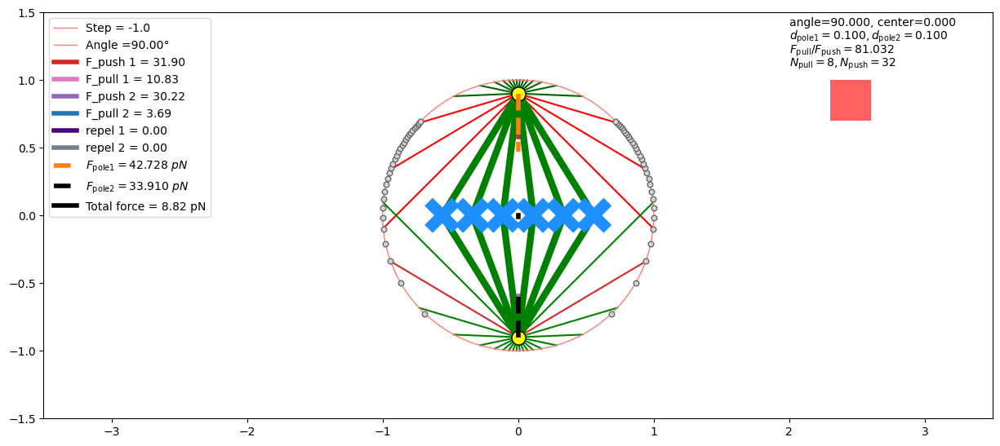

In [6]:
v_c=np.array([0,0])
params=[[a,b,r,drag[0]],10,astral_number[i],sp_angle[int(task_id-1)],[angle_lim[0], center_lim[0]],  folder_name, new_dir_path]
cell,astral_MTs,astral_angles,state,spindle_poles,spindle_angle,spots,which_push,which_bind,free_spots,astral_which_spot,orig_length,df_list2= make_cell([[a,b,r,drag[0]],motor_density[i],astral_number[i],sp_angle[int(task_id-1)],[angle_lim[0], center_lim[0]],  folder_name, new_dir_path])
borders=[min(cell[:,0])-2, max(cell[:,0])+2, max(cell[:,1])+1, min(cell[:,1])-1 ]
push_force, pull_force=find_force(astral_MTs,spindle_poles,which_bind,which_push, np.array([0,0]))
#plot intial cell and spindle
plot_cell(cell,astral_MTs,astral_angles,state,spindle_poles,spindle_angle,push_force,pull_force,spots,-1,which_bind,which_push,v_c, -1,0, params, borders)

0-----------------------=++++++++++++++++++++=
torque=-5.09963178149686e-15
T=[ 0.00000000e+00  0.00000000e+00 -5.09963178e-15]
Tra velo=[ 4.38484678e-19 -4.26300993e-03  0.00000000e+00]
Ang velo=[ 0.00000000e+00  0.00000000e+00 -1.65496606e-18]


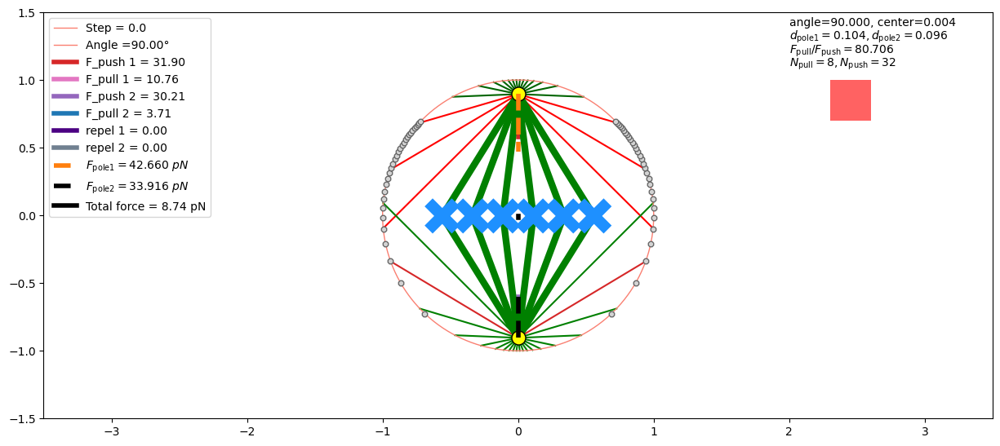

1-----------------------=++++++++++++++++++++=
torque=-3.156026037539139e-16
T=[ 0.00000000e+00  0.00000000e+00 -3.15602604e-16]
Tra velo=[ 1.37257468e-18 -3.96489003e-03  0.00000000e+00]
Ang velo=[ 0.00000000e+00  0.00000000e+00 -1.02421434e-19]


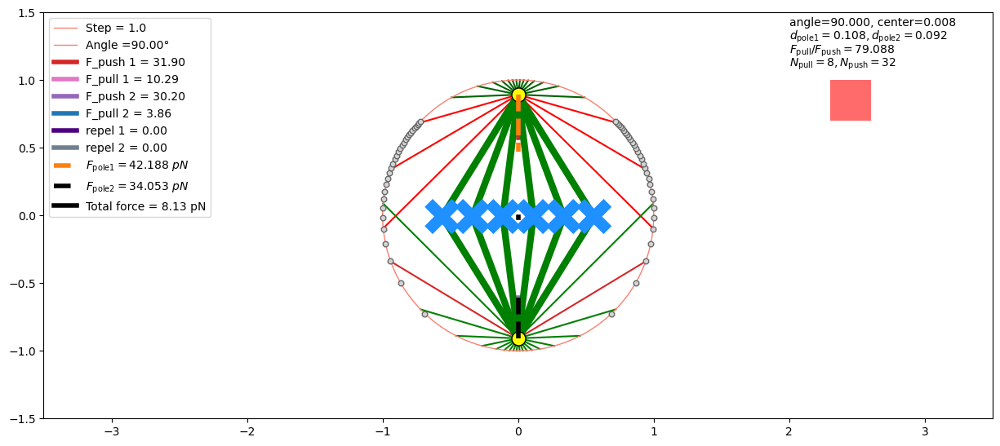

2-----------------------=++++++++++++++++++++=
torque=3.1854691632569e-15
T=[0.00000000e+00 0.00000000e+00 3.18546916e-15]
Tra velo=[ 6.16566174e-19 -3.95080646e-03  0.00000000e+00]
Ang velo=[0.00000000e+00 0.00000000e+00 1.03376941e-18]


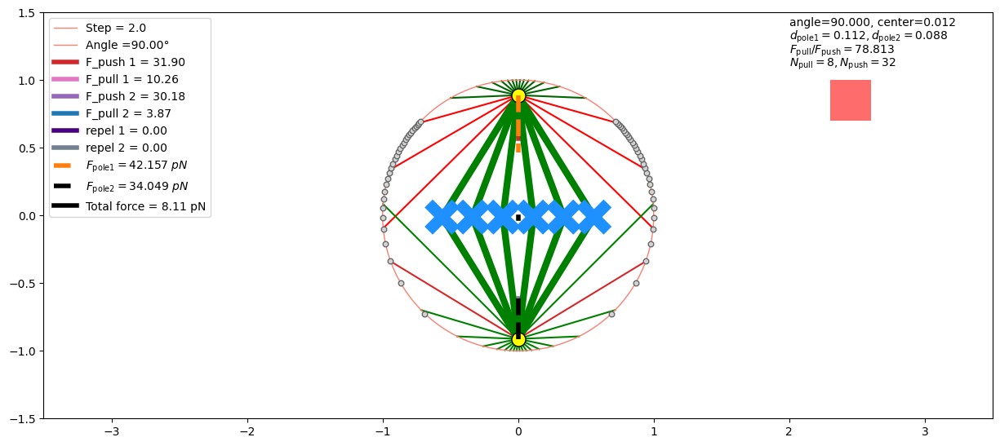

3-----------------------=++++++++++++++++++++=
torque=-1.704828969778128e-15
T=[ 0.00000000e+00  0.00000000e+00 -1.70482897e-15]
Tra velo=[ 1.40513730e-18 -3.92053079e-03  0.00000000e+00]
Ang velo=[ 0.00000000e+00  0.00000000e+00 -5.53262315e-19]


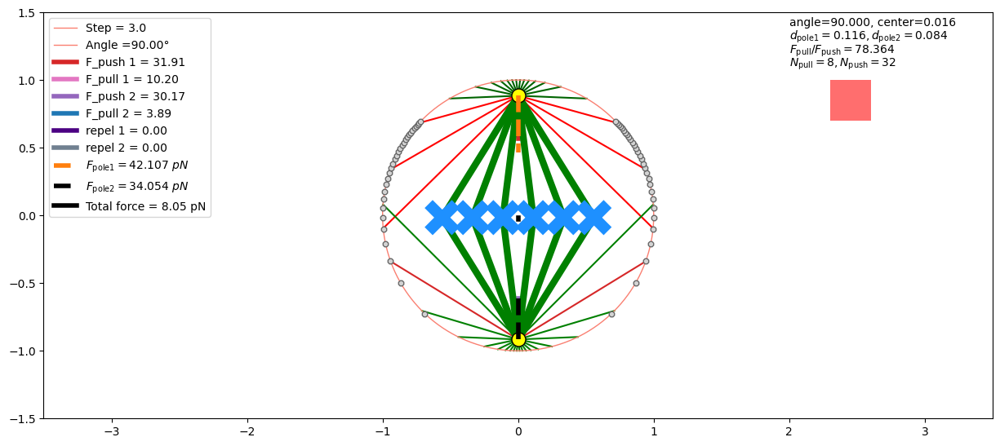

4-----------------------=++++++++++++++++++++=
torque=-6.346154732042102e-15
T=[ 0.00000000e+00  0.00000000e+00 -6.34615473e-15]
Tra velo=[ 2.34328501e-18 -3.89525634e-03  0.00000000e+00]
Ang velo=[ 0.00000000e+00  0.00000000e+00 -2.05949589e-18]


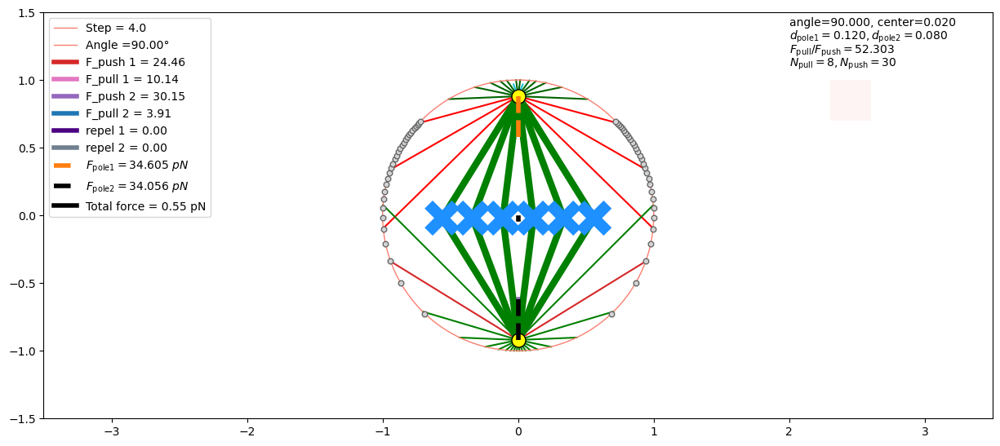

5-----------------------=++++++++++++++++++++=
torque=3.2574872964729127e-16
T=[0.0000000e+00 0.0000000e+00 3.2574873e-16]
Tra velo=[ 2.59074867e-18 -2.66964212e-04  0.00000000e+00]
Ang velo=[0.00000000e+00 0.00000000e+00 1.05714121e-19]


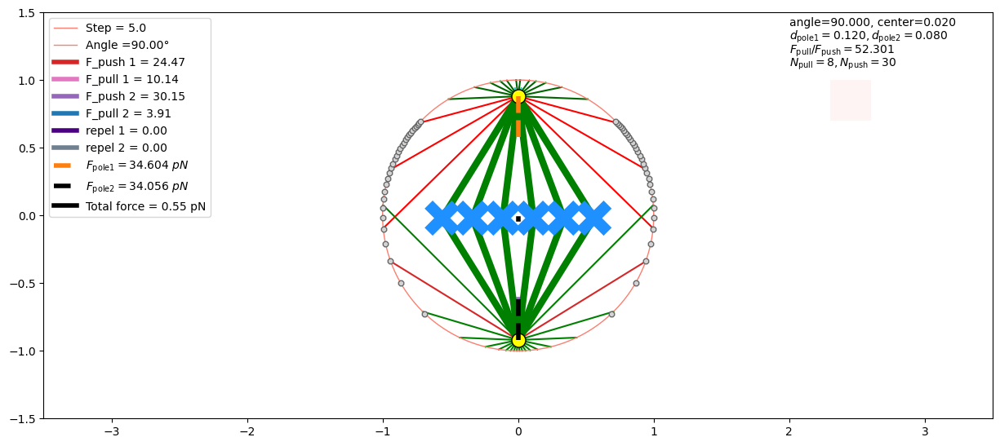

6-----------------------=++++++++++++++++++++=
torque=3.549067902321969e-15
T=[0.0000000e+00 0.0000000e+00 3.5490679e-15]
Tra velo=[ 2.23545754e-18 -4.84169129e-04  0.00000000e+00]
Ang velo=[0.00000000e+00 0.00000000e+00 1.15176687e-18]


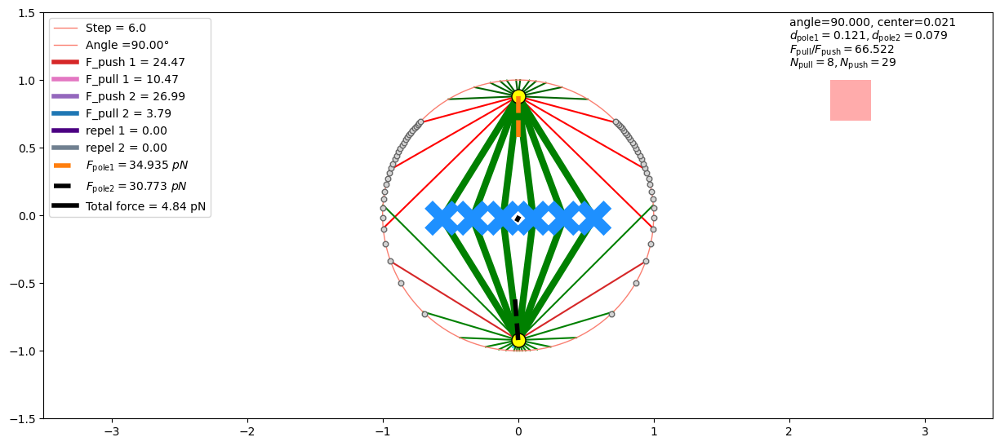

7-----------------------=++++++++++++++++++++=
torque=-2.091876535446987
T=[ 0.          0.         -2.09187654]
Tra velo=[-0.00029913 -0.00204136  0.        ]
Ang velo=[ 0.          0.         -0.00067887]


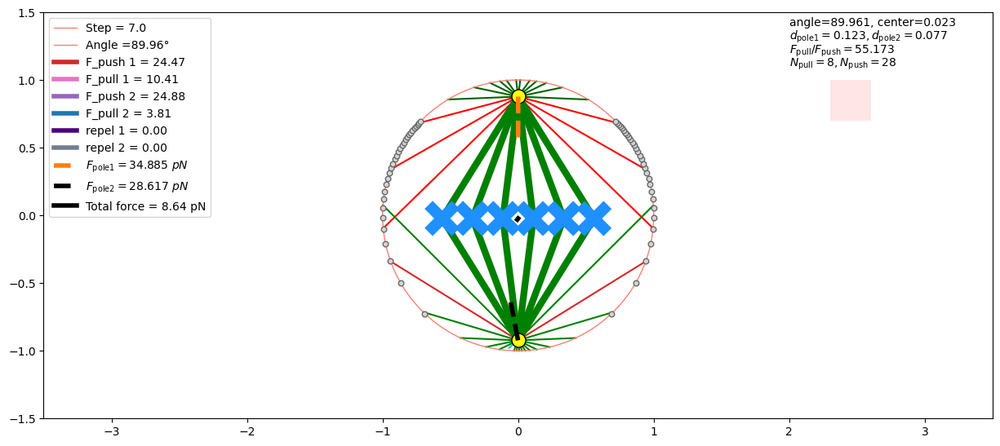

8-----------------------=++++++++++++++++++++=
torque=-5.020922711485209
T=[ 0.          0.         -5.02092271]
Tra velo=[-0.00064307 -0.00318224  0.        ]
Ang velo=[ 0.          0.         -0.00162942]


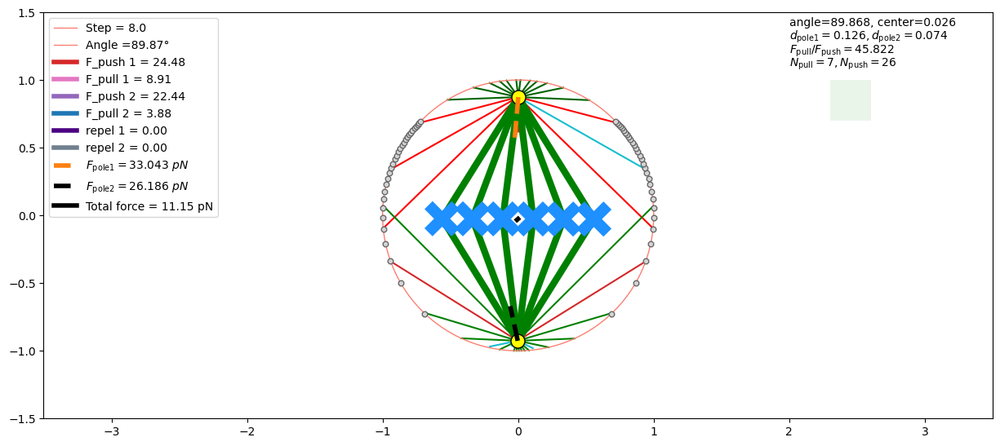

9-----------------------=++++++++++++++++++++=
torque=-2.6574504602663636
T=[ 0.          0.         -2.65745046]
Tra velo=[-0.00099443  0.01284049  0.        ]
Ang velo=[ 0.          0.         -0.00086241]


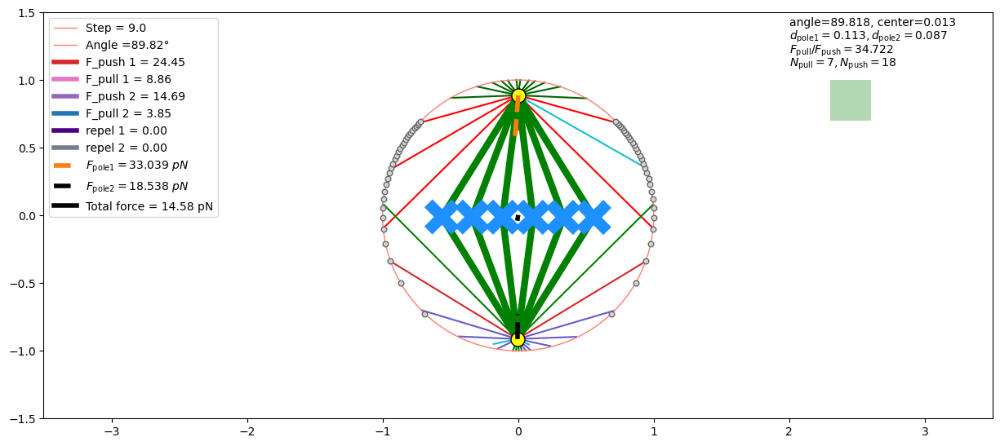

10-----------------------=++++++++++++++++++++=
torque=2.5812841495373764
T=[0.         0.         2.58128415]
Tra velo=[-0.00031071 -0.00781078  0.        ]
Ang velo=[0.        0.        0.0008377]


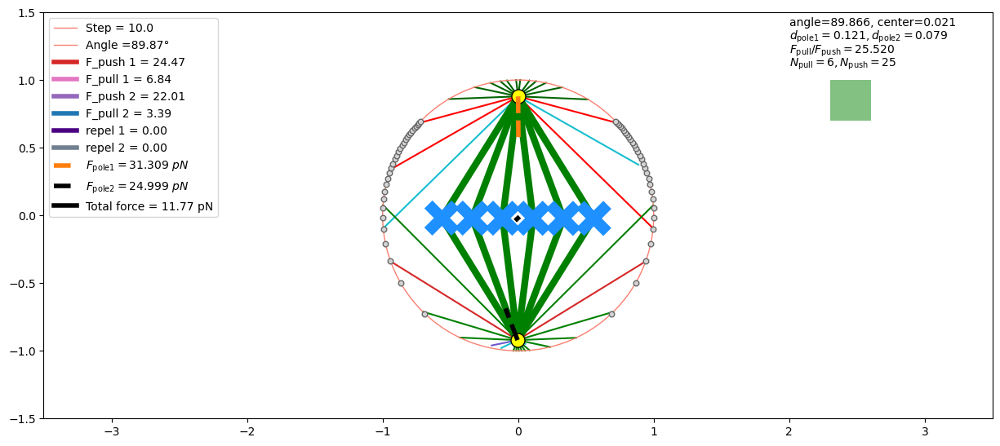

11-----------------------=++++++++++++++++++++=
torque=-7.980311539909623
T=[ 0.          0.         -7.98031154]
Tra velo=[-0.00122559 -0.00302011  0.        ]
Ang velo=[ 0.          0.         -0.00258982]


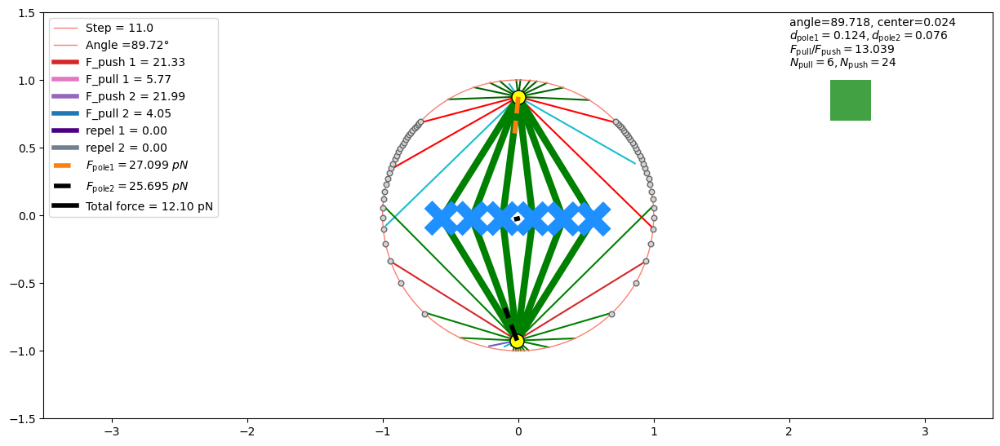

12-----------------------=++++++++++++++++++++=
torque=-6.239114881064538
T=[ 0.          0.         -6.23911488]
Tra velo=[-0.00139667 -0.00162257  0.        ]
Ang velo=[ 0.          0.         -0.00202476]


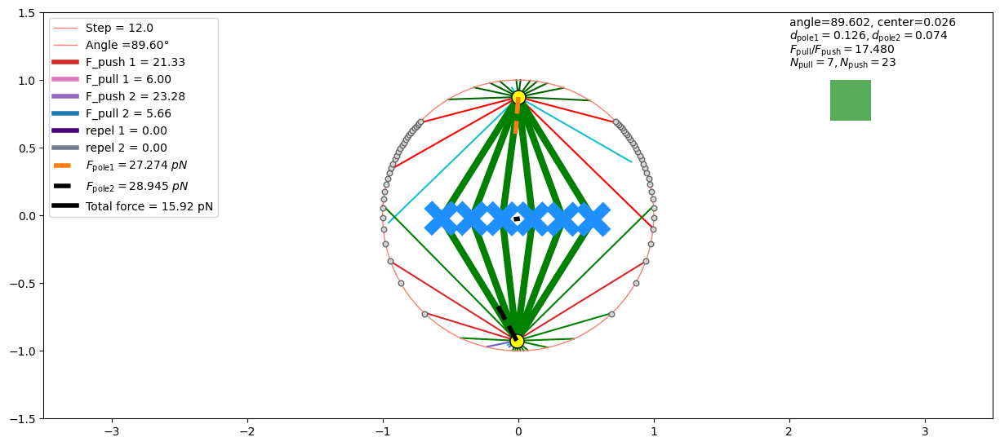

13-----------------------=++++++++++++++++++++=
torque=-10.702971305881592
T=[  0.           0.         -10.70297131]
Tra velo=[-0.00187653  0.01530902  0.        ]
Ang velo=[ 0.         0.        -0.0034734]


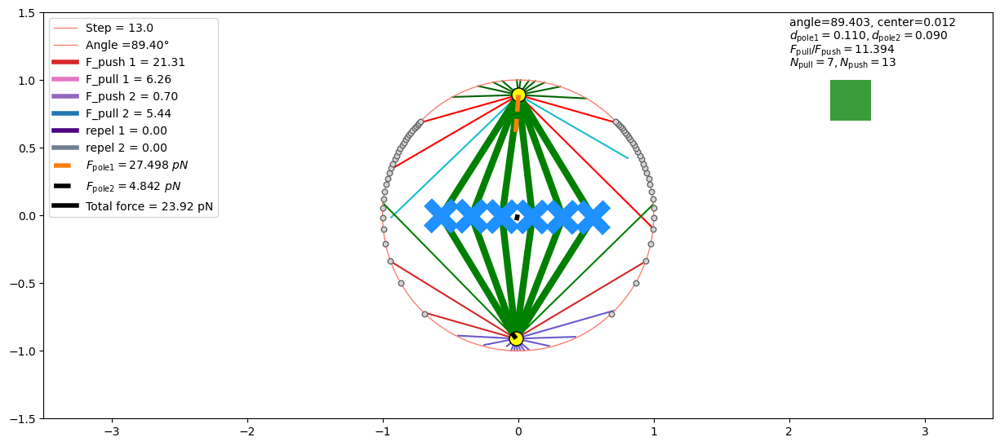

14-----------------------=++++++++++++++++++++=
torque=-0.779914834098191
T=[ 0.          0.         -0.77991483]
Tra velo=[-0.00058472 -0.01207271  0.        ]
Ang velo=[ 0.         0.        -0.0002531]


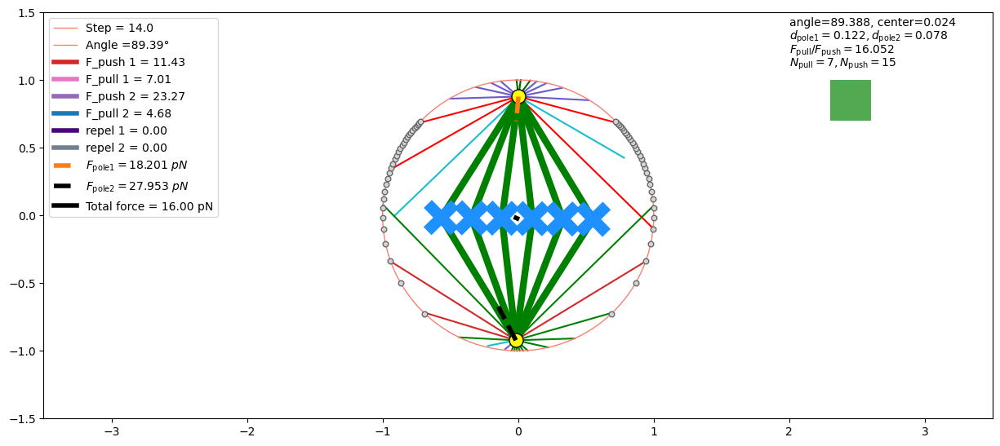

15-----------------------=++++++++++++++++++++=
torque=-10.69620476584071
T=[  0.           0.         -10.69620477]
Tra velo=[-0.00213602  0.00435545  0.        ]
Ang velo=[ 0.         0.        -0.0034712]


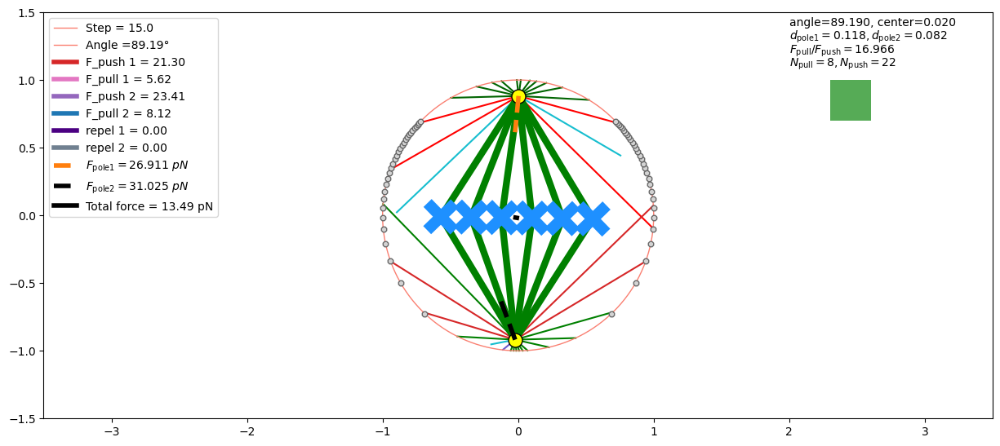

16-----------------------=++++++++++++++++++++=
torque=-8.308470821997414
T=[ 0.          0.         -8.30847082]
Tra velo=[-0.0014453   0.00018289  0.        ]
Ang velo=[ 0.          0.         -0.00269632]


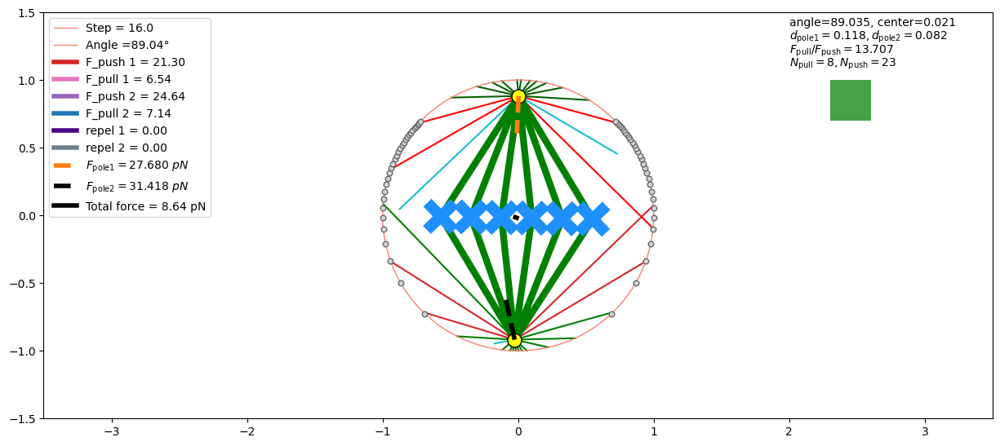

17-----------------------=++++++++++++++++++++=
torque=-5.515018551967162
T=[ 0.          0.         -5.51501855]
Tra velo=[-0.00113644  0.00164703  0.        ]
Ang velo=[ 0.          0.         -0.00178977]


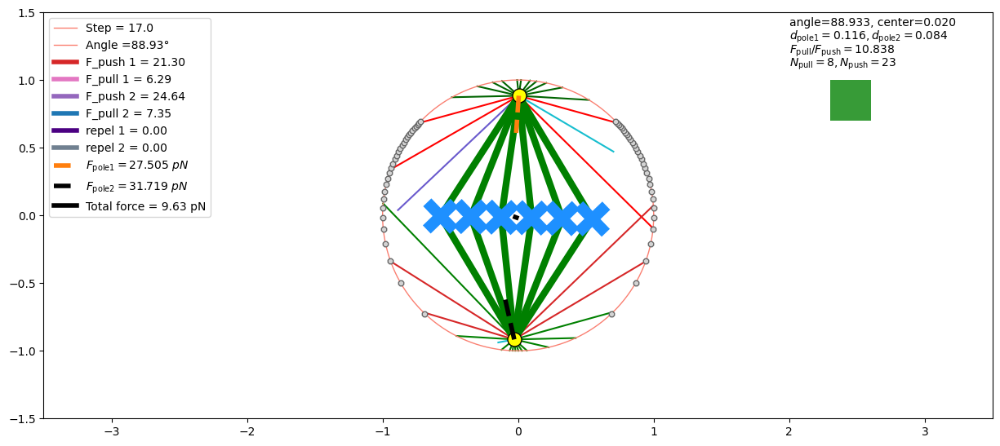

18-----------------------=++++++++++++++++++++=
torque=-5.508218335872365
T=[ 0.          0.         -5.50821834]
Tra velo=[-0.00118318  0.00154591  0.        ]
Ang velo=[ 0.          0.         -0.00178756]


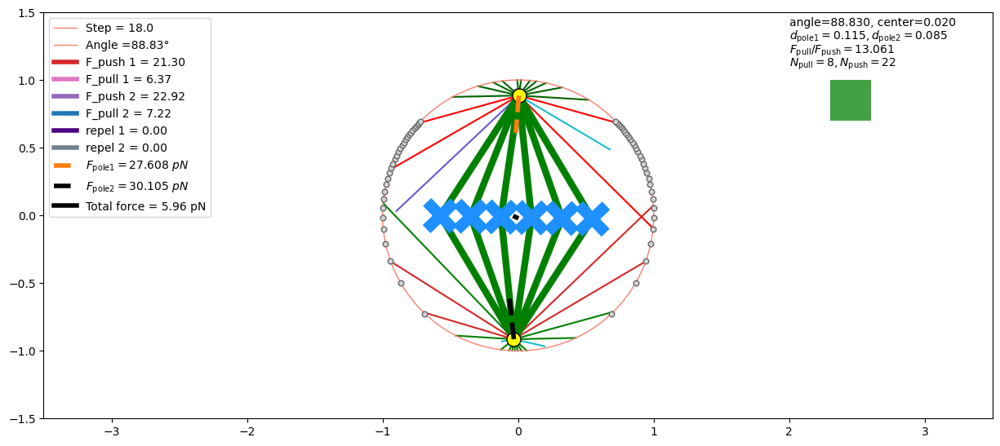

19-----------------------=++++++++++++++++++++=
torque=-1.9612409461411753
T=[ 0.          0.         -1.96124095]
Tra velo=[-0.00067642  0.00113285  0.        ]
Ang velo=[ 0.          0.         -0.00063647]


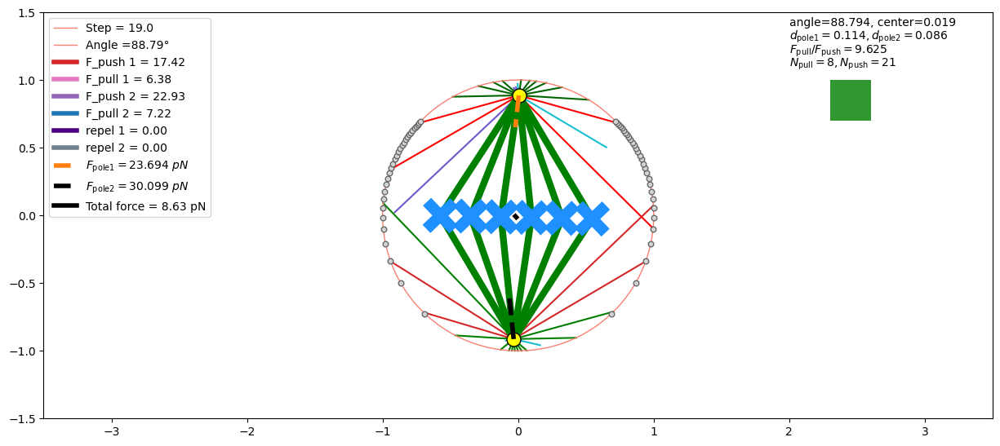

20-----------------------=++++++++++++++++++++=
torque=-1.4635801136808206
T=[ 0.          0.         -1.46358011]
Tra velo=[-0.00078459  0.00305403  0.        ]
Ang velo=[ 0.          0.         -0.00047497]


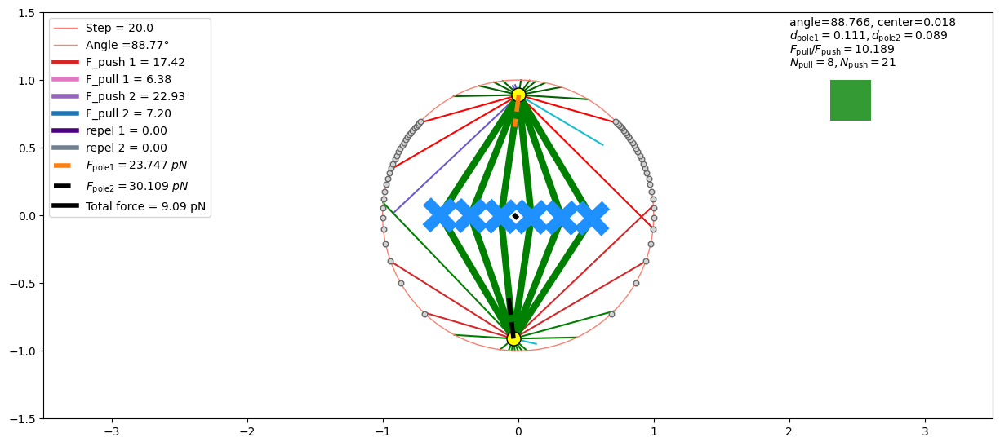

21-----------------------=++++++++++++++++++++=
torque=-1.414954490454134
T=[ 0.          0.         -1.41495449]
Tra velo=[-0.00076946  0.00292076  0.        ]
Ang velo=[ 0.          0.         -0.00045919]


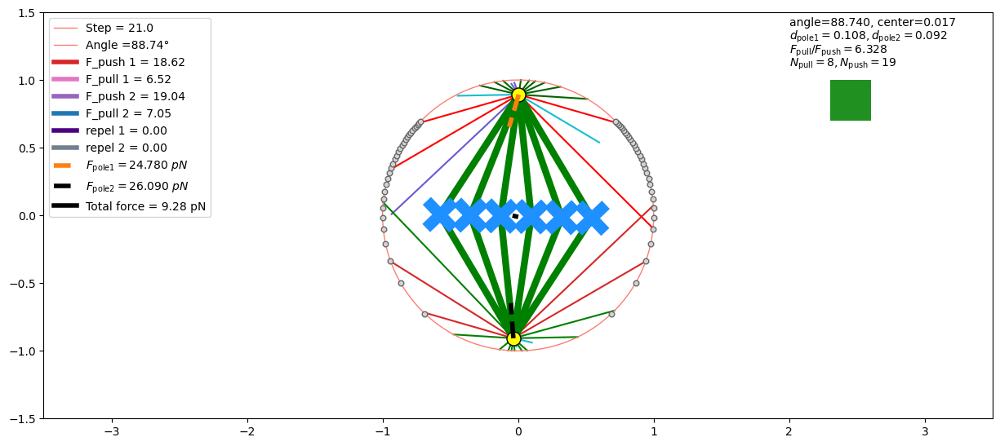

22-----------------------=++++++++++++++++++++=
torque=3.57311394814785
T=[0.         0.         3.57311395]
Tra velo=[-0.00114504  0.00102603  0.        ]
Ang velo=[0.         0.         0.00115957]


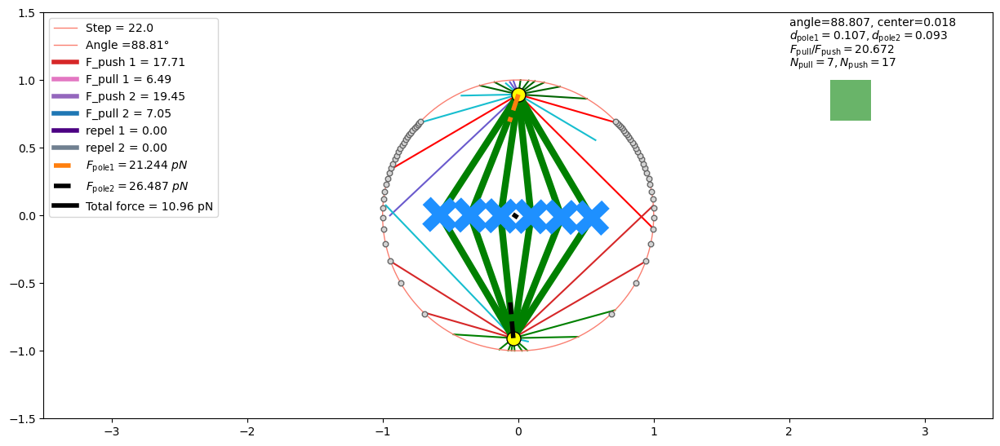

23-----------------------=++++++++++++++++++++=
torque=3.1385958917173076
T=[0.         0.         3.13859589]
Tra velo=[-0.00106816  0.00303722  0.        ]
Ang velo=[0.         0.         0.00101856]


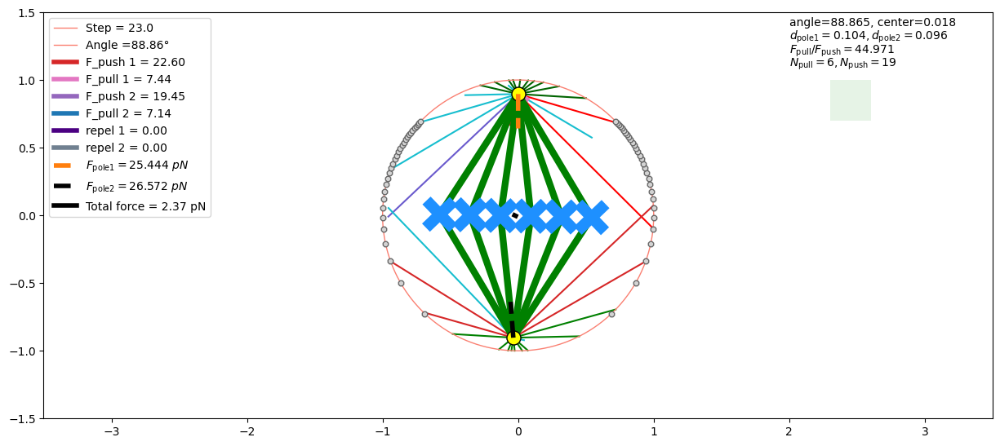

24-----------------------=++++++++++++++++++++=
torque=-2.8937739142867596
T=[ 0.          0.         -2.89377391]
Tra velo=[-0.000266    0.00040045  0.        ]
Ang velo=[ 0.          0.         -0.00093911]


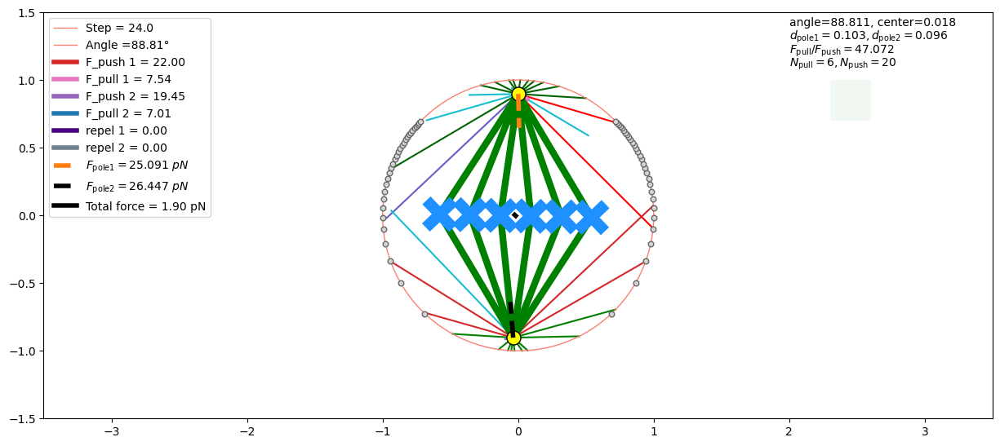

25-----------------------=++++++++++++++++++++=
torque=-3.6274486815056073
T=[ 0.          0.         -3.62744868]
Tra velo=[-0.00028208  0.00077463  0.        ]
Ang velo=[ 0.         0.        -0.0011772]


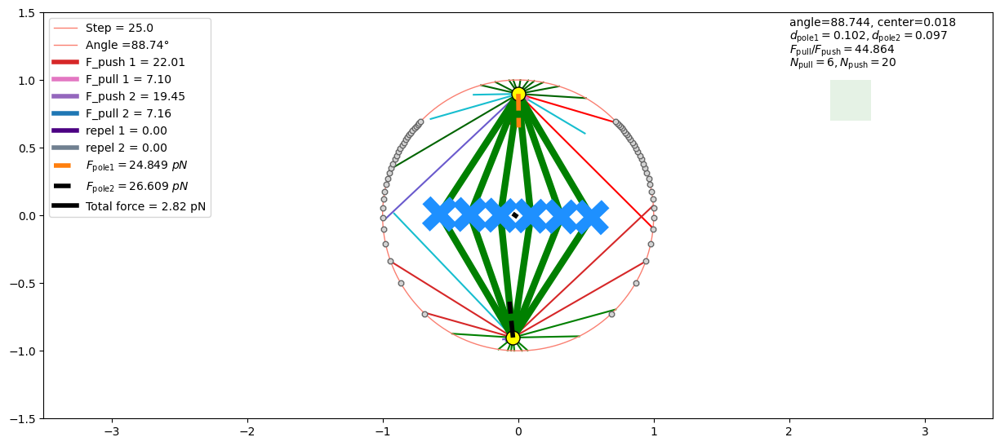

26-----------------------=++++++++++++++++++++=
torque=-3.624233213273616
T=[ 0.          0.         -3.62423321]
Tra velo=[-0.00027914  0.00075409  0.        ]
Ang velo=[ 0.          0.         -0.00117616]


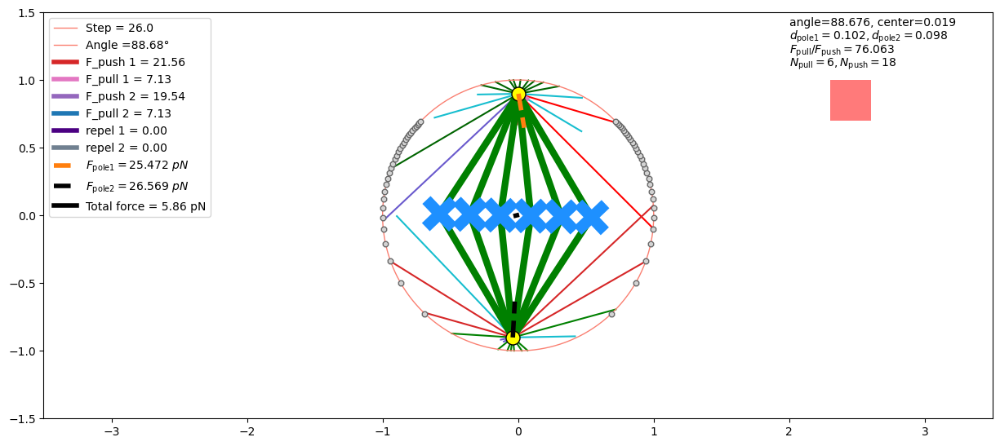

27-----------------------=++++++++++++++++++++=
torque=-3.582302780496337
T=[ 0.          0.         -3.58230278]
Tra velo=[0.0007442  0.00072997 0.        ]
Ang velo=[ 0.          0.         -0.00116255]


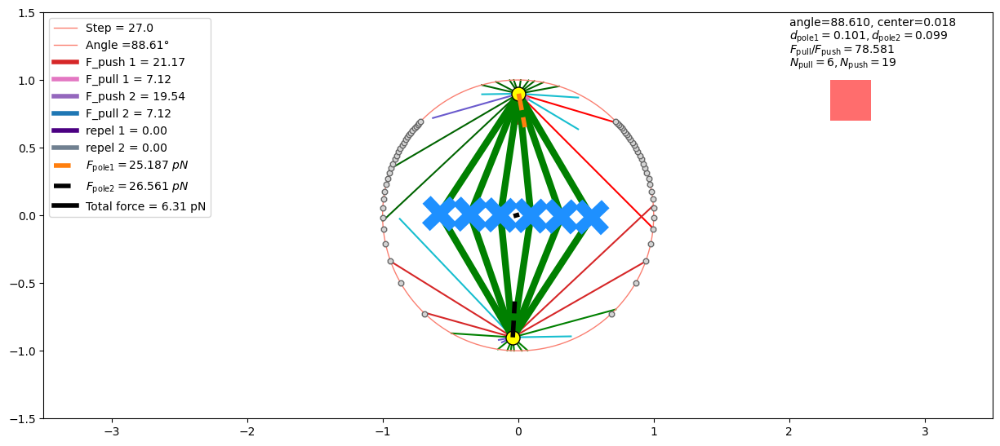

28-----------------------=++++++++++++++++++++=
torque=-4.21572343571203
T=[ 0.          0.         -4.21572344]
Tra velo=[0.00067237 0.00095438 0.        ]
Ang velo=[ 0.          0.         -0.00136811]


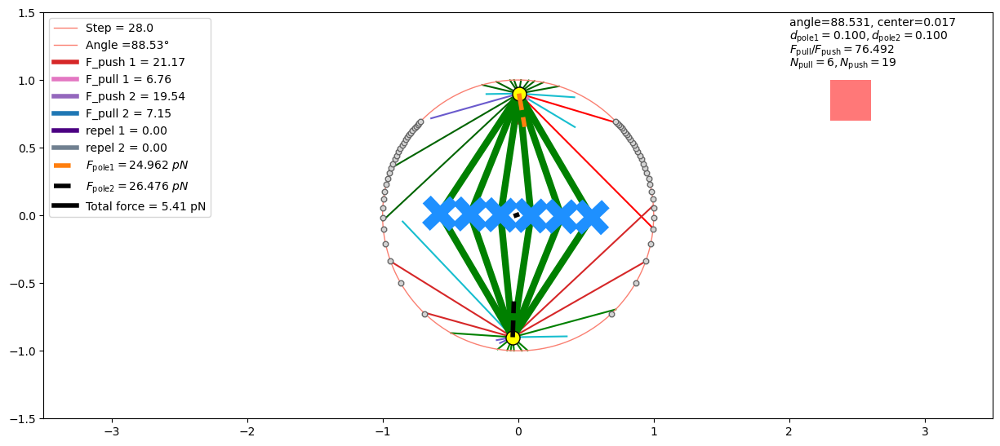

29-----------------------=++++++++++++++++++++=
torque=-4.210028701110833
T=[ 0.         0.        -4.2100287]
Tra velo=[0.00068236 0.00093194 0.        ]
Ang velo=[ 0.          0.         -0.00136627]


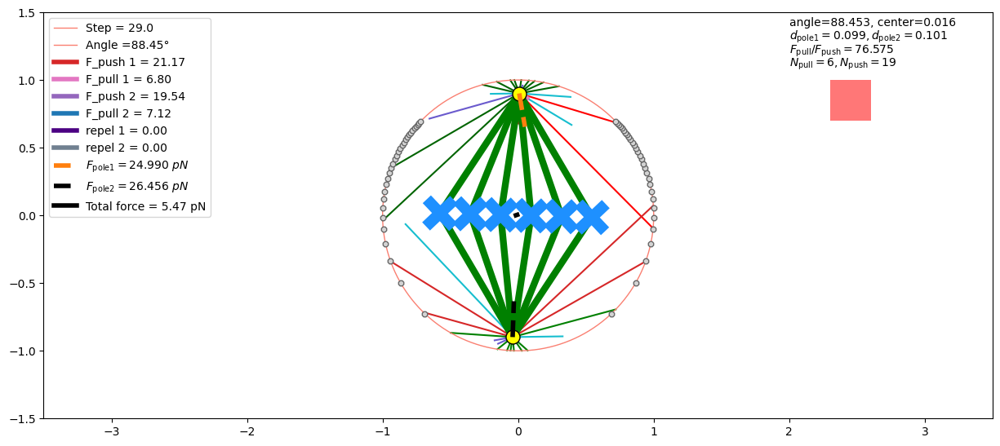

30-----------------------=++++++++++++++++++++=
torque=-4.2165428782679335
T=[ 0.          0.         -4.21654288]
Tra velo=[0.00068113 0.00092544 0.        ]
Ang velo=[ 0.          0.         -0.00136838]


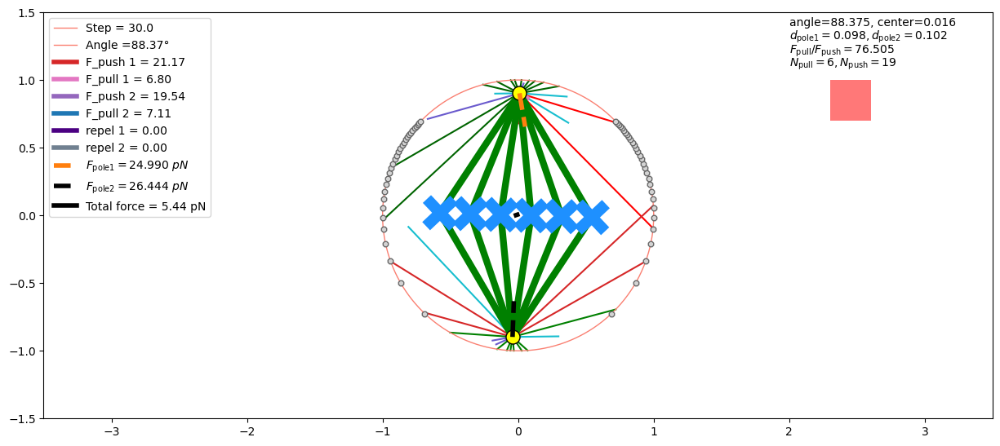

31-----------------------=++++++++++++++++++++=
torque=-4.220566264662198
T=[ 0.          0.         -4.22056626]
Tra velo=[0.00068132 0.00091763 0.        ]
Ang velo=[ 0.          0.         -0.00136969]


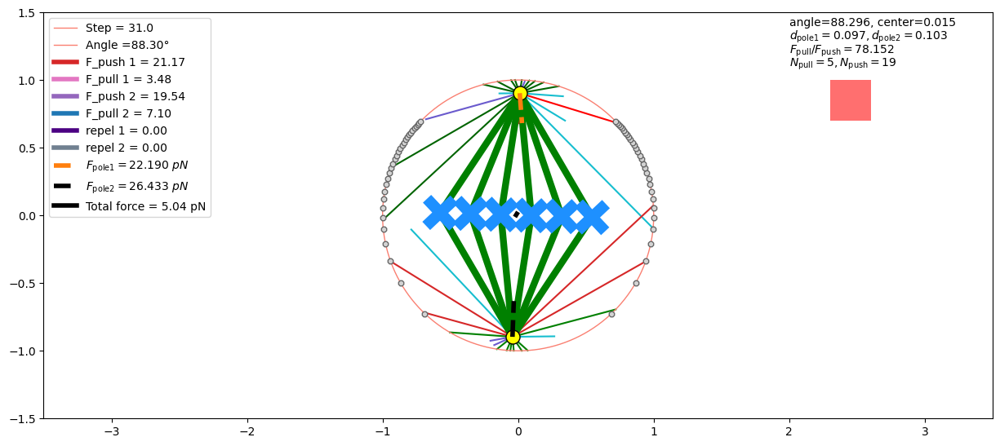

32-----------------------=++++++++++++++++++++=
torque=-1.9252465123260591
T=[ 0.          0.         -1.92524651]
Tra velo=[0.00038772 0.00210006 0.        ]
Ang velo=[ 0.          0.         -0.00062479]


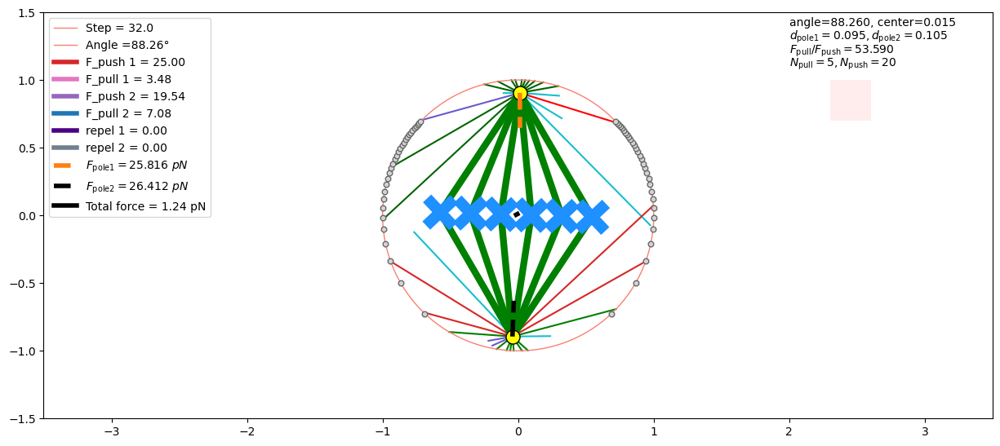

33-----------------------=++++++++++++++++++++=
torque=-0.5153313893837729
T=[ 0.          0.         -0.51533139]
Tra velo=[0.00018141 0.00025315 0.        ]
Ang velo=[ 0.          0.         -0.00016724]


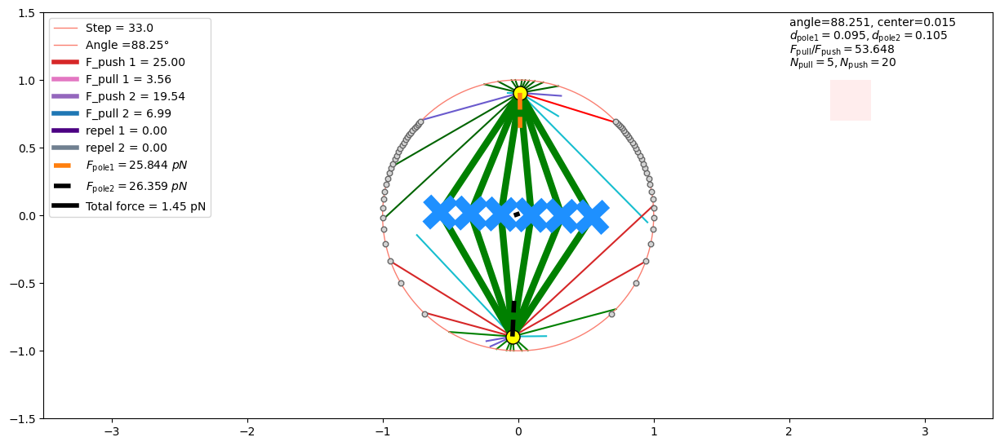

34-----------------------=++++++++++++++++++++=
torque=-0.4045782513134238
T=[ 0.          0.         -0.40457825]
Tra velo=[0.00019965 0.00030983 0.        ]
Ang velo=[ 0.         0.        -0.0001313]


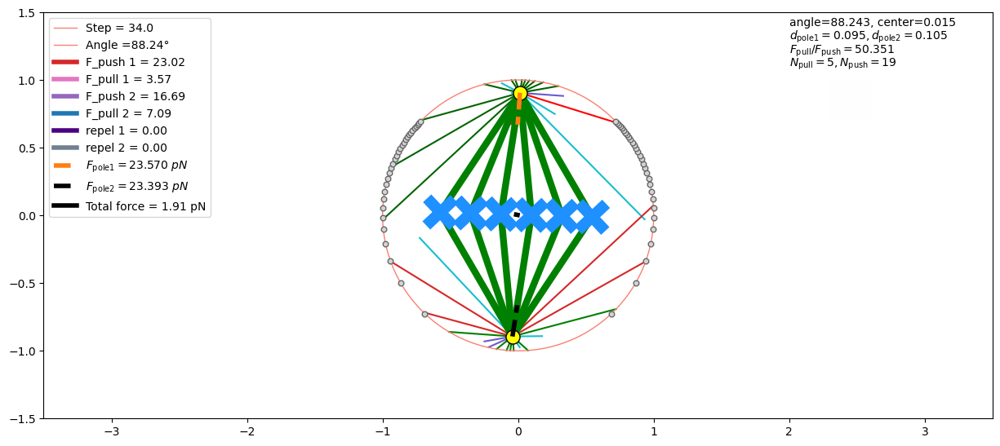

35-----------------------=++++++++++++++++++++=
torque=3.4044395137879366
T=[0.         0.         3.40443951]
Tra velo=[ 0.00023551 -0.00016869  0.        ]
Ang velo=[0.         0.         0.00110483]


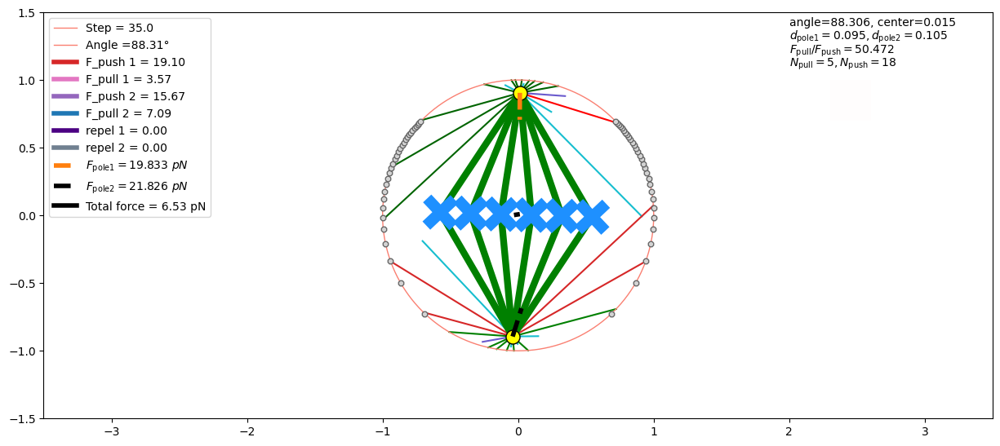

36-----------------------=++++++++++++++++++++=
torque=4.8834064798204295
T=[0.         0.         4.88340648]
Tra velo=[0.00083782 0.00056046 0.        ]
Ang velo=[0.        0.        0.0015848]


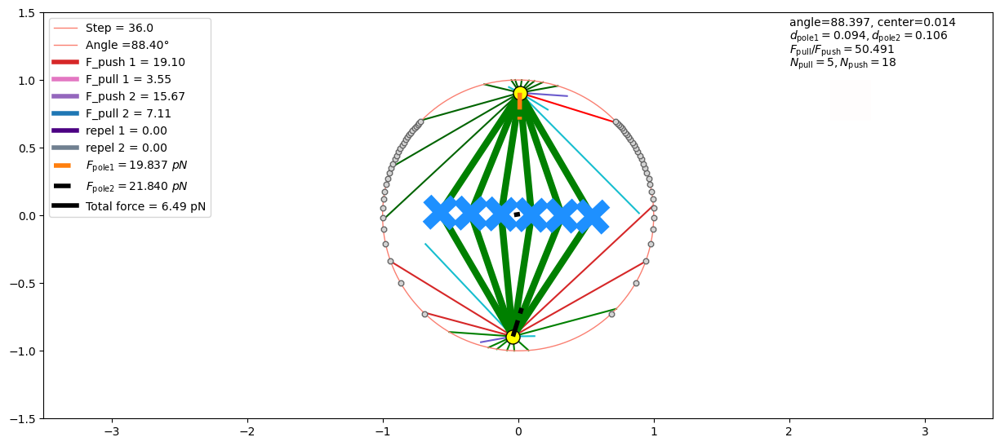

37-----------------------=++++++++++++++++++++=
torque=4.641894993597952
T=[0.         0.         4.64189499]
Tra velo=[0.00077293 0.00053159 0.        ]
Ang velo=[0.         0.         0.00150642]


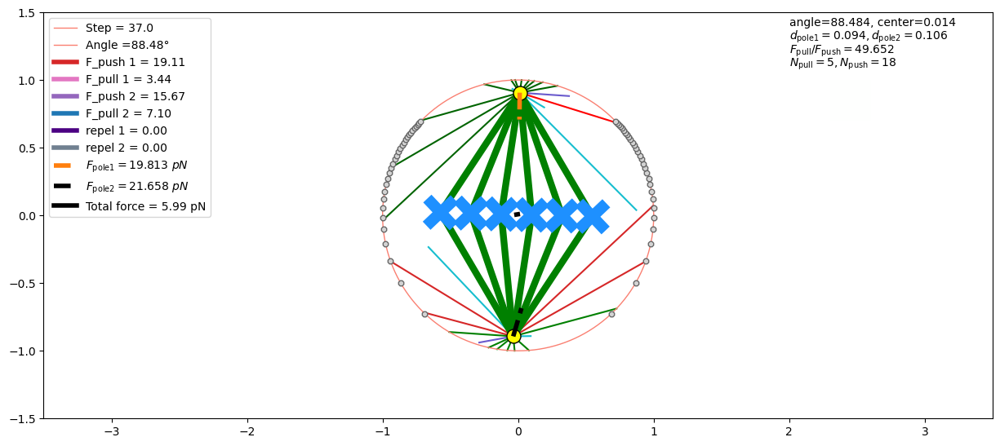

38-----------------------=++++++++++++++++++++=
torque=4.673904161715688
T=[0.         0.         4.67390416]
Tra velo=[0.00077845 0.00052731 0.        ]
Ang velo=[0.         0.         0.00151681]


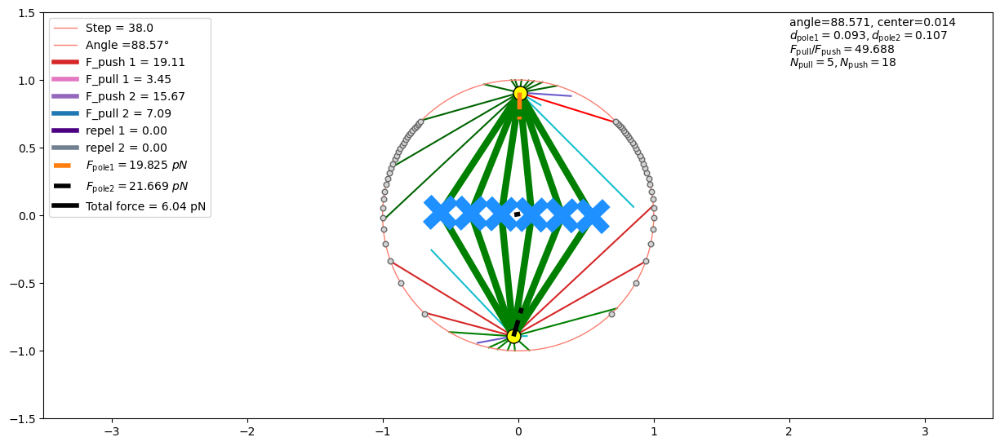

39-----------------------=++++++++++++++++++++=
torque=4.677823214196849
T=[0.         0.         4.67782321]
Tra velo=[0.00077641 0.00052224 0.        ]
Ang velo=[0.         0.         0.00151808]


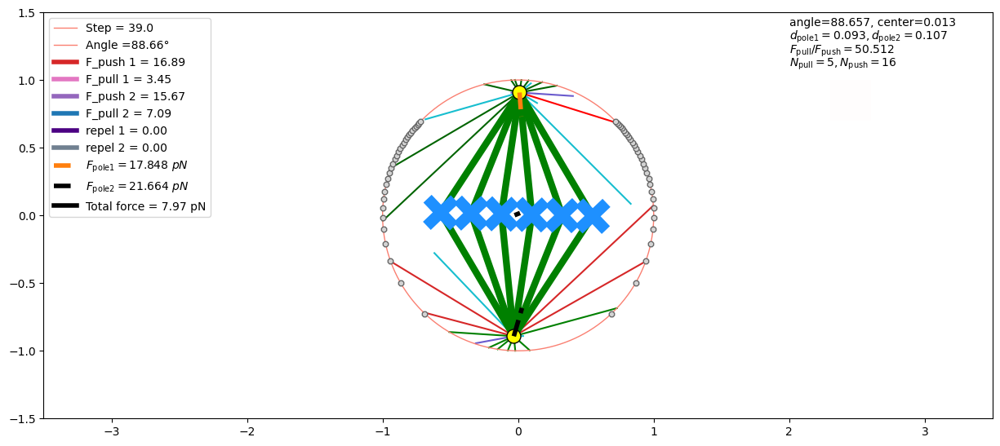

40-----------------------=++++++++++++++++++++=
torque=3.4386020964952637
T=[0.        0.        3.4386021]
Tra velo=[0.00097676 0.0015123  0.        ]
Ang velo=[0.         0.         0.00111592]


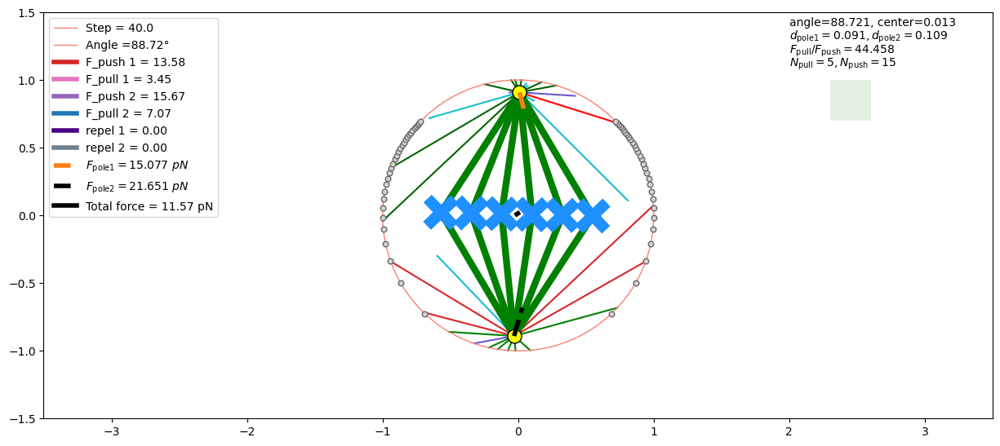

41-----------------------=++++++++++++++++++++=
torque=1.2547843136193246
T=[0.         0.         1.25478431]
Tra velo=[0.0012888  0.00303591 0.        ]
Ang velo=[0.         0.         0.00040721]


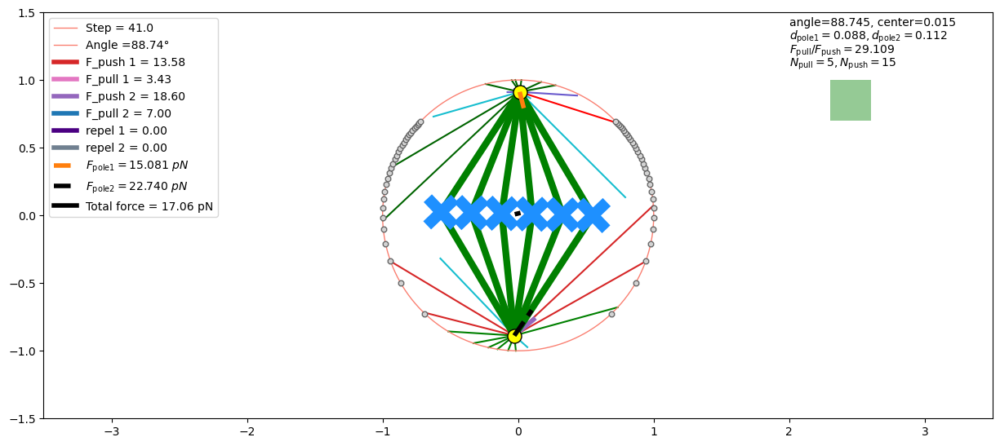

42-----------------------=++++++++++++++++++++=
torque=7.378532363598138
T=[0.         0.         7.37853236]
Tra velo=[0.00213328 0.00209285 0.        ]
Ang velo=[0.         0.         0.00239453]


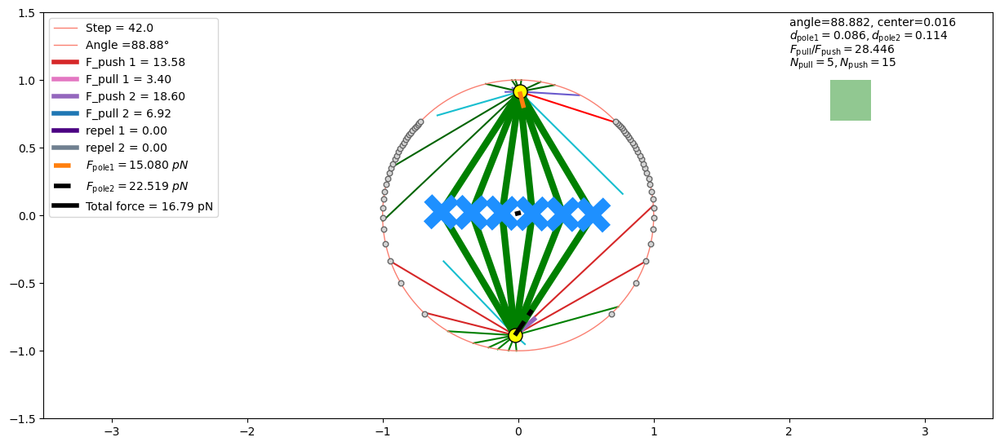

43-----------------------=++++++++++++++++++++=
torque=7.068367803949549
T=[0.        0.        7.0683678]
Tra velo=[0.00203382 0.00210838 0.        ]
Ang velo=[0.         0.         0.00229387]


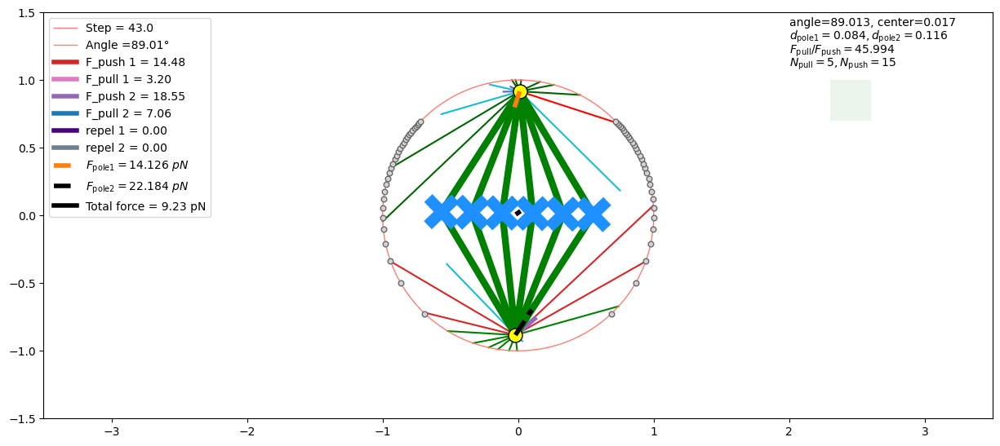

44-----------------------=++++++++++++++++++++=
torque=14.174731431641188
T=[ 0.          0.         14.17473143]
Tra velo=[0.00101984 0.00258895 0.        ]
Ang velo=[0.         0.         0.00460008]


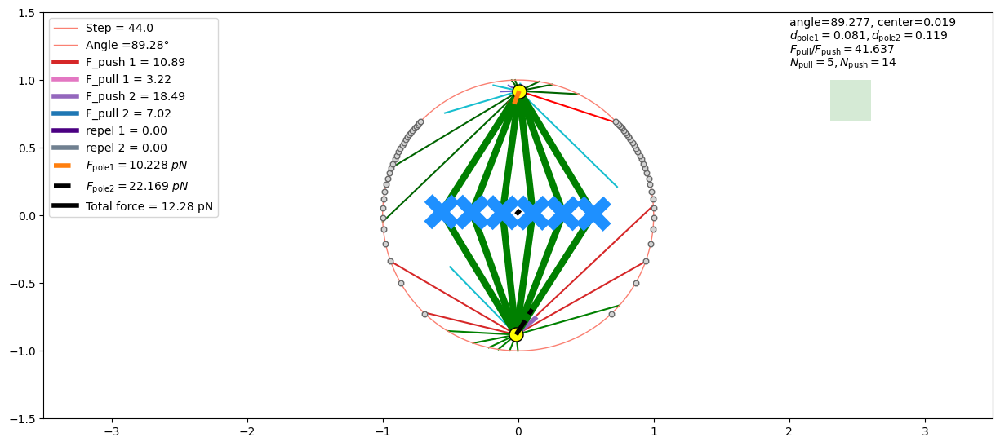

45-----------------------=++++++++++++++++++++=
torque=14.063959989138127
T=[ 0.          0.         14.06395999]
Tra velo=[0.00119527 0.00447767 0.        ]
Ang velo=[0.         0.         0.00456413]


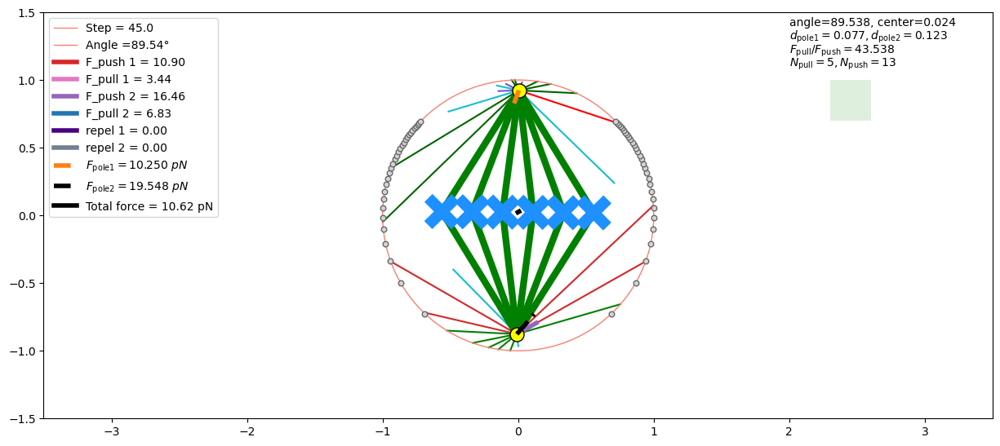

46-----------------------=++++++++++++++++++++=
torque=14.291717059989626
T=[ 0.          0.         14.29171706]
Tra velo=[0.00118898 0.00247453 0.        ]
Ang velo=[0.         0.         0.00463804]


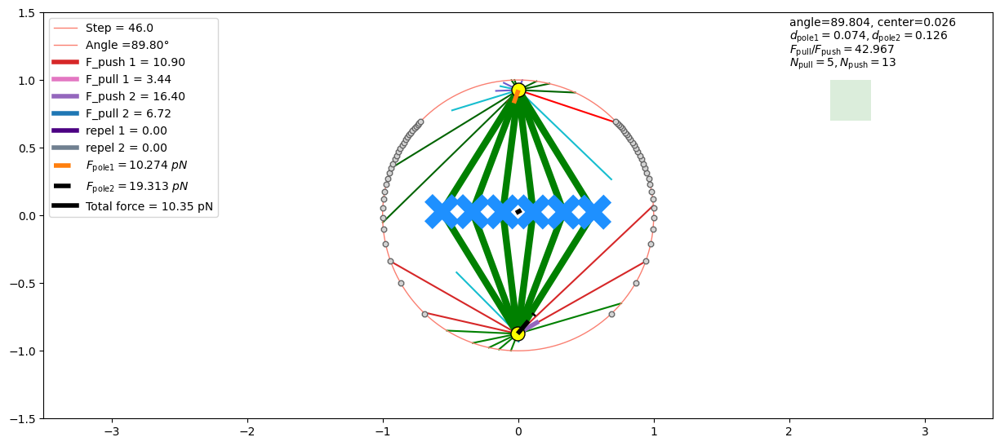

47-----------------------=++++++++++++++++++++=
torque=14.254361269920544
T=[ 0.          0.         14.25436127]
Tra velo=[ 0.00111511 -0.01377284  0.        ]
Ang velo=[0.         0.         0.00462592]


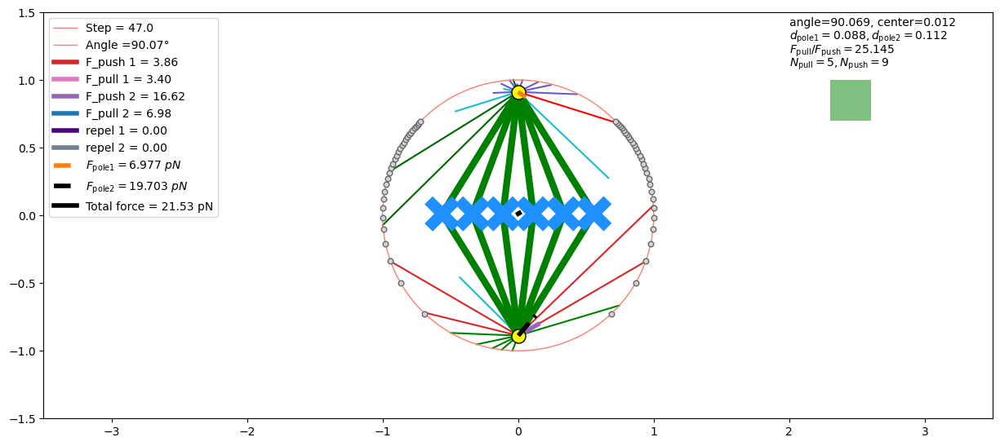

48-----------------------=++++++++++++++++++++=
torque=6.77990671839459
T=[0.         0.         6.77990672]
Tra velo=[0.00237088 0.00586323 0.        ]
Ang velo=[0.         0.         0.00220026]


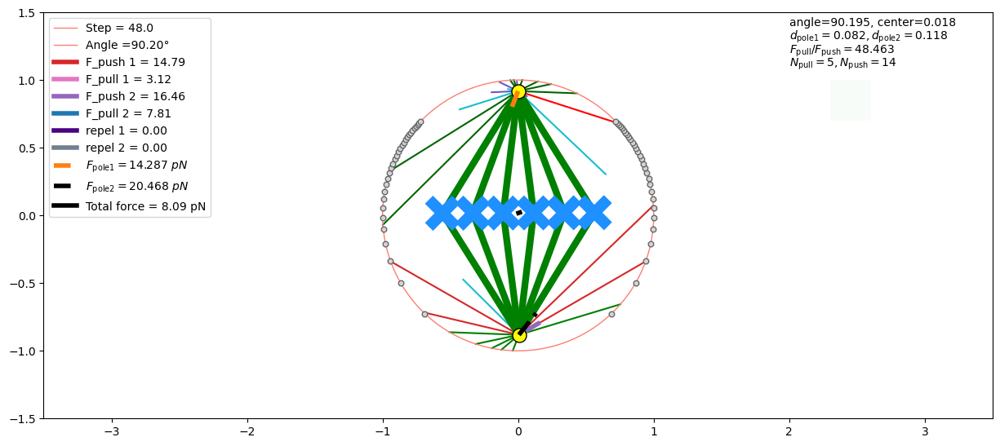

49-----------------------=++++++++++++++++++++=
torque=15.123677937836142
T=[ 0.          0.         15.12367794]
Tra velo=[0.00085042 0.00066339 0.        ]
Ang velo=[0.         0.         0.00490804]


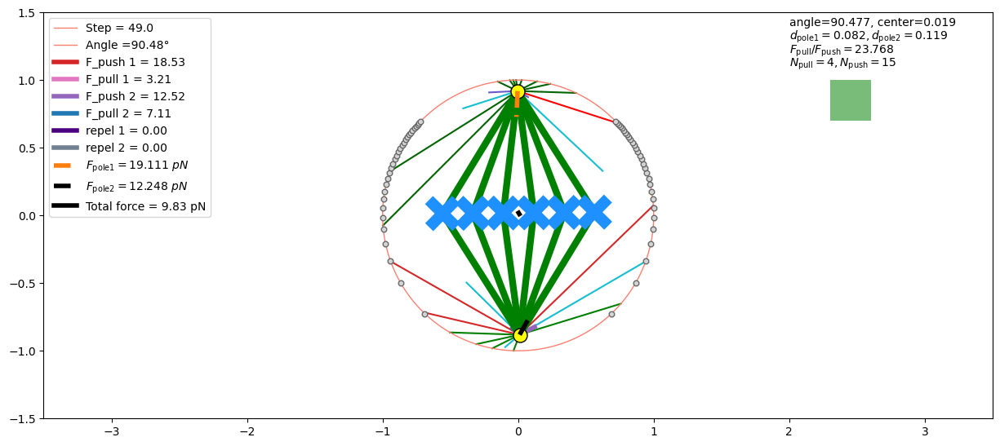

50-----------------------=++++++++++++++++++++=
torque=6.782789918689904
T=[0.         0.         6.78278992]
Tra velo=[ 0.00079849 -0.00401946  0.        ]
Ang velo=[0.        0.        0.0022012]


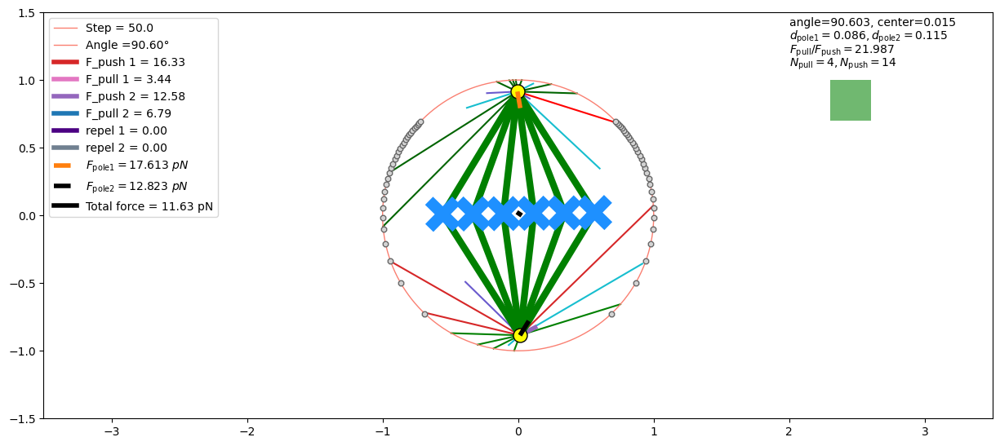

51-----------------------=++++++++++++++++++++=
torque=3.678561296144456
T=[0.        0.        3.6785613]
Tra velo=[ 0.00126184 -0.00303426  0.        ]
Ang velo=[0.         0.         0.00119379]


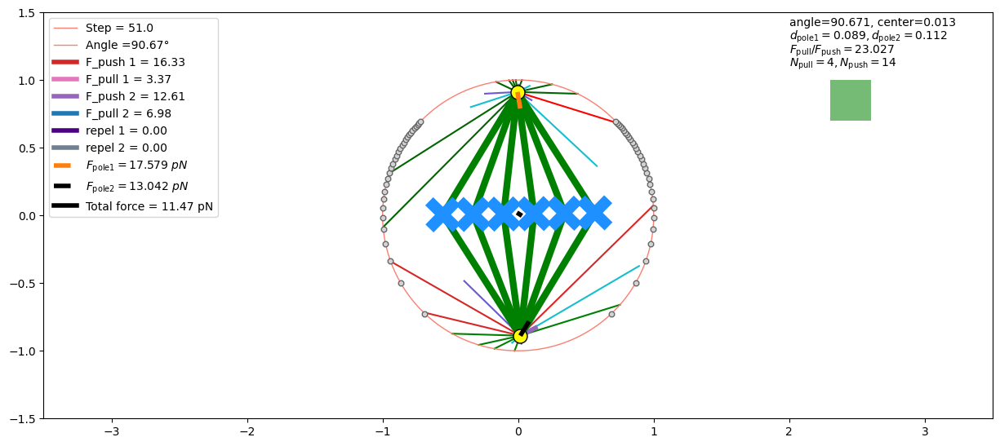

52-----------------------=++++++++++++++++++++=
torque=3.599094799972505
T=[0.        0.        3.5990948]
Tra velo=[ 0.00123424 -0.00302256  0.        ]
Ang velo=[0.       0.       0.001168]


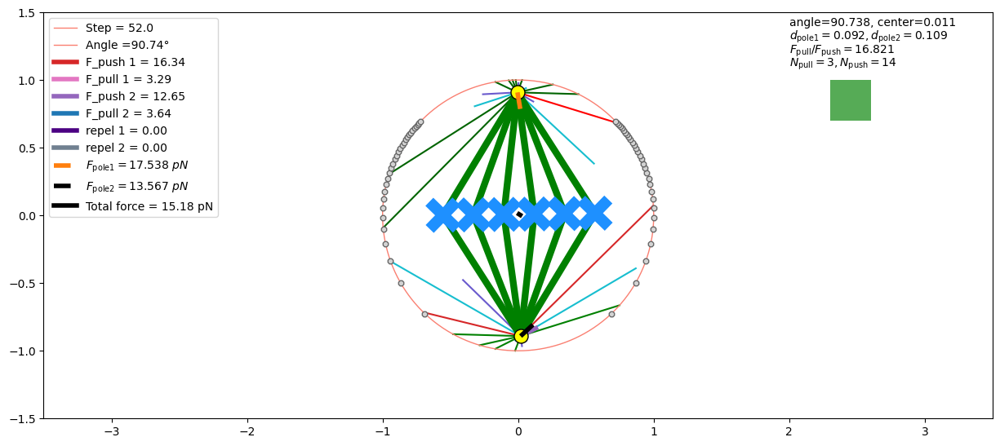

53-----------------------=++++++++++++++++++++=
torque=6.684600592925539
T=[0.         0.         6.68460059]
Tra velo=[ 0.00169239 -0.0039701   0.        ]
Ang velo=[0.         0.         0.00216933]


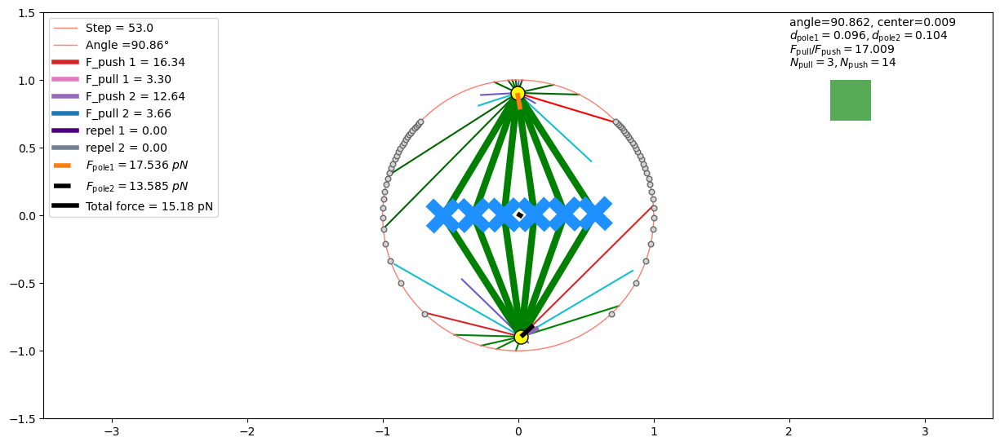

54-----------------------=++++++++++++++++++++=
torque=6.6646936949669975
T=[0.         0.         6.66469369]
Tra velo=[ 0.00167048 -0.00393726  0.        ]
Ang velo=[0.         0.         0.00216287]


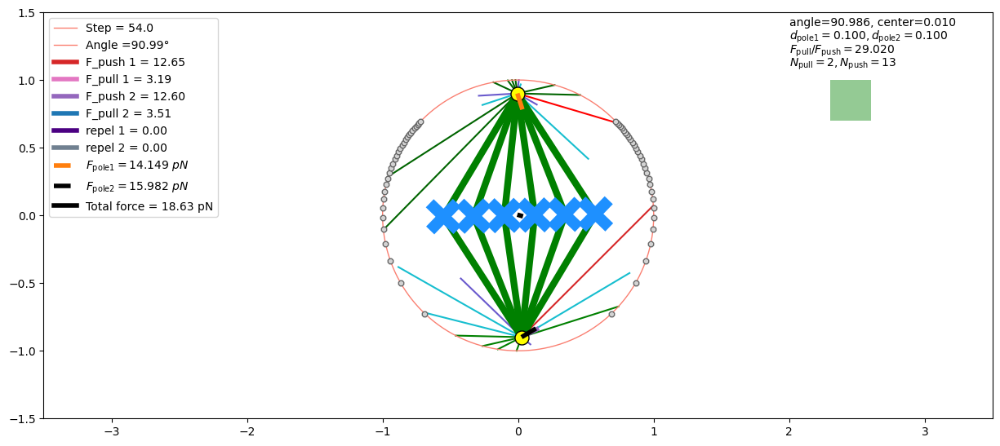

55-----------------------=++++++++++++++++++++=
torque=8.802723895158284
T=[0.        0.        8.8027239]
Tra velo=[ 0.00233738 -0.00261711  0.        ]
Ang velo=[0.         0.         0.00285672]


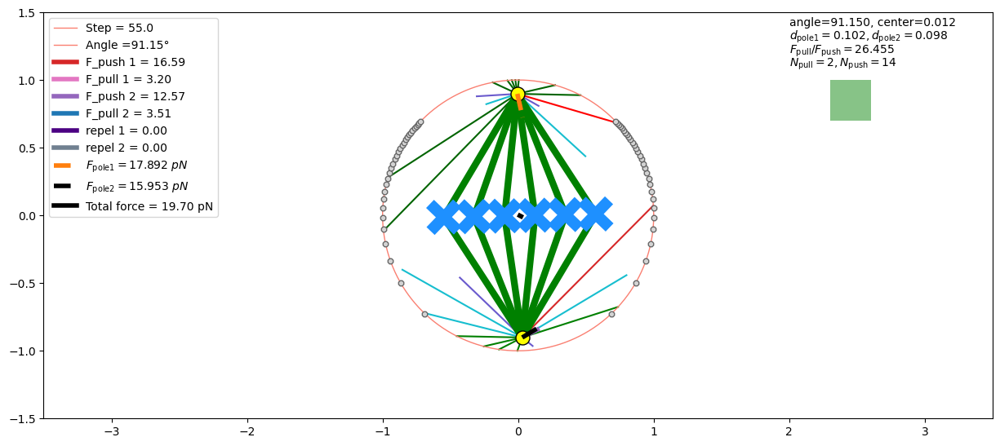

56-----------------------=++++++++++++++++++++=
torque=9.22216870567188
T=[0.         0.         9.22216871]
Tra velo=[ 0.00228617 -0.00457151  0.        ]
Ang velo=[0.         0.         0.00299284]


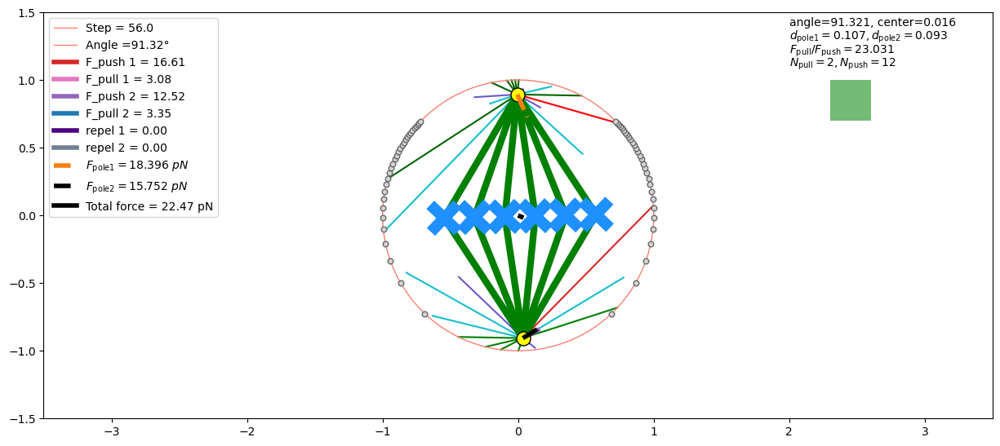

57-----------------------=++++++++++++++++++++=
torque=6.045667487984749
T=[0.         0.         6.04566749]
Tra velo=[ 0.00275248 -0.0042928   0.        ]
Ang velo=[0.         0.         0.00196198]


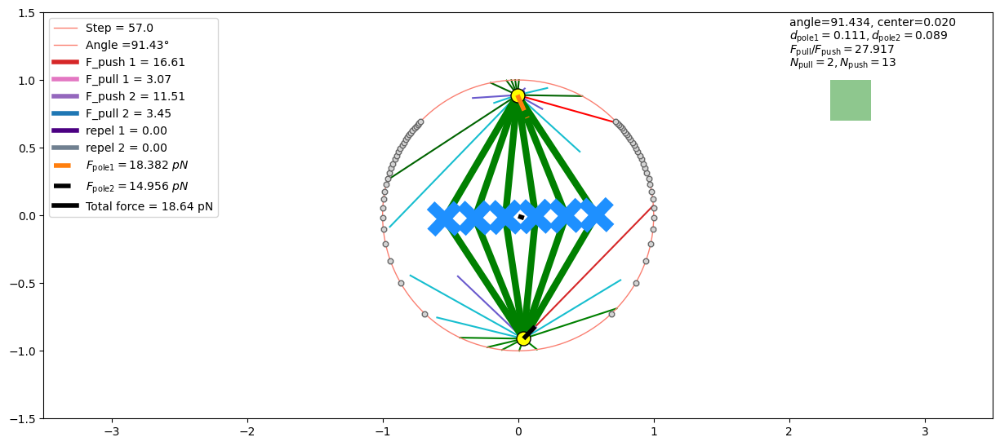

58-----------------------=++++++++++++++++++++=
torque=3.2766615246656414
T=[0.         0.         3.27666152]
Tra velo=[ 0.00231103 -0.00306462  0.        ]
Ang velo=[0.         0.         0.00106336]


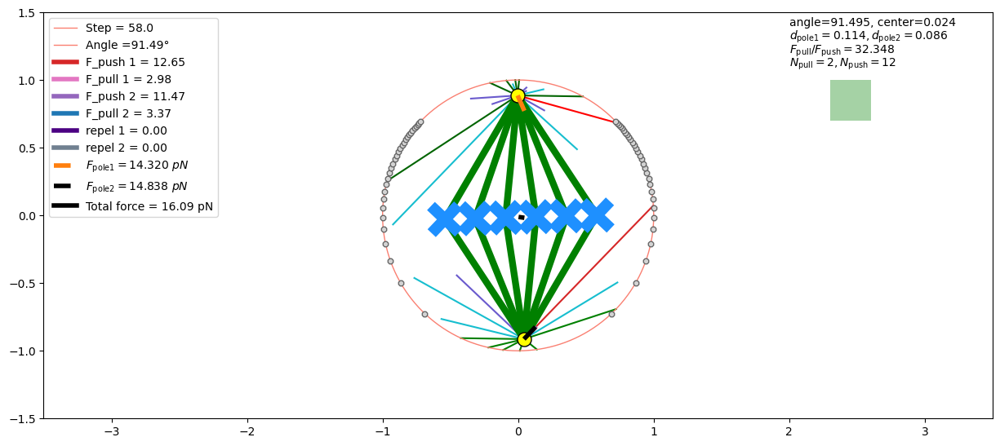

59-----------------------=++++++++++++++++++++=
torque=4.463651627569266
T=[0.         0.         4.46365163]
Tra velo=[ 0.00208892 -0.0012775   0.        ]
Ang velo=[0.         0.         0.00144857]


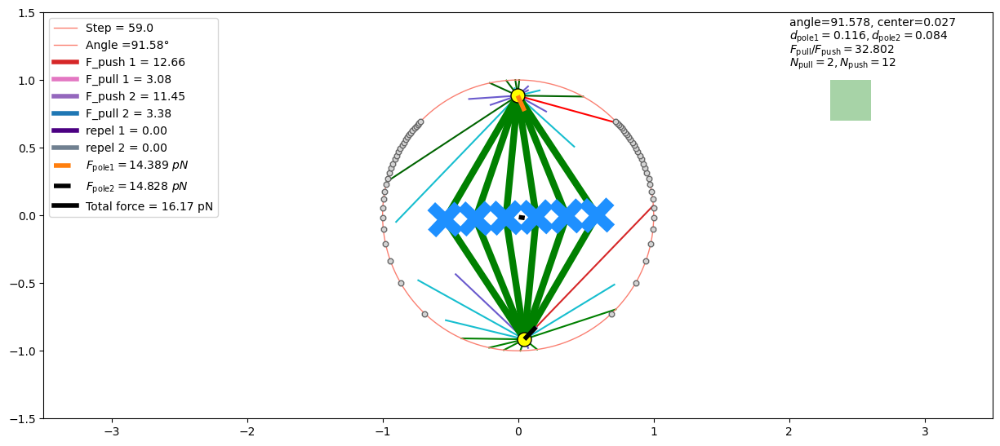

60-----------------------=++++++++++++++++++++=
torque=4.354709515330291
T=[0.         0.         4.35470952]
Tra velo=[ 0.0020915  -0.00130293  0.        ]
Ang velo=[0.         0.         0.00141322]


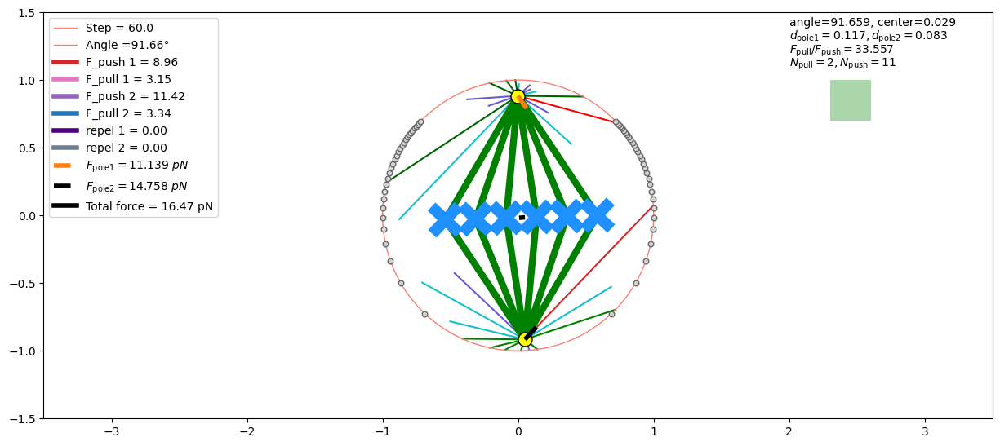

61-----------------------=++++++++++++++++++++=
torque=3.8870926317548777
T=[0.         0.         3.88709263]
Tra velo=[0.00209727 0.00061642 0.        ]
Ang velo=[0.         0.         0.00126146]


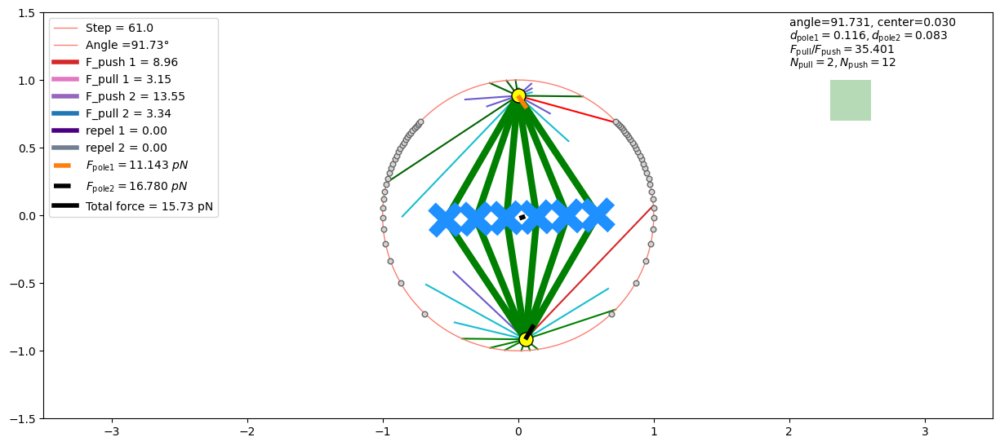

62-----------------------=++++++++++++++++++++=
torque=2.49821714699843
T=[0.         0.         2.49821715]
Tra velo=[0.00184838 0.00237546 0.        ]
Ang velo=[0.         0.         0.00081074]


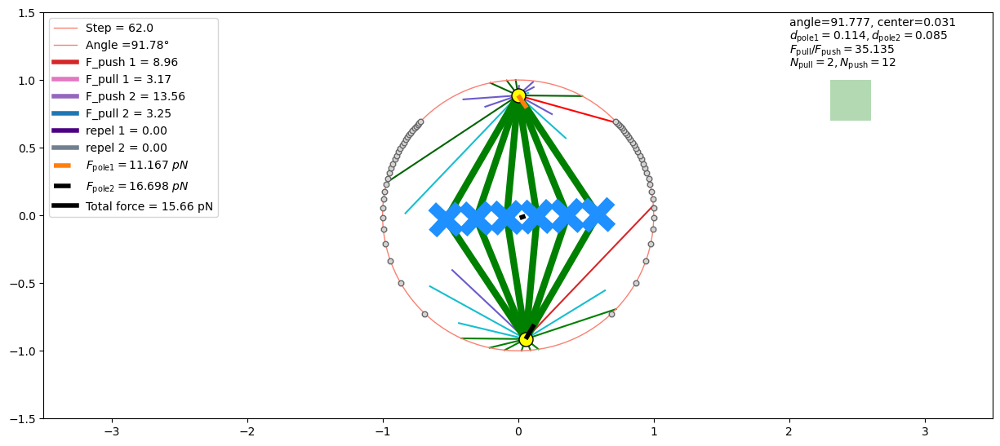

63-----------------------=++++++++++++++++++++=
torque=2.420011940623386
T=[0.         0.         2.42001194]
Tra velo=[0.00185227 0.00234577 0.        ]
Ang velo=[0.         0.         0.00078536]


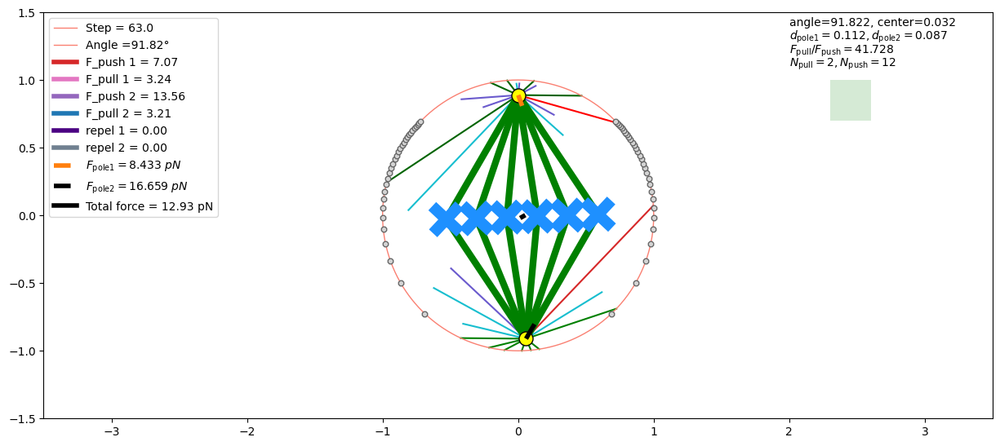

64-----------------------=++++++++++++++++++++=
torque=5.622730039673507
T=[0.         0.         5.62273004]
Tra velo=[0.00137292 0.0029947  0.        ]
Ang velo=[0.         0.         0.00182473]


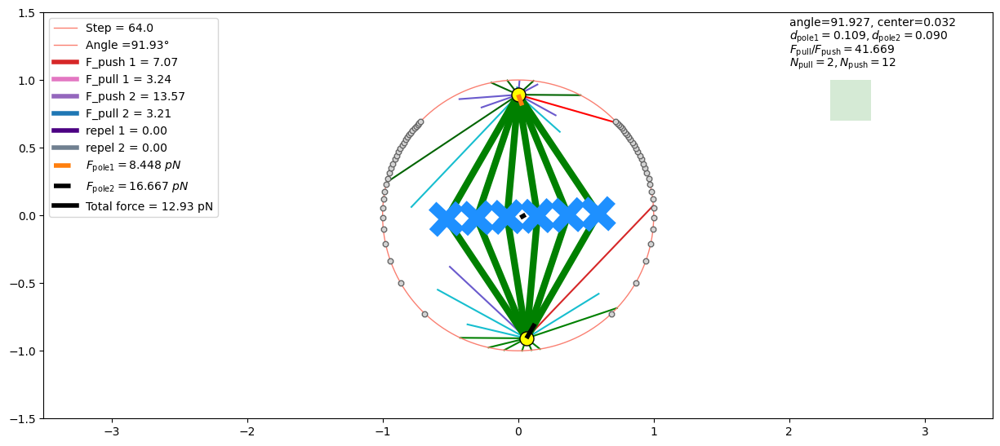

65-----------------------=++++++++++++++++++++=
torque=5.5788769369803095
T=[0.         0.         5.57887694]
Tra velo=[0.0013861  0.00298798 0.        ]
Ang velo=[0.         0.         0.00181049]


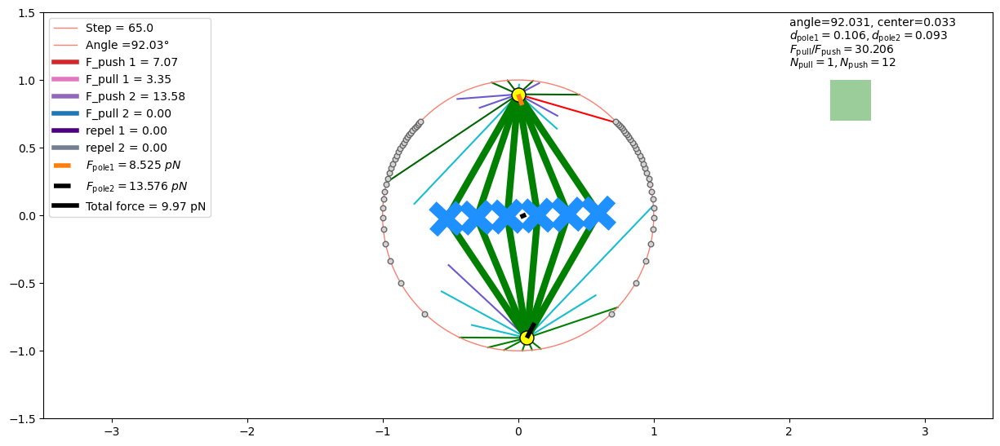

66-----------------------=++++++++++++++++++++=
torque=3.5054213322795627
T=[0.         0.         3.50542133]
Tra velo=[0.0011213  0.00187322 0.        ]
Ang velo=[0.        0.        0.0011376]


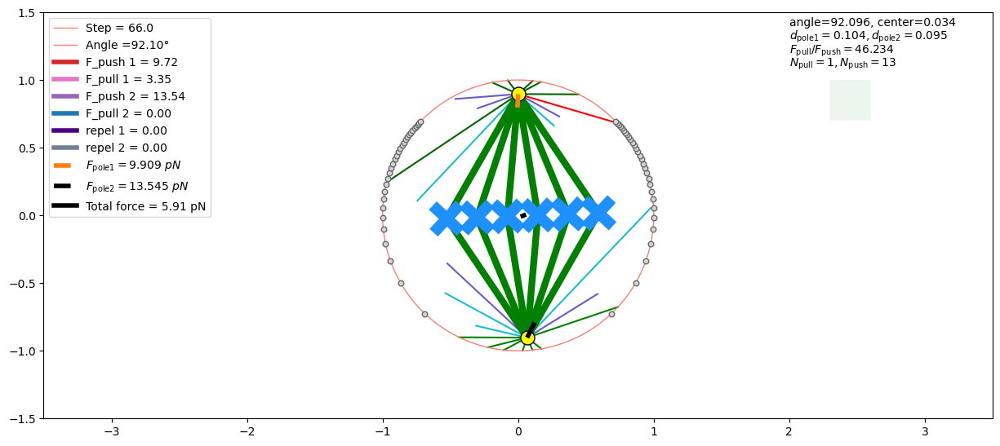

67-----------------------=++++++++++++++++++++=
torque=6.641547148391407
T=[0.         0.         6.64154715]
Tra velo=[0.00068357 0.00099875 0.        ]
Ang velo=[0.         0.         0.00215536]


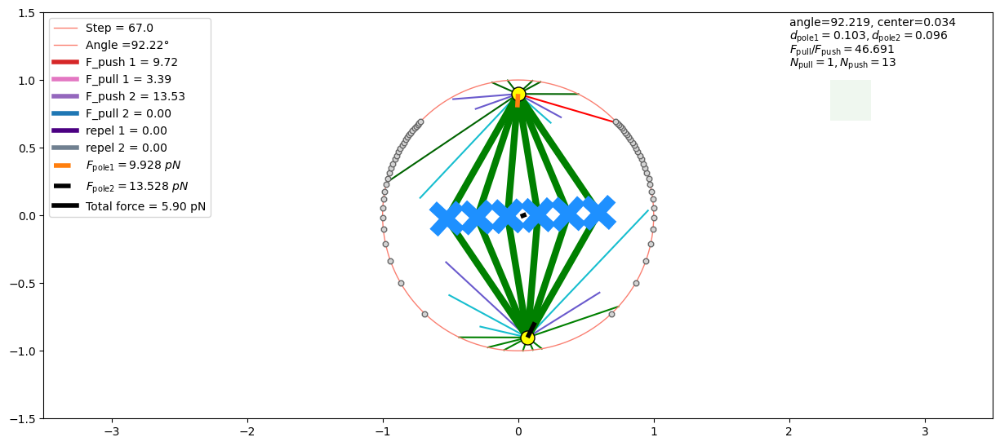

68-----------------------=++++++++++++++++++++=
torque=6.540753385562748
T=[0.         0.         6.54075339]
Tra velo=[0.00068636 0.00098433 0.        ]
Ang velo=[0.         0.         0.00212265]


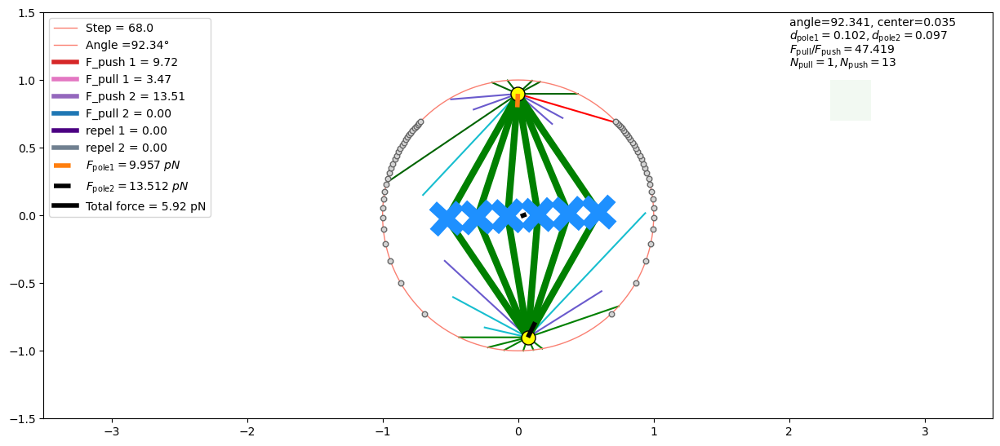

69-----------------------=++++++++++++++++++++=
torque=6.510701828329957
T=[0.         0.         6.51070183]
Tra velo=[0.00067893 0.000982   0.        ]
Ang velo=[0.        0.        0.0021129]


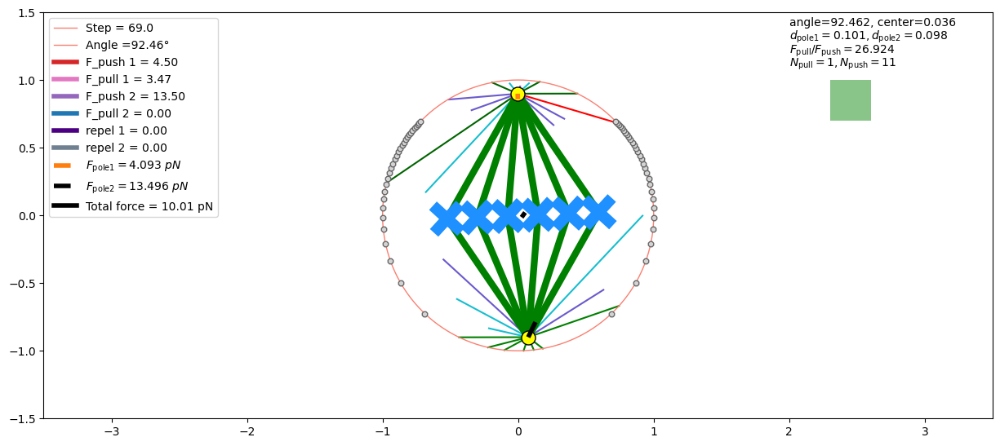

70-----------------------=++++++++++++++++++++=
torque=5.824332835406344
T=[0.         0.         5.82433284]
Tra velo=[0.00064424 0.00380426 0.        ]
Ang velo=[0.         0.         0.00189015]


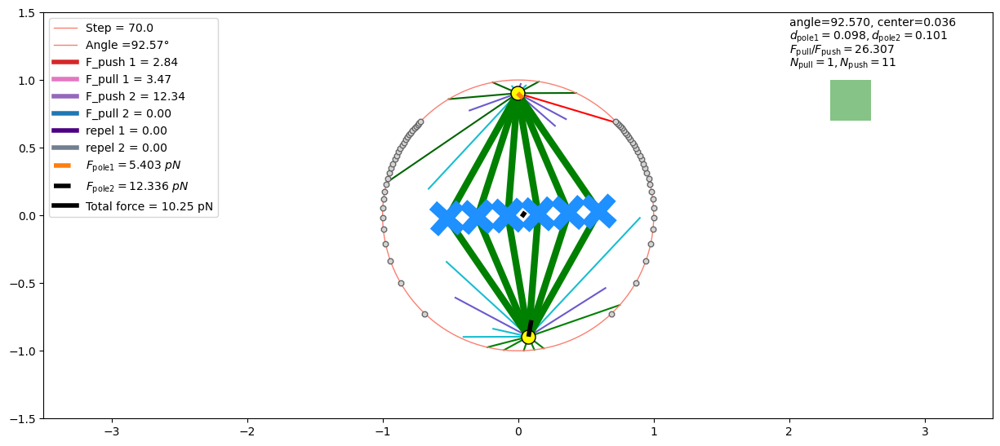

71-----------------------=++++++++++++++++++++=
torque=-1.0095833146060653
T=[ 0.          0.         -1.00958331]
Tra velo=[0.00063533 0.00394498 0.        ]
Ang velo=[ 0.          0.         -0.00032764]


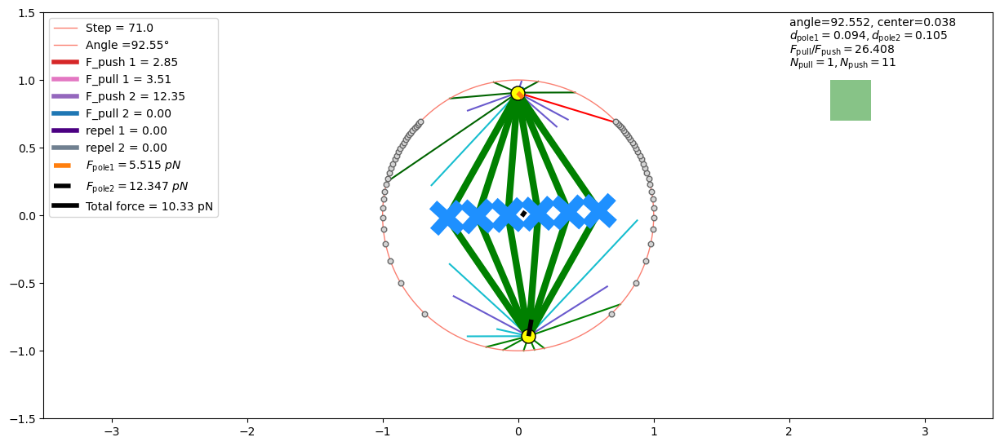

72-----------------------=++++++++++++++++++++=
torque=-1.0854980235567875
T=[ 0.          0.         -1.08549802]
Tra velo=[0.00065336 0.00394256 0.        ]
Ang velo=[ 0.          0.         -0.00035227]


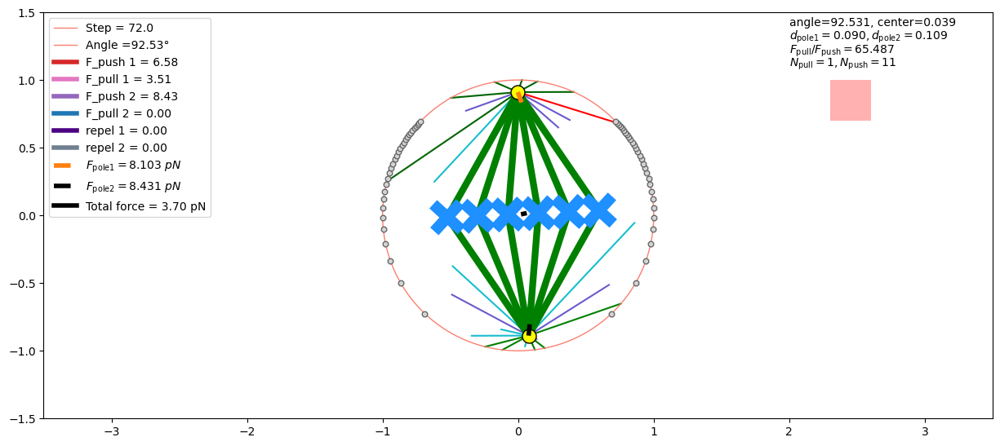

73-----------------------=++++++++++++++++++++=
torque=-1.1507776713003732
T=[ 0.          0.         -1.15077767]
Tra velo=[0.0004549  0.00032479 0.        ]
Ang velo=[ 0.          0.         -0.00037346]


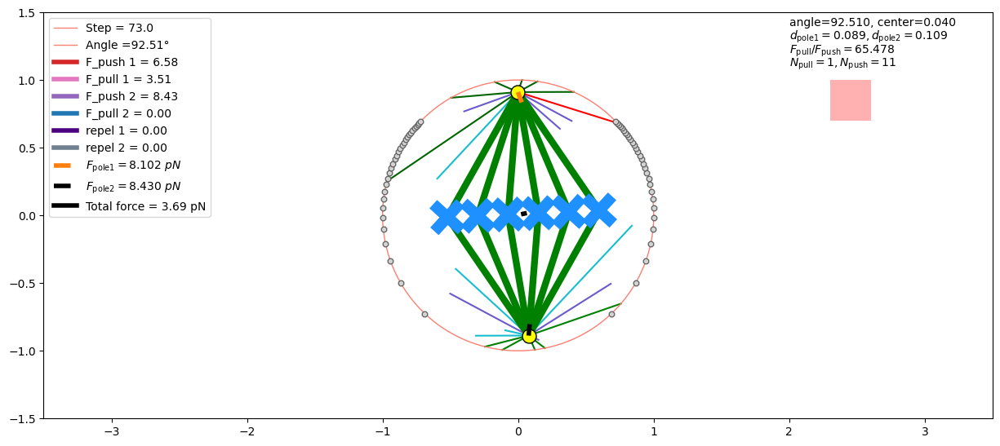

74-----------------------=++++++++++++++++++++=
torque=-1.1532958327931493
T=[ 0.          0.         -1.15329583]
Tra velo=[0.00045512 0.00032327 0.        ]
Ang velo=[ 0.          0.         -0.00037428]


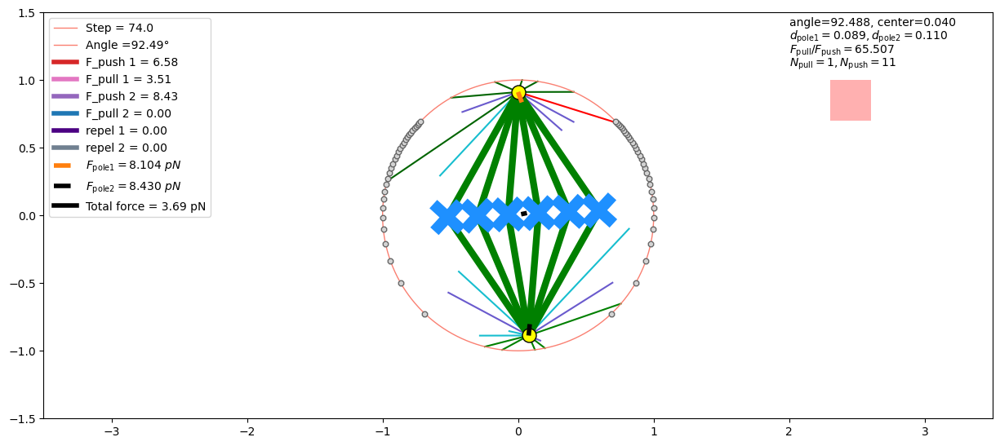

75-----------------------=++++++++++++++++++++=
torque=-1.153497843125611
T=[ 0.          0.         -1.15349784]
Tra velo=[0.000455   0.00032218 0.        ]
Ang velo=[ 0.          0.         -0.00037434]


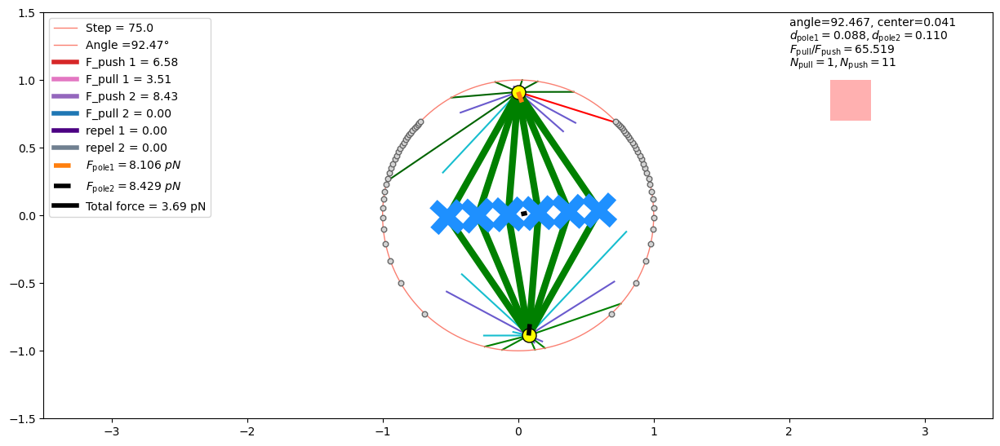

76-----------------------=++++++++++++++++++++=
torque=-1.1537696012120717
T=[ 0.         0.        -1.1537696]
Tra velo=[0.00045488 0.00032108 0.        ]
Ang velo=[ 0.          0.         -0.00037443]


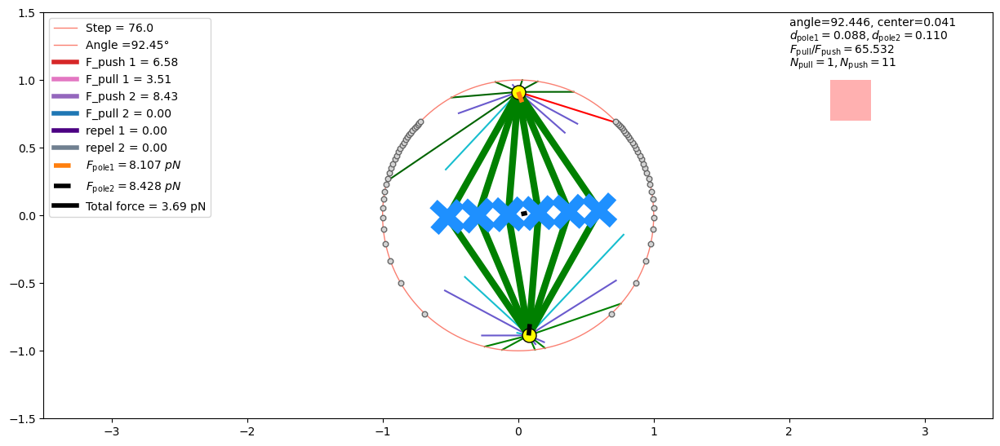

77-----------------------=++++++++++++++++++++=
torque=-1.1540444436908872
T=[ 0.          0.         -1.15404444]
Tra velo=[0.00045476 0.00031998 0.        ]
Ang velo=[ 0.          0.         -0.00037452]


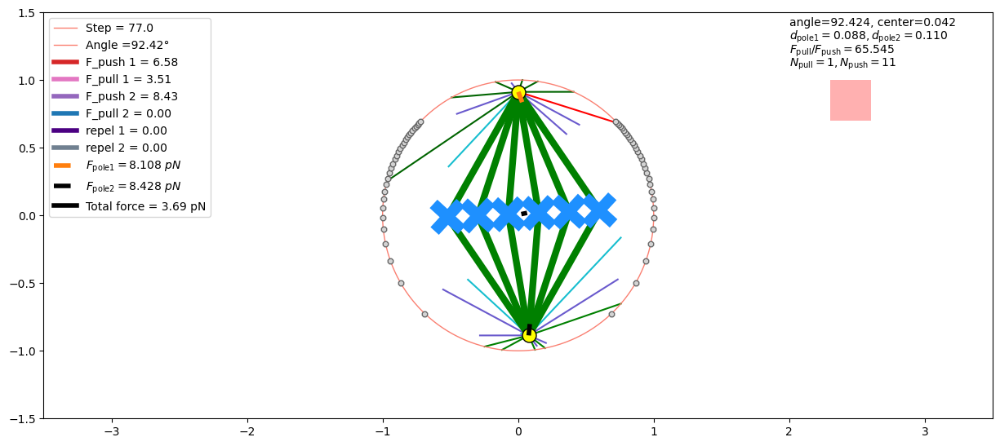

78-----------------------=++++++++++++++++++++=
torque=-1.1543242296526488
T=[ 0.          0.         -1.15432423]
Tra velo=[0.00045464 0.00031888 0.        ]
Ang velo=[ 0.          0.         -0.00037461]


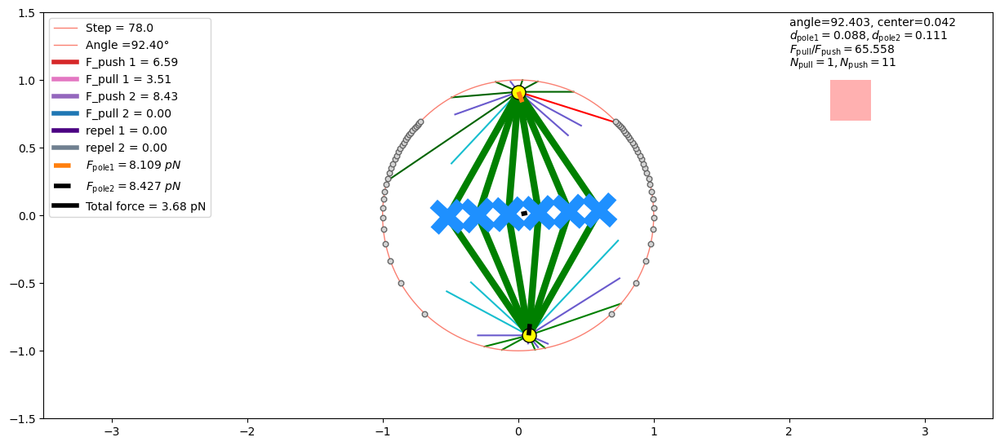

79-----------------------=++++++++++++++++++++=
torque=-1.1546089036986318
T=[ 0.         0.        -1.1546089]
Tra velo=[0.00045452 0.00031779 0.        ]
Ang velo=[ 0.         0.        -0.0003747]


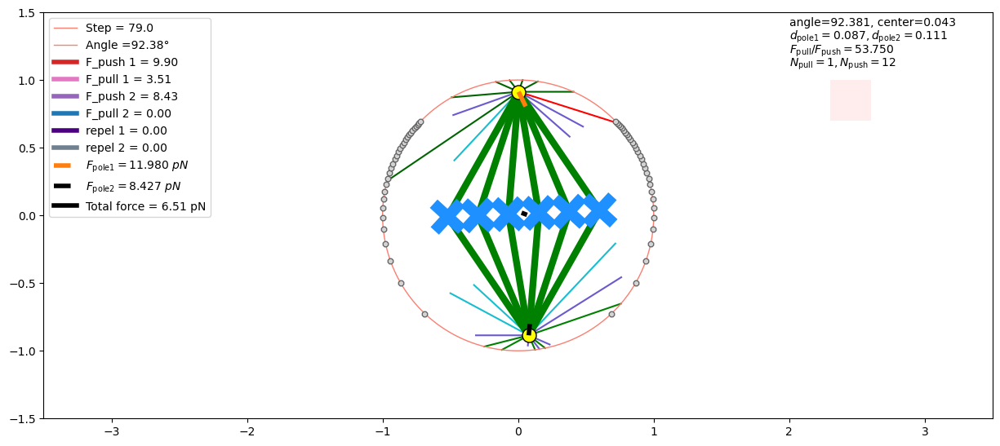

80-----------------------=++++++++++++++++++++=
torque=-3.24677499933464
T=[ 0.        0.       -3.246775]
Tra velo=[ 0.00081866 -0.00124329  0.        ]
Ang velo=[ 0.          0.         -0.00105366]


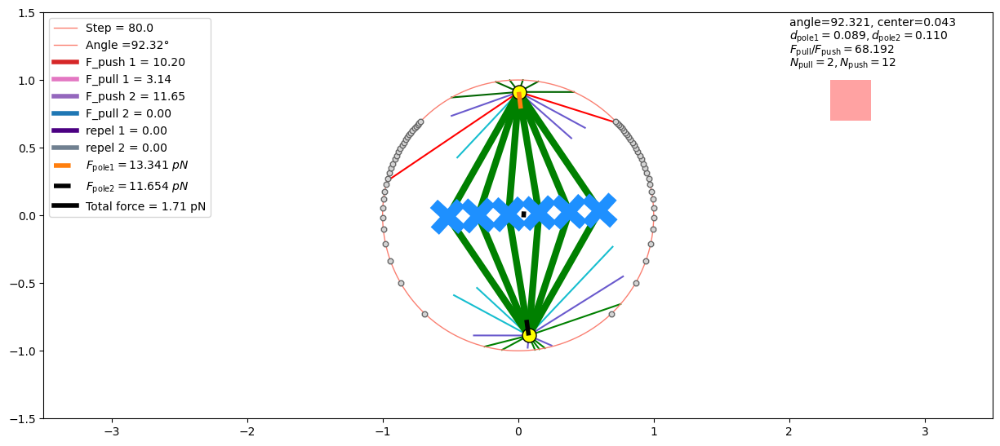

81-----------------------=++++++++++++++++++++=
torque=-1.8723374246508775
T=[ 0.          0.         -1.87233742]
Tra velo=[ 7.42370429e-07 -8.12412154e-04  0.00000000e+00]
Ang velo=[ 0.          0.         -0.00060762]


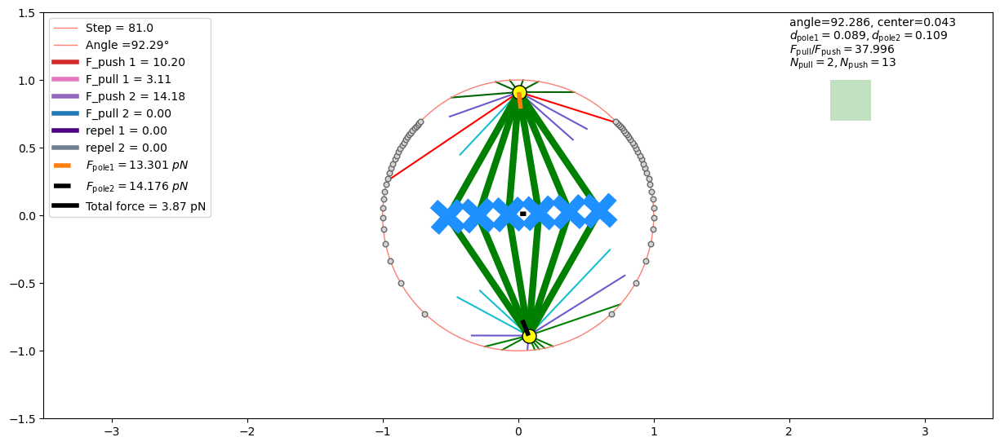

82-----------------------=++++++++++++++++++++=
torque=-5.336833870166734
T=[ 0.          0.         -5.33683387]
Tra velo=[-4.64453342e-04  2.59785490e-05  0.00000000e+00]
Ang velo=[ 0.          0.         -0.00173194]


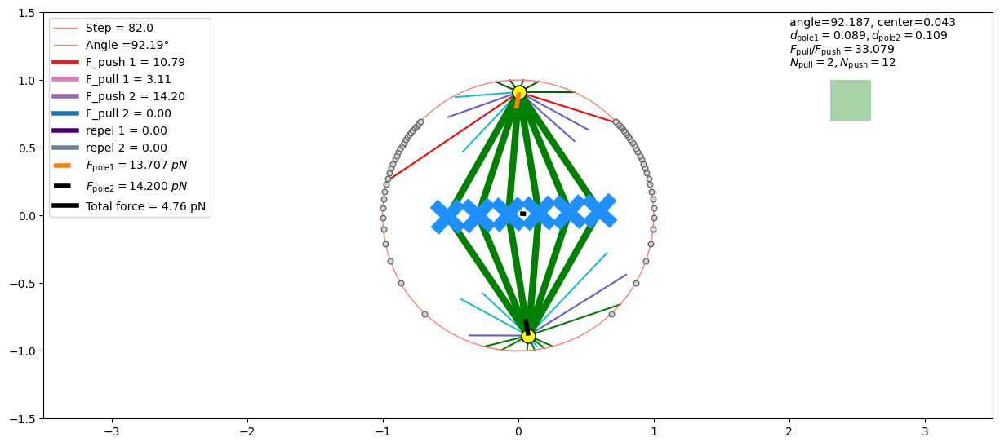

83-----------------------=++++++++++++++++++++=
torque=0.6250145746918303
T=[0.         0.         0.62501457]
Tra velo=[-0.00060013  0.00028526  0.        ]
Ang velo=[0.         0.         0.00020283]


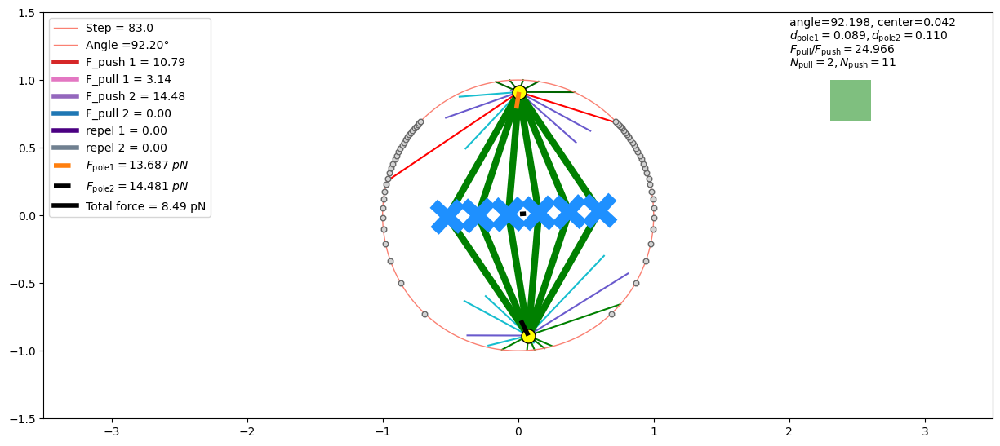

84-----------------------=++++++++++++++++++++=
torque=-2.9305415778683677
T=[ 0.          0.         -2.93054158]
Tra velo=[-0.00108213 -0.0001317   0.        ]
Ang velo=[ 0.          0.         -0.00095104]


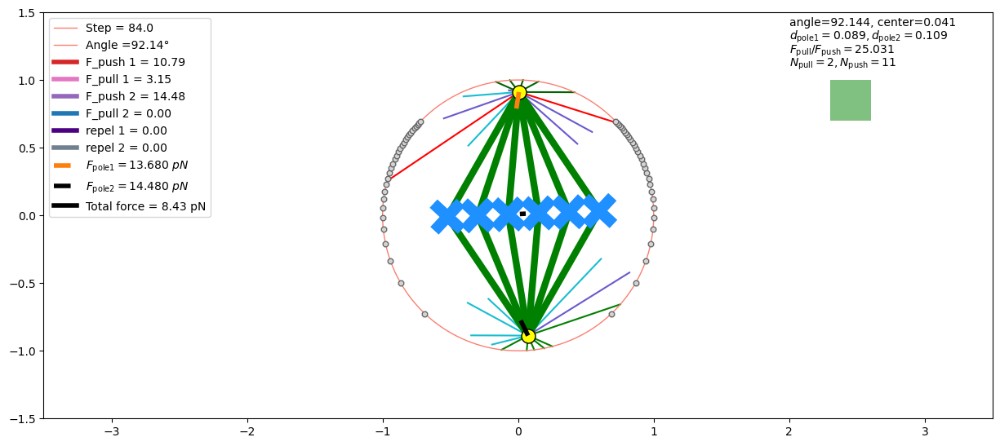

85-----------------------=++++++++++++++++++++=
torque=-3.085367764968716
T=[ 0.          0.         -3.08536776]
Tra velo=[-0.00105862 -0.00011685  0.        ]
Ang velo=[ 0.          0.         -0.00100128]


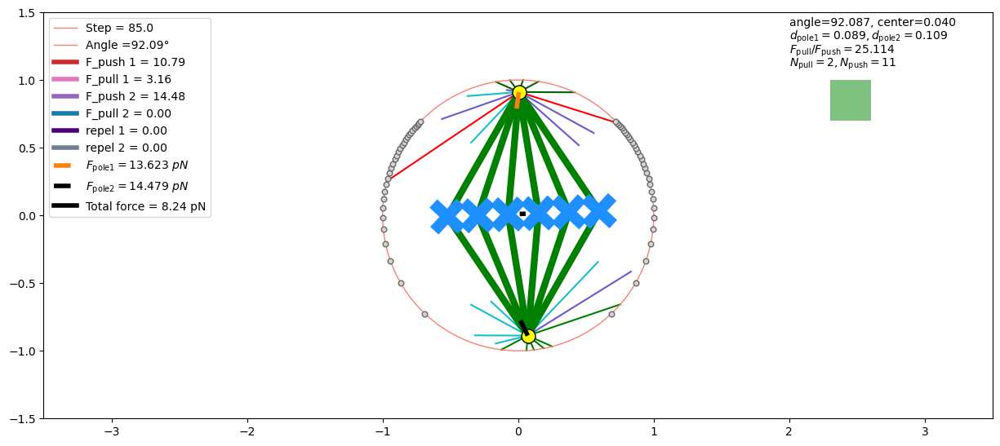

86-----------------------=++++++++++++++++++++=
torque=-3.0738260136422624
T=[ 0.          0.         -3.07382601]
Tra velo=[-0.00105847 -0.00011459  0.        ]
Ang velo=[ 0.          0.         -0.00099754]


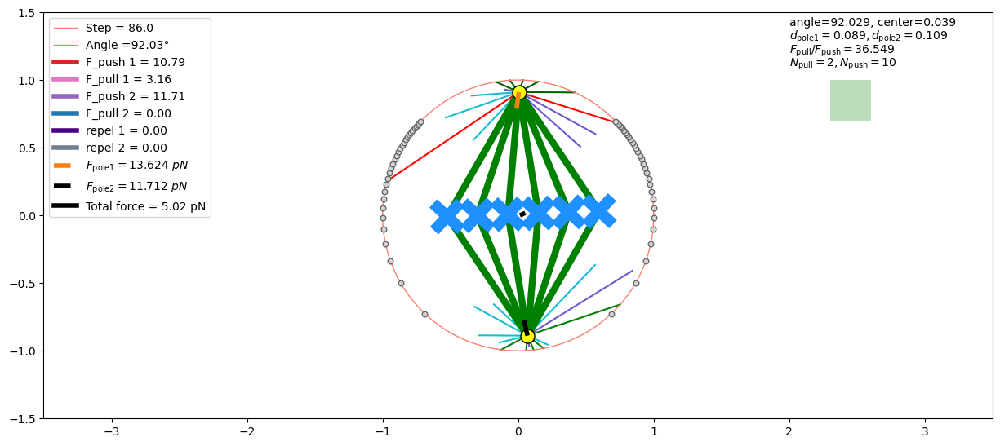

87-----------------------=++++++++++++++++++++=
torque=0.16433219375987562
T=[0.         0.         0.16433219]
Tra velo=[-0.00056499 -0.00094423  0.        ]
Ang velo=[0.00000000e+00 0.00000000e+00 5.33301648e-05]


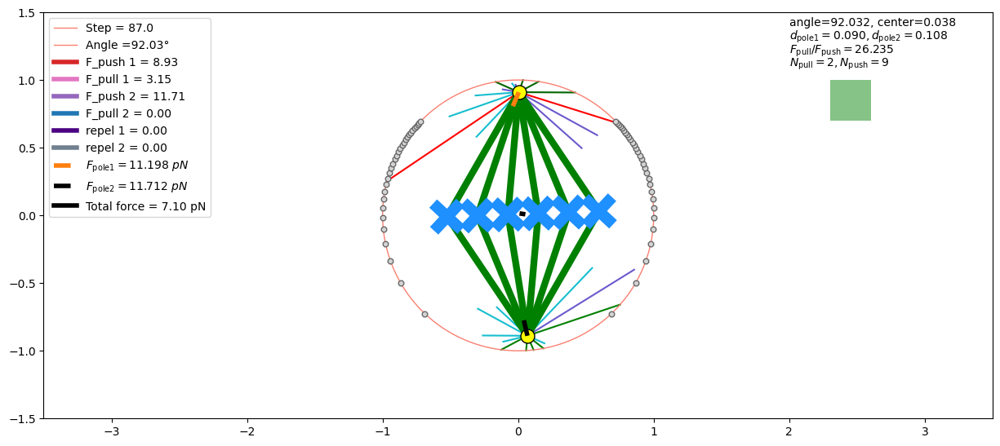

88-----------------------=++++++++++++++++++++=
torque=2.3931588210455517
T=[0.         0.         2.39315882]
Tra velo=[-0.00093995  0.00062252  0.        ]
Ang velo=[0.         0.         0.00077664]


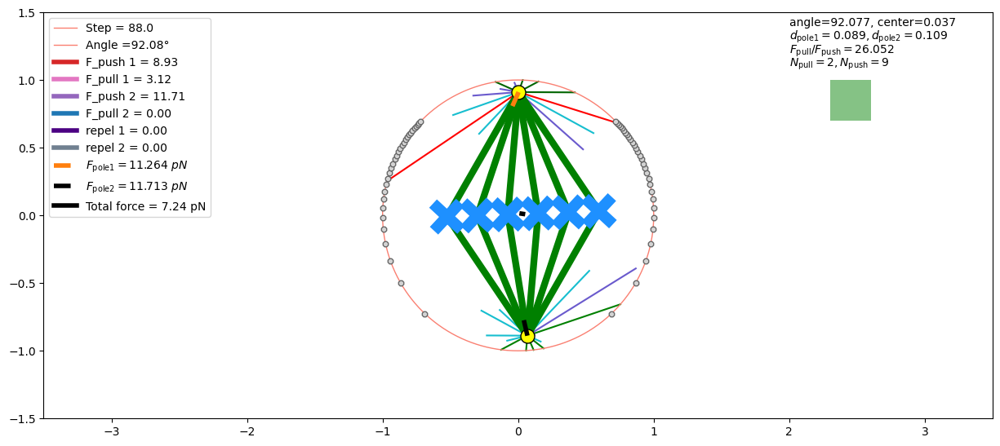

89-----------------------=++++++++++++++++++++=
torque=2.3141844728425793
T=[0.         0.         2.31418447]
Tra velo=[-0.00092589  0.00060897  0.        ]
Ang velo=[0.         0.         0.00075101]


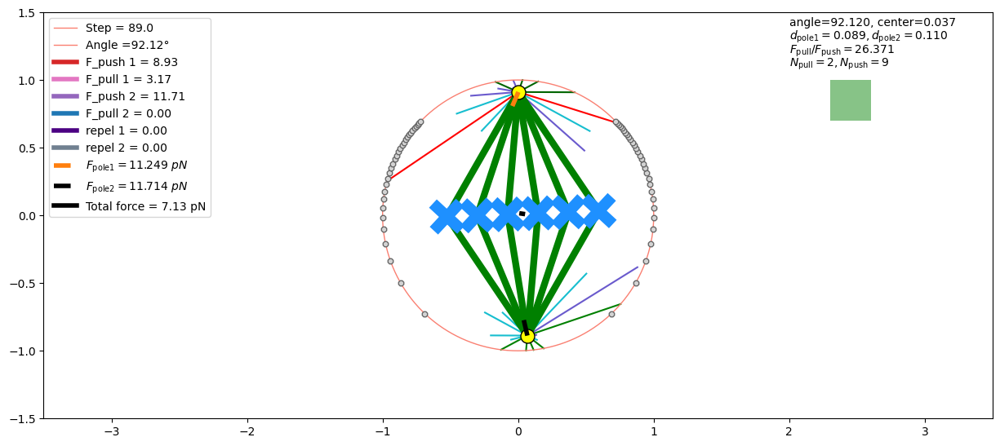

90-----------------------=++++++++++++++++++++=
torque=2.3283019250263193
T=[0.         0.         2.32830193]
Tra velo=[-0.00092564  0.00060767  0.        ]
Ang velo=[0.        0.        0.0007556]


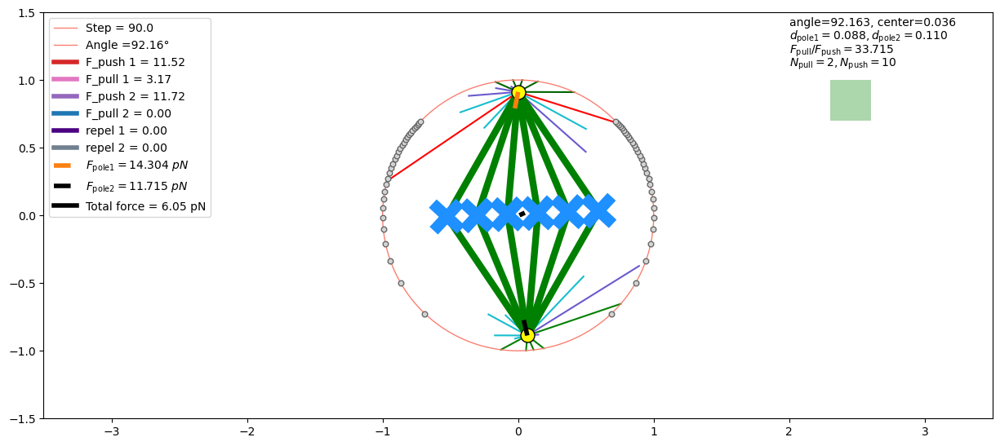

91-----------------------=++++++++++++++++++++=
torque=1.0296279779422328
T=[0.         0.         1.02962798]
Tra velo=[-0.00066981 -0.00118667  0.        ]
Ang velo=[0.         0.         0.00033414]


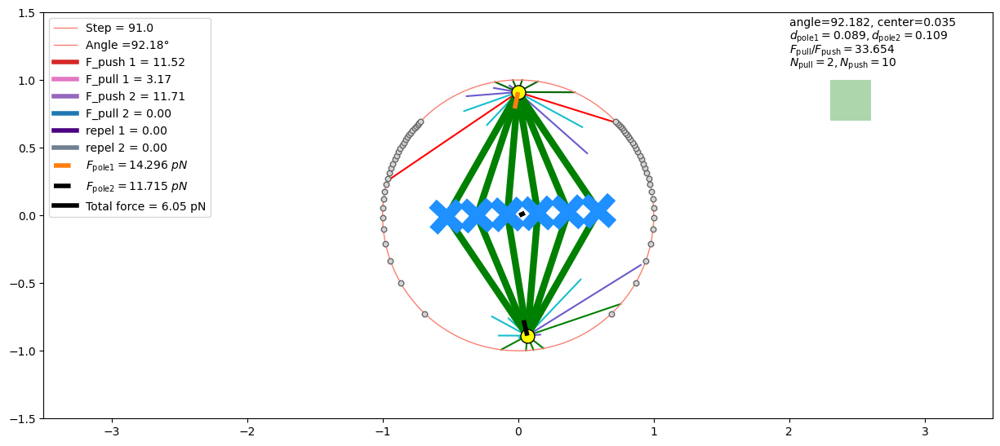

92-----------------------=++++++++++++++++++++=
torque=1.072874917270602
T=[0.         0.         1.07287492]
Tra velo=[-0.00067707 -0.00116678  0.        ]
Ang velo=[0.         0.         0.00034818]


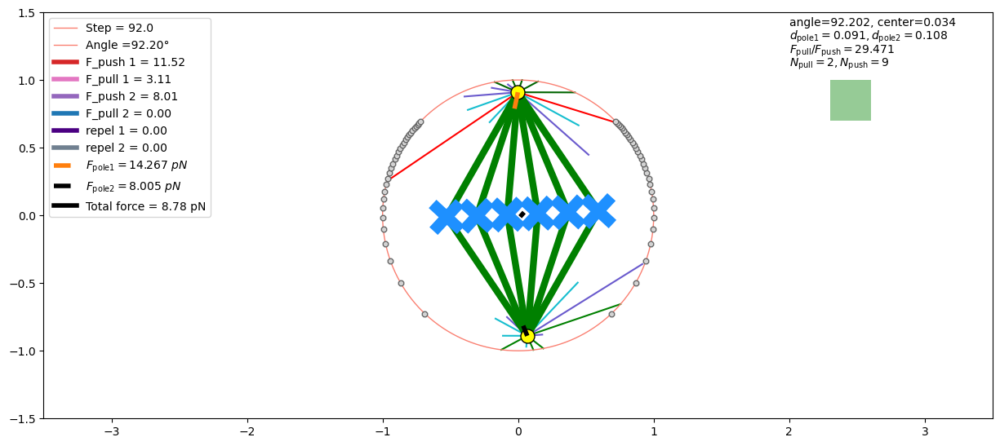

93-----------------------=++++++++++++++++++++=
torque=0.622588802410863
T=[0.        0.        0.6225888]
Tra velo=[-0.00066661 -0.0030839   0.        ]
Ang velo=[0.         0.         0.00020205]


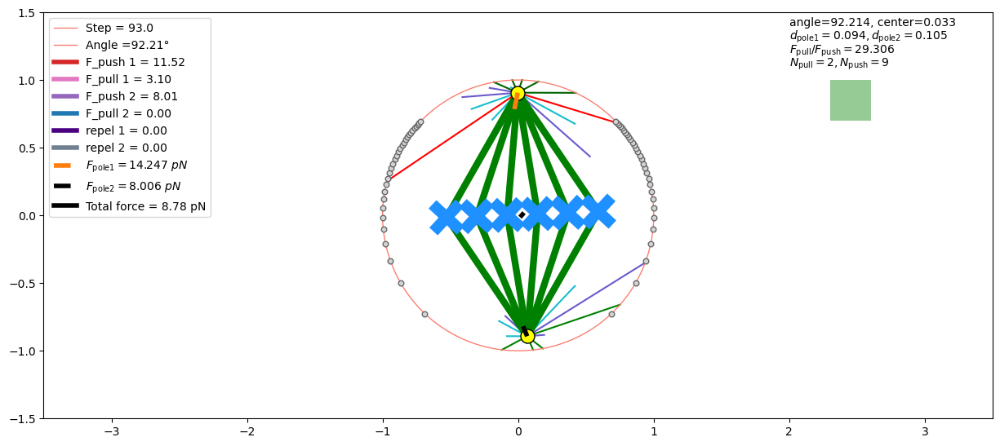

94-----------------------=++++++++++++++++++++=
torque=0.5737970042638656
T=[0.       0.       0.573797]
Tra velo=[-0.00066397 -0.00305498  0.        ]
Ang velo=[0.         0.         0.00018621]


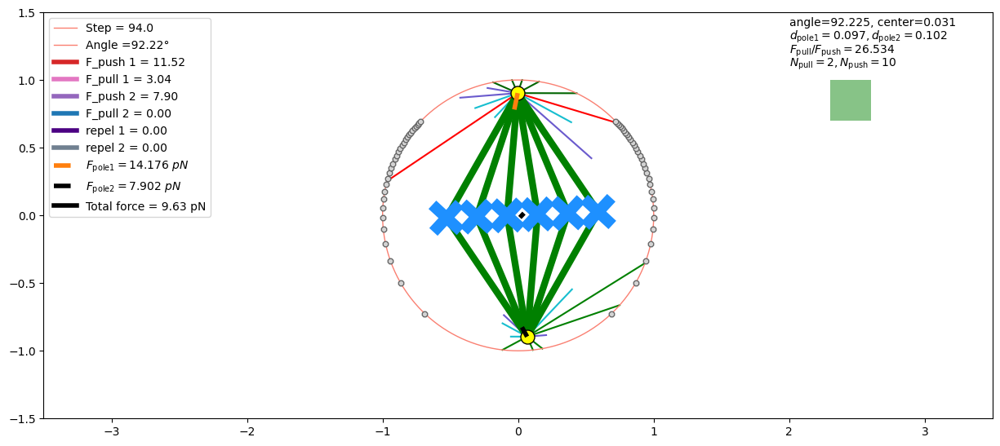

95-----------------------=++++++++++++++++++++=
torque=-0.1744493174811872
T=[ 0.          0.         -0.17444932]
Tra velo=[-0.00076166 -0.00327771  0.        ]
Ang velo=[ 0.00000000e+00  0.00000000e+00 -5.66134404e-05]


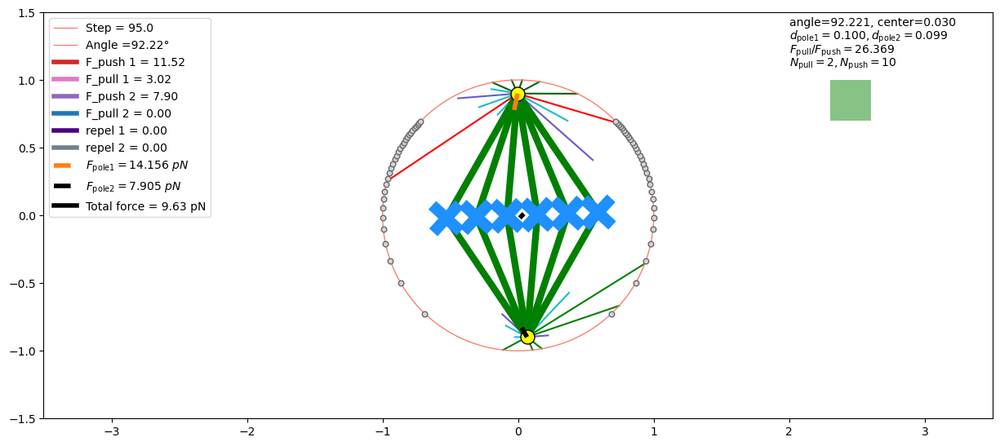

96-----------------------=++++++++++++++++++++=
torque=-0.2281592786798523
T=[ 0.          0.         -0.22815928]
Tra velo=[-0.00075916 -0.00326636  0.        ]
Ang velo=[ 0.00000000e+00  0.00000000e+00 -7.40437504e-05]


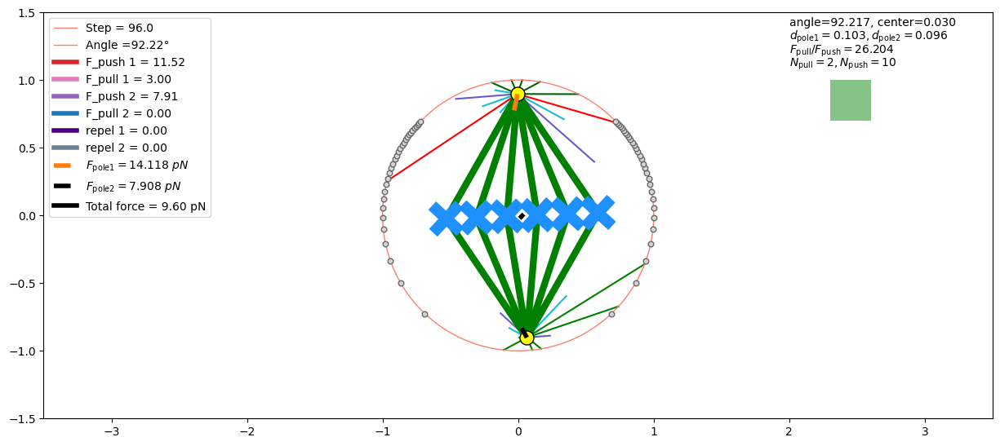

97-----------------------=++++++++++++++++++++=
torque=-0.24613244456927008
T=[ 0.          0.         -0.24613244]
Tra velo=[-0.00076184 -0.00325937  0.        ]
Ang velo=[ 0.00000000e+00  0.00000000e+00 -7.98765204e-05]


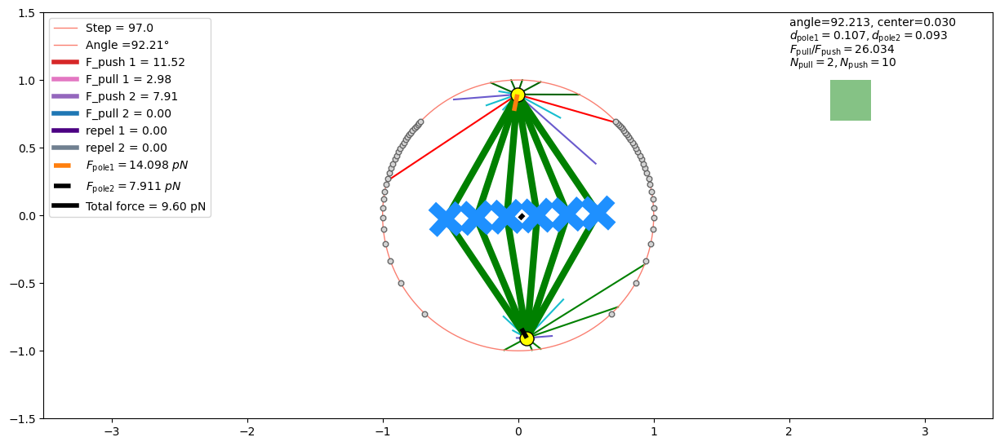

98-----------------------=++++++++++++++++++++=
torque=-0.2662719826739175
T=[ 0.          0.         -0.26627198]
Tra velo=[-0.00076438 -0.00325232  0.        ]
Ang velo=[ 0.00000000e+00  0.00000000e+00 -8.64123358e-05]


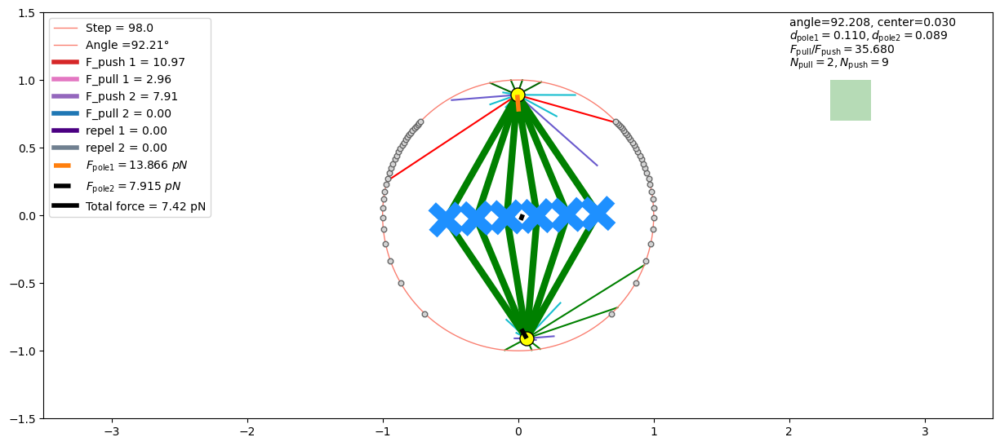

99-----------------------=++++++++++++++++++++=
torque=-3.883710172989063
T=[ 0.          0.         -3.88371017]
Tra velo=[-0.00024997 -0.00330537  0.        ]
Ang velo=[ 0.          0.         -0.00126037]


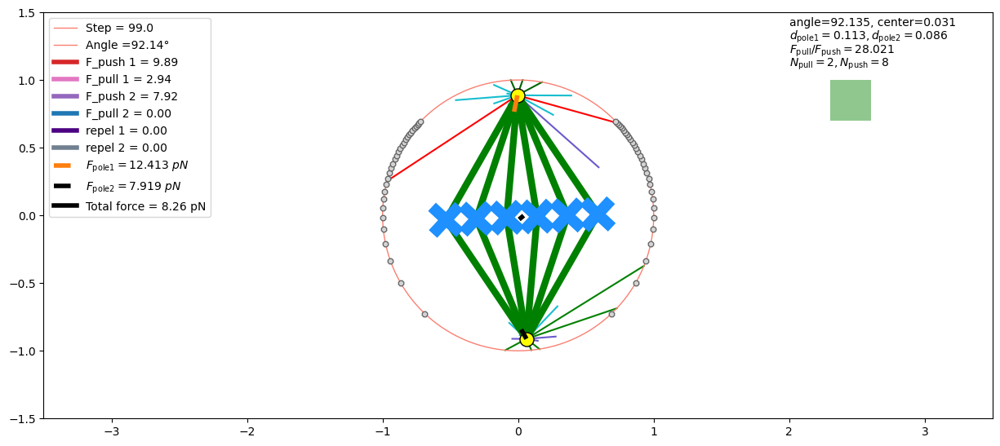

100-----------------------=++++++++++++++++++++=
torque=-0.5132880213386279
T=[ 0.          0.         -0.51328802]
Tra velo=[-0.00077412 -0.00247568  0.        ]
Ang velo=[ 0.          0.         -0.00016658]


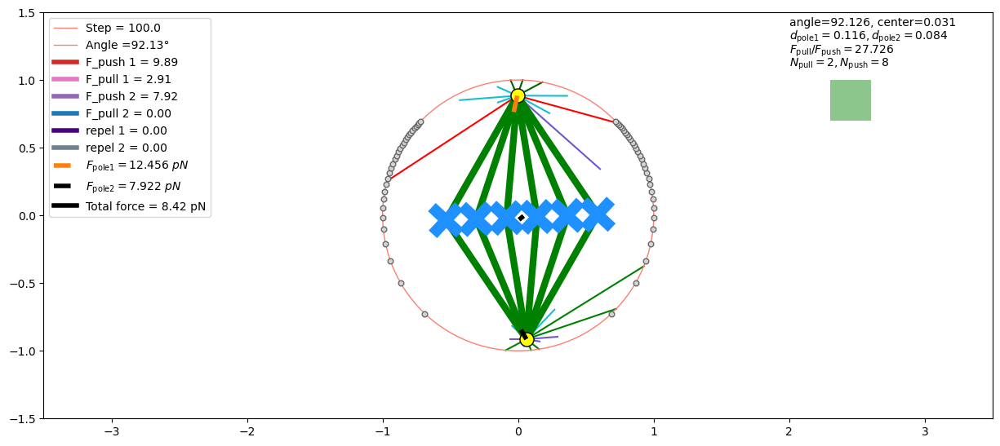

101-----------------------=++++++++++++++++++++=


In [7]:
# junc_ind=[[800, 1230], [800,1180], [725, 1255],[750, 1225], [750, 1200],  [580, 770], [510,750], [480, 730], [450, 730], [430, 720], [420,700], [410,670]]      
df_angle, df_center,df_ypos, df_count_push, df_count_pull, df_length=plot_simulate([[a,b,r,drag[0]],motor_density[0],astral_number[0],sp_angle[int(task_id-1)],[angle_lim[0], center_lim[0]],  folder_name, new_dir_path])